# Info
Purpose:

    Load the HITRAN - API and use it to convolve the 4STAR (s) spectra and get the convolved gas corss sections
    
Input:

    None

Output:

    Figure and save files

Keywords:

    none

Dependencies:

    - numpy
    - matpotlib
    - hapi
    - path_utils

Needed Files:
  - ?

Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2022-05-13
    Modified:


# Prepare python environment

In [2]:
import numpy as np
from path_utils import getpath
import matplotlib.pyplot as plt
%matplotlib notebook
import os
import hapi

HAPI version: 1.2.2.0
To get the most up-to-date version please check http://hitran.org/hapi
ATTENTION: Python versions of partition sums from TIPS-2021 are now available in HAPI code

           MIT license: Copyright 2021 HITRAN team, see more at http://hitran.org. 

           If you use HAPI in your research or software development,
           please cite it using the following reference:
           R.V. Kochanov, I.E. Gordon, L.S. Rothman, P. Wcislo, C. Hill, J.S. Wilzewski,
           HITRAN Application Programming Interface (HAPI): A comprehensive approach
           to working with spectroscopic data, J. Quant. Spectrosc. Radiat. Transfer 177, 15-30 (2016)
           DOI: 10.1016/j.jqsrt.2016.03.005

           ATTENTION: This is the core version of the HITRAN Application Programming Interface.
                      For more efficient implementation of the absorption coefficient routine, 
                      as well as for new profiles, parameters and other functional,
      

In [51]:
from importlib import reload
reload(hapi)

<module 'hapi' from '/home/sam/.local/lib/python3.8/site-packages/hapi/__init__.py'>

In [3]:
import scipy.io as sio

In [4]:
name = '4star_data'
vv = 'v1'
fp = getpath(name)


Return path named:  4star_data /home/sam/4STAR_codes/data_folder/


In [5]:
fph = getpath('HITRAN')

Return path named:  HITRAN /scratch/rtm/HITRAN/


Identify the various trace gas to account and make cross sections

For vis spectrometer  

 - no2_220K_conv_4starb.xs
 - no2_254K_conv_4starb.xs
 - no2_298K_conv_4starb.xs
 - o3_223K_conv_4starb.xs
 - o2_1013mbar_conv_4starb.xs
 - o4_296K_conv_4starb_vis.xs
 - hcho_293K_conv_4starb.xs
 - 
 
 Water:
 - h20_1013mbar_294K_conv_4starb.xs
 - h20_902mbar_289K_conv_4starb.xs
 - h20_802mbar_285K_conv_4starb.xs
 - h20_710mbar_279K_conv_4starb.xs
 - h20_628mbar_273K_conv_4starb.xs
 - h20_554mbar_267K_conv_4starb.xs
 - h20_487mbar_261K_conv_4starb.xs
 - h20_426mbar_254K_conv_4starb.xs
 - h20_372mbar_248K_conv_4starb.xs
 - h20_324mbar_241K_conv_4starb.xs
 - h20_281mbar_235K_conv_4starb.xs

For NIR spectrometer  
 - ch4_1013mbar_conv_4starb_nir.xs
 - co2_1013mbar_conv_4starb_nir.xs
 - o4_296K_conv_4starb_nir.xs


# Load files

## Load the 4STARB wavelength and FWHM

In [103]:
s = sio.loadmat(fp+'4STARB_FWHM_combinedlinelamps_20220507.mat')

In [104]:
s.keys()

dict_keys(['__header__', '__version__', '__globals__', 'fwhm_nir', 'fwhm_vis', 'nir_nm', 'vis_nm'])

# Load the HAPI molecules and crosssections

In [13]:
wvn_2_wvl = lambda x: 1.0e4 / x
wvl_2_wvn = lambda x: 1.0e4 / x

#wvl in micron
#wvn in cm^-1

In [59]:
hapi.db_begin(fph)

Using /scratch/rtm/HITRAN/

H2O
                     Lines parsed: 229401
CO2
                     Lines parsed: 40753
O2
                     Lines parsed: 1402
O3
                     Lines parsed: 10374
CH4
                     Lines parsed: 92243
sampletab
                     Lines parsed: 3
CO
                     Lines parsed: 495
627f2951
                     Lines parsed: 43921
NO2
                     Lines parsed: 43921
HCOH
                     Lines parsed: 40670


In [289]:
# get the o2-o2 cross sections
!wget https://hitran.org/data/CIA/O2-O2_2018b.cia -P $fph

In [300]:
#get the ozone cross sections
!wget "http://joseba.mpch-mainz.mpg.de/spectral_atlas_data/cross_sections/Ozone/O3_Serdyuchenko(2014)_223K_213-1100nm(2013%20version).txt" -P $fph
!wget "http://joseba.mpch-mainz.mpg.de/spectral_atlas_data/cross_sections/Ozone/O3_Serdyuchenko(2014)_293K_213-1100nm(2013%20version).txt" -P $fph
    
fo3_223k = 'O3_Serdyuchenko(2014)_223K_213-1100nm(2013 version).txt'
fo3_293k = 'O3_Serdyuchenko(2014)_293K_213-1100nm(2013 version).txt'

# in nm

--2022-05-15 10:12:02--  http://joseba.mpch-mainz.mpg.de/spectral_atlas_data/cross_sections/Ozone/O3_Serdyuchenko(2014)_223K_213-1100nm(2013%20version).txt
Resolving joseba.mpch-mainz.mpg.de (joseba.mpch-mainz.mpg.de)... 192.67.218.181
Connecting to joseba.mpch-mainz.mpg.de (joseba.mpch-mainz.mpg.de)|192.67.218.181|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1873537 (1.8M) [text/plain]
Saving to: ‘/scratch/rtm/HITRAN/O3_Serdyuchenko(2014)_223K_213-1100nm(2013 version).txt’

O3_Serdyuchenko(201 100%[===================>]   1.79M   499KB/s    in 3.7s    

2022-05-15 10:12:06 (499 KB/s) - ‘/scratch/rtm/HITRAN/O3_Serdyuchenko(2014)_223K_213-1100nm(2013 version).txt’ saved [1873537/1873537]

--2022-05-15 10:12:07--  http://joseba.mpch-mainz.mpg.de/spectral_atlas_data/cross_sections/Ozone/O3_Serdyuchenko(2014)_293K_213-1100nm(2013%20version).txt
Resolving joseba.mpch-mainz.mpg.de (joseba.mpch-mainz.mpg.de)... 192.67.218.181
Connecting to joseba.mpch-mainz.mpg.de 

In [293]:
# get the ozone cross sections
!wget https://hitran.org/data/xsec/O3_293.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph
!wget https://hitran.org/data/xsec/O3_273.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph
!wget https://hitran.org/data/xsec/O3_253.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph
!wget https://hitran.org/data/xsec/O3_213.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph
!wget https://hitran.org/data/xsec/O3_193.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph
!wget https://hitran.org/data/xsec/O3_233.0K-0.0Torr_28901.0-40999.0_118.xsc -P $fph

--2022-05-15 09:31:11--  https://hitran.org/data/xsec/O3_293.0K-0.0Torr_28901.0-40999.0_118.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122310 (119K)
Saving to: ‘/scratch/rtm/HITRAN/O3_293.0K-0.0Torr_28901.0-40999.0_118.xsc’

O3_293.0K-0.0Torr_2 100%[===================>] 119.44K   516KB/s    in 0.2s    

2022-05-15 09:31:11 (516 KB/s) - ‘/scratch/rtm/HITRAN/O3_293.0K-0.0Torr_28901.0-40999.0_118.xsc’ saved [122310/122310]

--2022-05-15 09:31:11--  https://hitran.org/data/xsec/O3_273.0K-0.0Torr_28901.0-40999.0_118.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 122310 (119K)
Saving to: ‘/scratch/rtm/HITRAN/O3_273.0K-0.0Torr_28901.0-40999.0_118.xsc’

O3_273.0K-0.0Torr_2 100%[===================>] 119.44K   520KB/s    i

In [295]:
# get the NO2 cross sections
#!wget https://hitran.org/data/xsec/NO2_220.0_0.0_15002.0-42002.3_00.xsc -P $fph
#!wget https://hitran.org/data/xsec/NO2_294.0_0.0_15002.0-42002.3_00.xsc -P $fph
#http://spectrolab.aeronomie.be/data/no2_294_vis.zip #for mid-vis band, low alt
#http://spectrolab.aeronomie.be/data/no2_220_vis.zip #for mid-vis band, high alt


--2022-05-15 09:34:49--  https://hitran.org/data/xsec/NO2_220.0_0.0_15002.0-42002.3_00.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 282831 (276K)
Saving to: ‘/scratch/rtm/HITRAN/NO2_220.0_0.0_15002.0-42002.3_00.xsc’

NO2_220.0_0.0_15002 100%[===================>] 276.20K   702KB/s    in 0.4s    

2022-05-15 09:34:49 (702 KB/s) - ‘/scratch/rtm/HITRAN/NO2_220.0_0.0_15002.0-42002.3_00.xsc’ saved [282831/282831]

--2022-05-15 09:34:50--  https://hitran.org/data/xsec/NO2_294.0_0.0_15002.0-42002.3_00.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 282831 (276K)
Saving to: ‘/scratch/rtm/HITRAN/NO2_294.0_0.0_15002.0-42002.3_00.xsc’

NO2_294.0_0.0_15002 100%[===================>] 276.20K   898KB/s    in 0.3s    

2022-05-15 09

In [296]:
# get the NO2 cross sections
!wget https://hitran.org/data/xsec/H2CO_280.0_0.0_25919.6-33299.4_13.xsc -P $fph
!wget https://hitran.org/data/xsec/H2CO_290.0_0.0_25919.6-33299.4_13.xsc -P $fph
!wget https://hitran.org/data/xsec/H2CO_300.0_0.0_25919.6-33299.4_13.xsc -P $fph

--2022-05-15 09:42:13--  https://hitran.org/data/xsec/H2CO_280.0_0.0_25919.6-33299.4_13.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 305586 (298K)
Saving to: ‘/scratch/rtm/HITRAN/H2CO_280.0_0.0_25919.6-33299.4_13.xsc’

H2CO_280.0_0.0_2591 100%[===================>] 298.42K   890KB/s    in 0.3s    

2022-05-15 09:42:13 (890 KB/s) - ‘/scratch/rtm/HITRAN/H2CO_280.0_0.0_25919.6-33299.4_13.xsc’ saved [305586/305586]

--2022-05-15 09:42:14--  https://hitran.org/data/xsec/H2CO_290.0_0.0_25919.6-33299.4_13.xsc
Resolving hitran.org (hitran.org)... 131.142.195.62
Connecting to hitran.org (hitran.org)|131.142.195.62|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 305586 (298K)
Saving to: ‘/scratch/rtm/HITRAN/H2CO_290.0_0.0_25919.6-33299.4_13.xsc’

H2CO_290.0_0.0_2591 100%[===================>] 298.42K   869KB/s    in 0.3s    

2022-05-

In [294]:
!ls $fph

627f2951.data			     NO2.header
627f2951.header			     NO2.par
CH4.data			     O2.data
CH4.header			     O2.header
CO2.data			     O2-O2_2018b.cia
CO2.header			     O3_193.0K-0.0Torr_28901.0-40999.0_118.xsc
CO.data				     O3_213.0K-0.0Torr_28901.0-40999.0_118.xsc
CO.header			     O3_233.0K-0.0Torr_28901.0-40999.0_118.xsc
H2O.data			     O3_253.0K-0.0Torr_28901.0-40999.0_118.xsc
H2O.header			     O3_273.0K-0.0Torr_28901.0-40999.0_118.xsc
HCOH.data			     O3_293.0K-0.0Torr_28901.0-40999.0_118.xsc
HCOH.header			     O3.data
HCOH.par			     O3.header
hitran_atm_trace_gases_20220513.mat  sampletab.data
NO2.data			     sampletab.header


In [60]:
hapi.db_commit()

sampletab
CO2
O2
H2O
O3
CO
CH4
627f2951
NO2
HCOH


cs.no2_vis_220K_interp = interp1(no2_vis_220.data(:,1),no2_vis_220.data(:,2),cs.wln_4starb,'nearest','extrap')*Loschmidt;  
cs.no2_vis_254K_interp = interp1(no2_vis_254.data(:,1),no2_vis_254.data(:,2),cs.wln_4starb,'nearest','extrap')*Loschmidt;  
cs.no2_vis_298K_interp = interp1(no2_vis_298.data(:,1),no2_vis_298.data(:,2),cs.wln_4starb,'nearest','extrap')*Loschmidt;  
cs.o3_vis_223K_interp = interp1(o3_vis.data(:,1),o3_vis.data(:,2),cs.wln_4starb,'nearest','extrap')*Loschmidt;  
cs.o4_vis_296K_interp = interp1(o4_vis.data(:,1),o4_vis.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.o2_vis_1013mbar_interp = interp1(o2_vis.data(:,1),o2_vis.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.hcho_vis_293K_interp = interp1(hcho_vis.data(:,1),hcho_vis.data(:,2),cs.wln_4starb,'nearest','extrap')*Loschmidt;  
cs.h2o_vis_1013mbar_294K_interp = interp1(h2o_vis_1013mbar_294K.data(:,1),h2o_vis_1013mbar_294K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0902mbar_289K_interp = interp1(h2o_vis_0902mbar_289K.data(:,1),h2o_vis_0902mbar_289K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0802mbar_285K_interp = interp1(h2o_vis_0802mbar_285K.data(:,1),h2o_vis_0802mbar_285K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0710mbar_279K_interp = interp1(h2o_vis_0710mbar_279K.data(:,1),h2o_vis_0710mbar_279K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0628mbar_273K_interp = interp1(h2o_vis_0628mbar_273K.data(:,1),h2o_vis_0628mbar_273K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0554mbar_267K_interp = interp1(h2o_vis_0554mbar_267K.data(:,1),h2o_vis_0554mbar_267K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0487mbar_261K_interp = interp1(h2o_vis_0487mbar_261K.data(:,1),h2o_vis_0487mbar_261K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0426mbar_254K_interp = interp1(h2o_vis_0426mbar_254K.data(:,1),h2o_vis_0426mbar_254K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0372mbar_248K_interp = interp1(h2o_vis_0372mbar_248K.data(:,1),h2o_vis_0372mbar_248K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0324mbar_241K_interp = interp1(h2o_vis_0324mbar_241K.data(:,1),h2o_vis_0324mbar_241K.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.h2o_vis_0281mbar_235K_interp = interp1(h2o_vis_0281mbar_235K.data(:,1),h2o_vis_0281mbar_235K.data(:,2),cs.wln_4starb,'nearest','extrap');  

% interp nir  
cs.ch4_nir_1013mbar_interp = interp1(ch4_nir.data(:,1),ch4_nir.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.co2_nir_1013mbar_interp = interp1(co2_nir.data(:,1),co2_nir.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.o4_nir_296K_interp      = interp1(o4_nir.data(:,1),o4_nir.data(:,2),cs.wln_4starb,'nearest','extrap');  
cs.o4all = cs.o4_vis_296K_interp + cs.o4_nir_296K_interp;  

# Calculate the absorption coefficients for air with different pressures and temps

In [80]:
hapi.getHelp(hapi.absorptionCoefficient_SDVoigt)

Help on function absorptionCoefficient_SDVoigt in module hapi.hapi:

absorptionCoefficient_SDVoigt(*args, **kwargs)
    INPUT PARAMETERS: 
        Components:  list of tuples [(M,I,D)], where
                        M - HITRAN molecule number,
                        I - HITRAN isotopologue number,
                        D - relative abundance (optional)
        SourceTables:  list of tables from which to calculate cross-section   (optional)
        partitionFunction:  pointer to partition function (default is PYTIPS) (optional)
        Environment:  dictionary containing thermodynamic parameters.
                        'p' - pressure in atmospheres,
                        'T' - temperature in Kelvin
                        Default={'p':1.,'T':296.}
        WavenumberRange:  wavenumber range to consider.
        WavenumberStep:   wavenumber step to consider. 
        WavenumberWing:   absolute wing for calculating a lineshape (in cm-1) 
        WavenumberWingHW:  relative wing for c

In [265]:
gases = {'no2_vis_220K':{'SourceTables':'NO2','Diluent':{'air':1.0},'Environment':{'T':220.,'p':0.0286}},
         'no2_vis_254K':{'SourceTables':'NO2','Diluent':{'air':1.0},'Environment':{'T':254.,'p':540.0/1013.0}},
         'no2_vis_298K':{'SourceTables':'NO2','Diluent':{'air':1.0},'Environment':{'T':298.,'p':0.99}},
         'o3_vis_223K':{'SourceTables':'O3','Diluent':{'air':1.0},'Environment':{'T':223.,'p':17.43/1013.0}},
         'o4_vis_296K':{'SourceTables':'O2','Diluent':{'air':1.0},'Environment':{'T':296.,'p':1.0}},
         'o2_vis_1013mbar':{'SourceTables':'O2','Diluent':{'air':1.0},'Environment':{'T':293.,'p':1.0}},
         'hcho_vis_293K':{'SourceTables':'HCOH','Diluent':{'air':1.0},'Environment':{'T':293.,'p':1.0}},
         'h2o_vis_1013mbar_294K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':294.,'p':1.0}},
         'h2o_vis_0902mbar_289K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':289.,'p':902.0/1013.0}},
         'h2o_vis_0802mbar_285K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':285.,'p':802.0/1013.0}},
         'h2o_vis_0710mbar_279K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':279.,'p':710.0/1013.0}},
         'h2o_vis_0628mbar_273K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':273.,'p':628.0/1013.0}},
         'h2o_vis_0554mbar_267K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':267.,'p':554.0/1013.0}},
         'h2o_vis_0487mbar_261K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':261.,'p':487.0/1013.0}},
         'h2o_vis_0426mbar_254K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':254.,'p':426.0/1013.0}},
         'h2o_vis_0372mbar_248K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':248.,'p':372.0/1013.0}},
         'h2o_vis_0324mbar_241K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':241.,'p':324.0/1013.0}},
         'h2o_vis_0281mbar_235K':{'SourceTables':'H2O','Diluent':{'air':1.0},'Environment':{'T':235.,'p':281.0/1013.0}},
         'ch4_nir_1013mbar':{'SourceTables':'CH4','Diluent':{'air':1.0},'Environment':{'T':293.,'p':0.95}},
         'co2_nir_1013mbar':{'SourceTables':'CO2','Diluent':{'air':1.0},'Environment':{'T':293.,'p':0.95}},
         'o4_nir_296K':{'SourceTables':'O2','Diluent':{'air':1.0},'Environment':{'T':296.,'p':1.0}}}




In [298]:
wvn_2_wvl(28901)

0.34600878862323103

In [ ]:
use_measured_xs = {'no2_vis_220K':,'no2_vis_254K','no2_vis_298K','o3_vis_223K':'O3_213.0K-0.0Torr_28901.0-40999.0_118.xsc',
                   'o4_vis_296K':'O2-O2_2018b.cia',
                   'o4_nir_296K':'O2-O2_2018b.cia'}

In [266]:
for k in list(gases.keys()):
    if 'nu' in gases[k].keys(): continue
    print('doing: '+k)
    gases[k]['nu'],gases[k]['coef'] = hapi.absorptionCoefficient_Voigt(**gases[k],
                                                                       HITRAN_units=False,WavenumberRange=[5881.,30303.])

doing: no2_vis_220K
{'air': 1.0}
20.233373 seconds elapsed for abscoef; nlines = 40670
doing: h2o_vis_1013mbar_294K
{'air': 1.0}
226.308661 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0902mbar_289K
{'air': 1.0}
226.018724 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0802mbar_285K
{'air': 1.0}
223.602906 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0710mbar_279K
{'air': 1.0}
221.489799 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0628mbar_273K
{'air': 1.0}
220.164140 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0554mbar_267K
{'air': 1.0}
219.124884 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0487mbar_261K
{'air': 1.0}
216.490046 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0426mbar_254K
{'air': 1.0}
215.444751 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0372mbar_248K
{'air': 1.0}
214.250201 seconds elapsed for abscoef; nlines = 229401
doing: h2o_vis_0281mbar_235K
{'

In [267]:
wvl_2_wvn(1.70)

5882.352941176471

In [268]:
fph

'/scratch/rtm/HITRAN/'

In [276]:
sio.savemat(fph+'hitran_atm_trace_gases_20220513.mat',gases)

## Plot the absorption lines

<IPython.core.display.Javascript object>


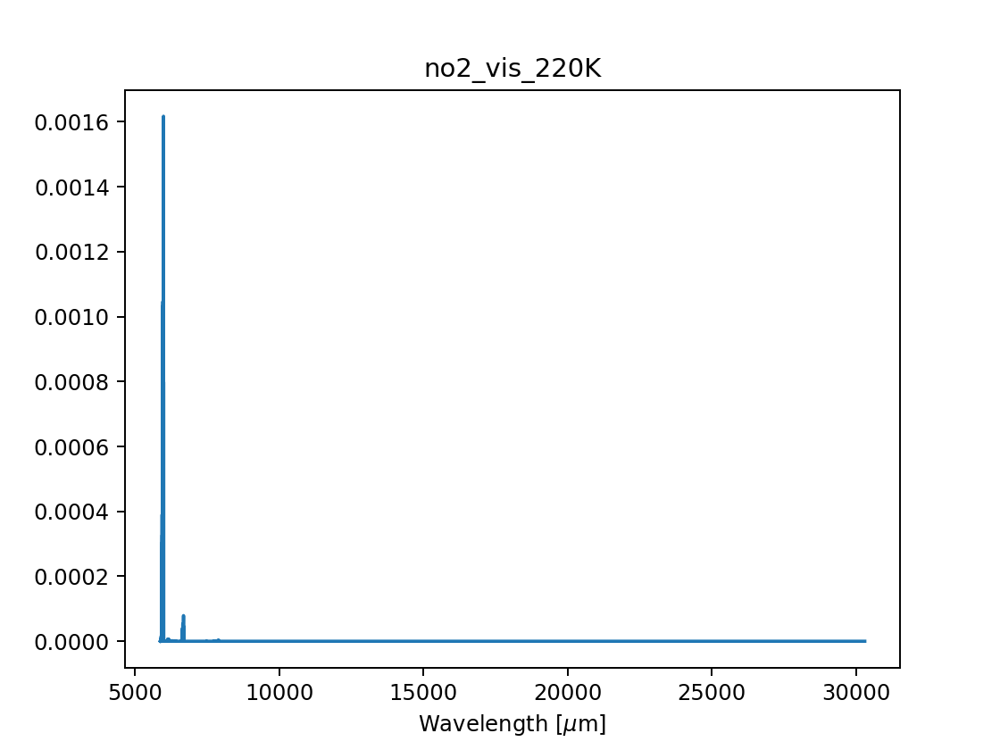

<IPython.core.display.Javascript object>


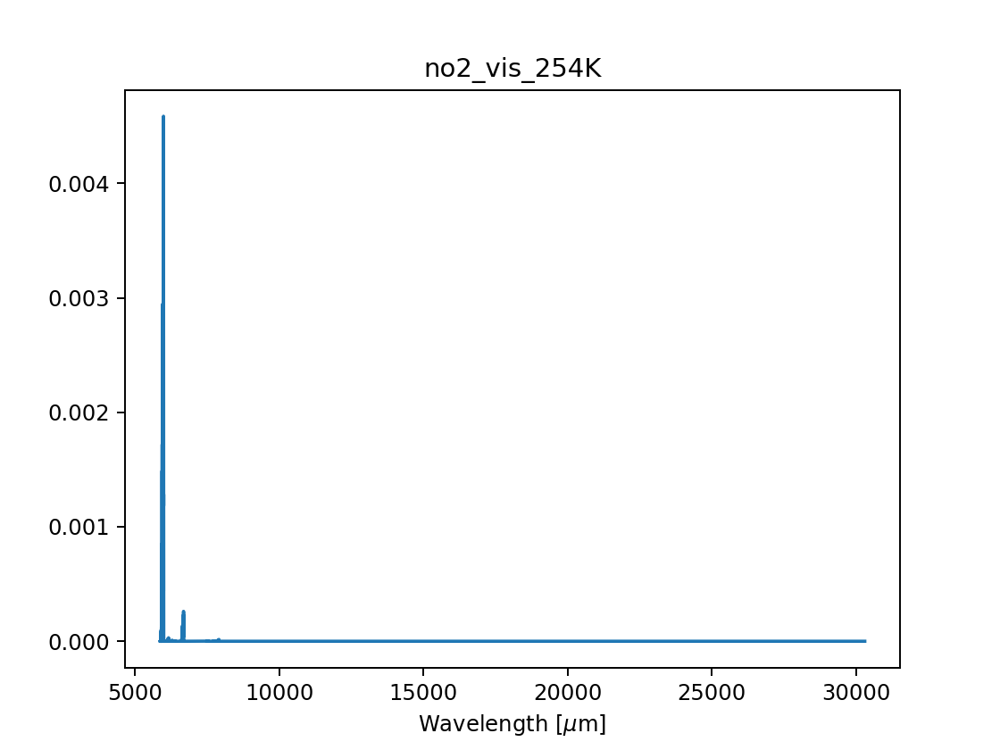

<IPython.core.display.Javascript object>


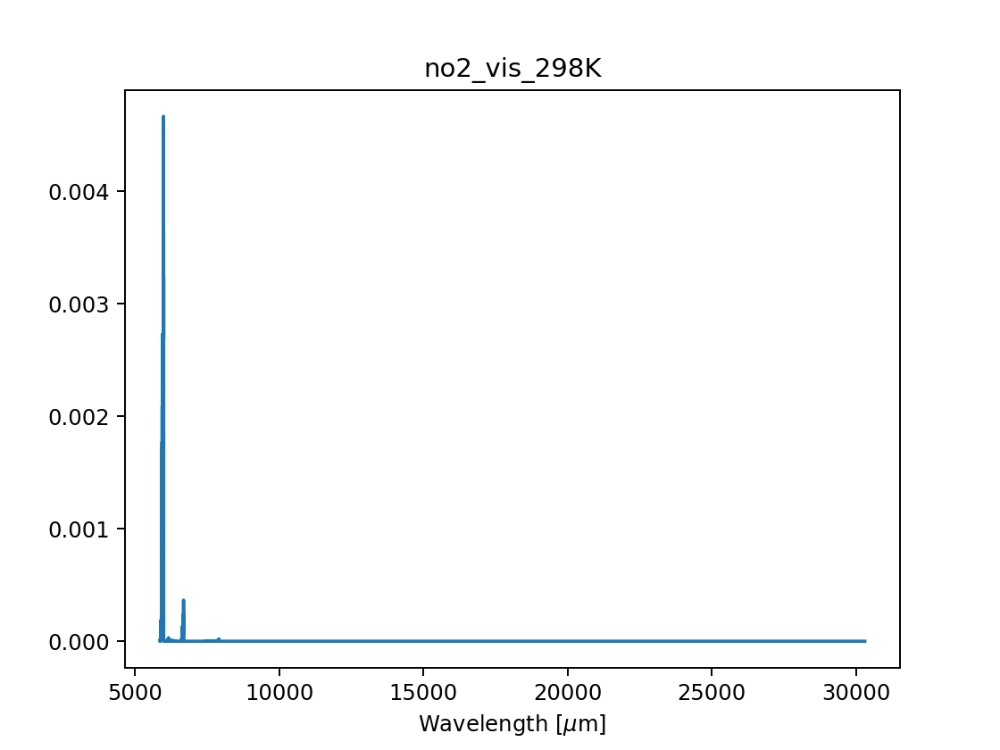

<IPython.core.display.Javascript object>


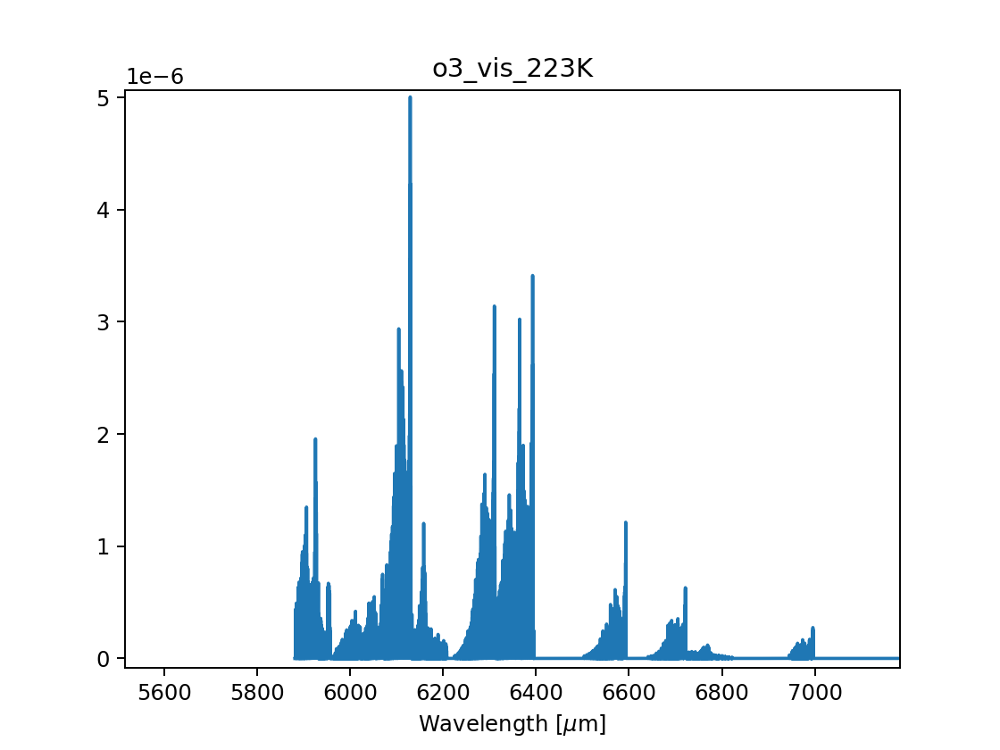

<IPython.core.display.Javascript object>


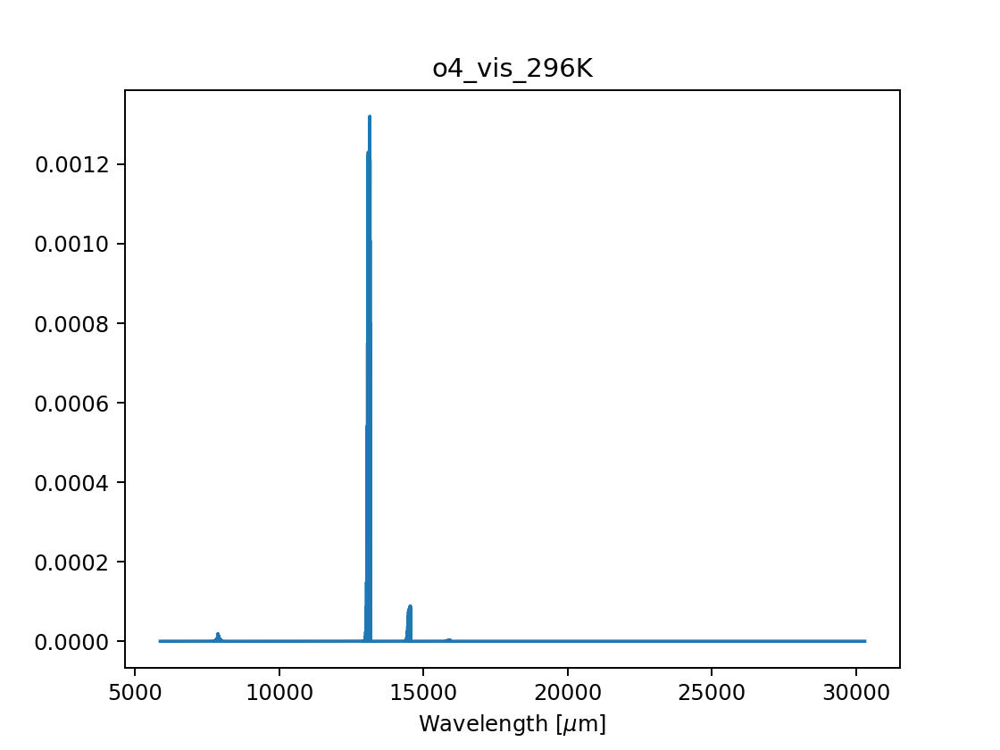

<IPython.core.display.Javascript object>


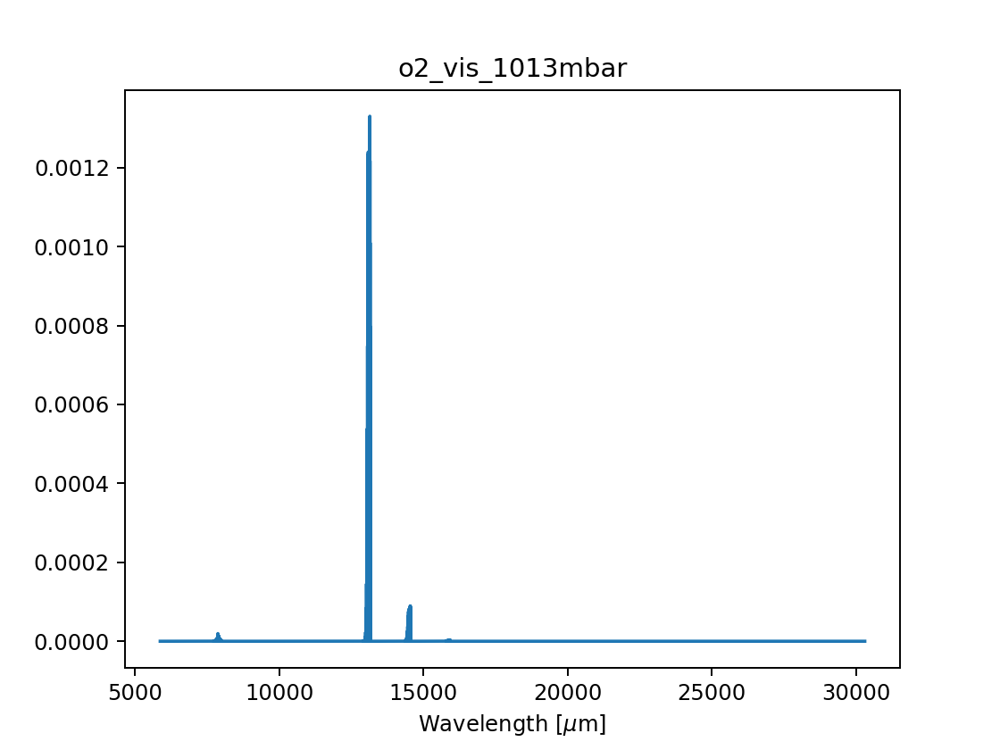

<IPython.core.display.Javascript object>


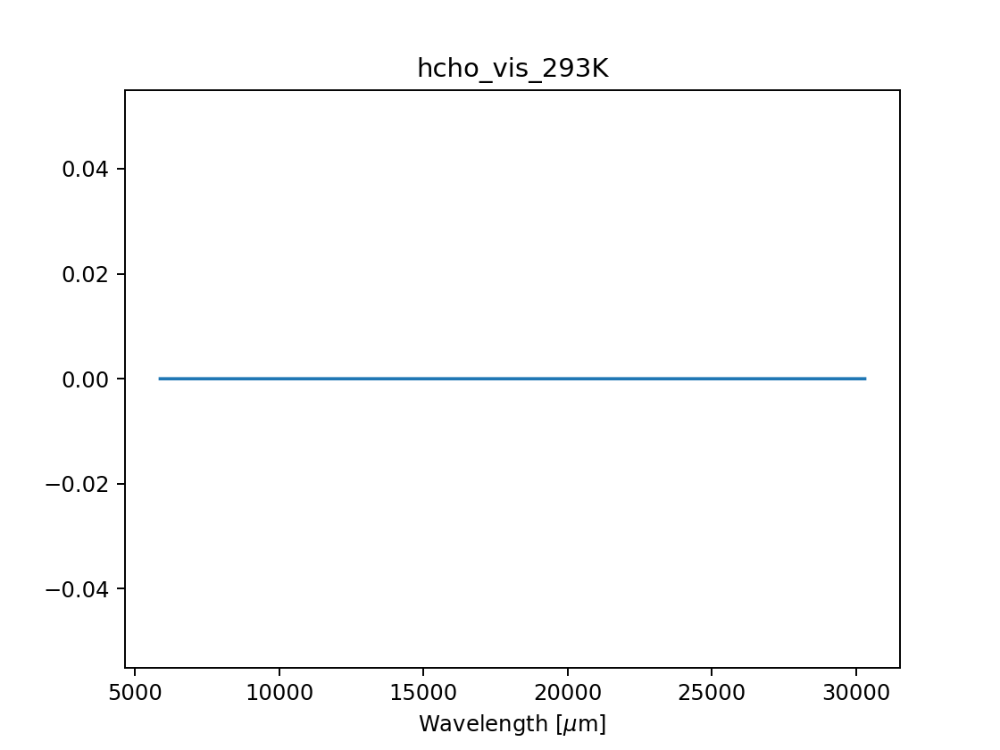

<IPython.core.display.Javascript object>


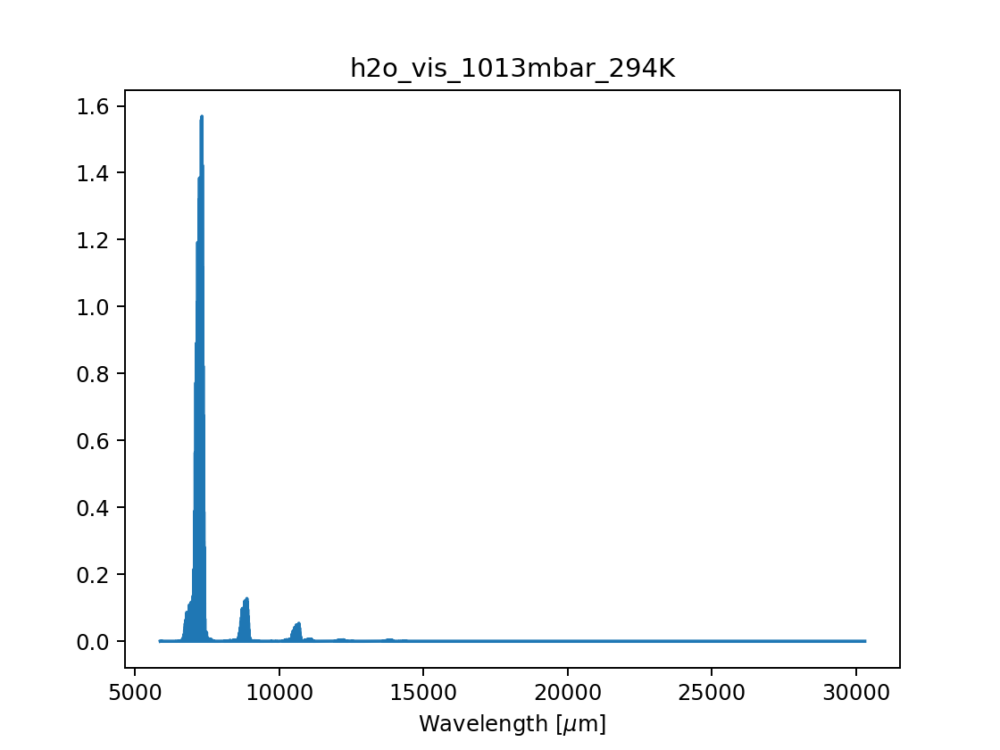

<IPython.core.display.Javascript object>


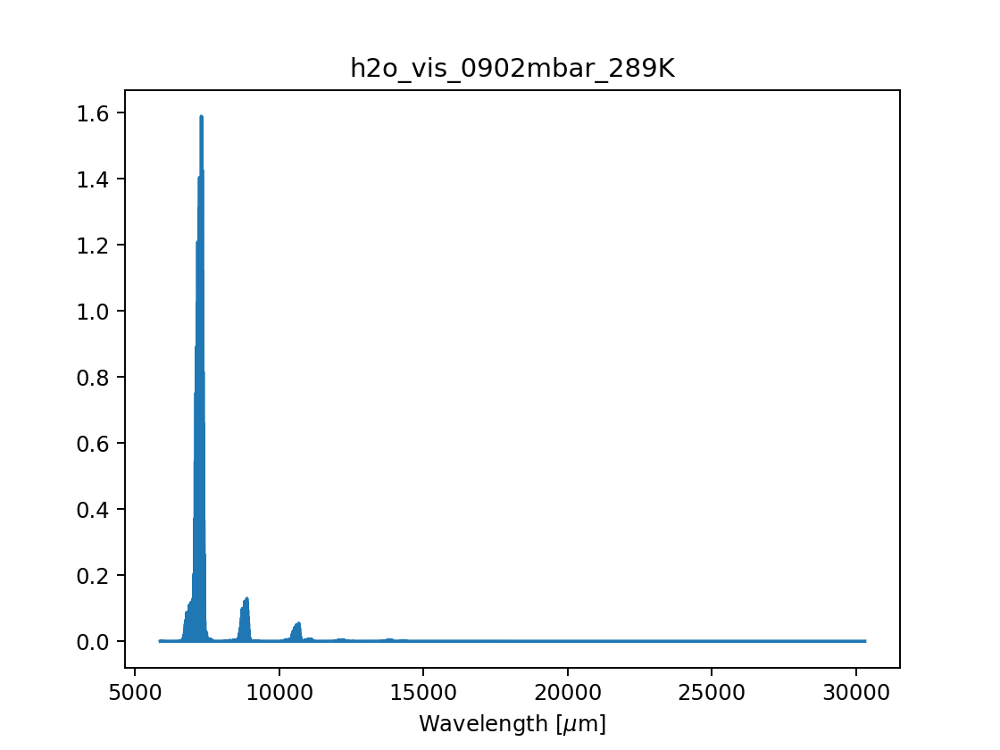

<IPython.core.display.Javascript object>


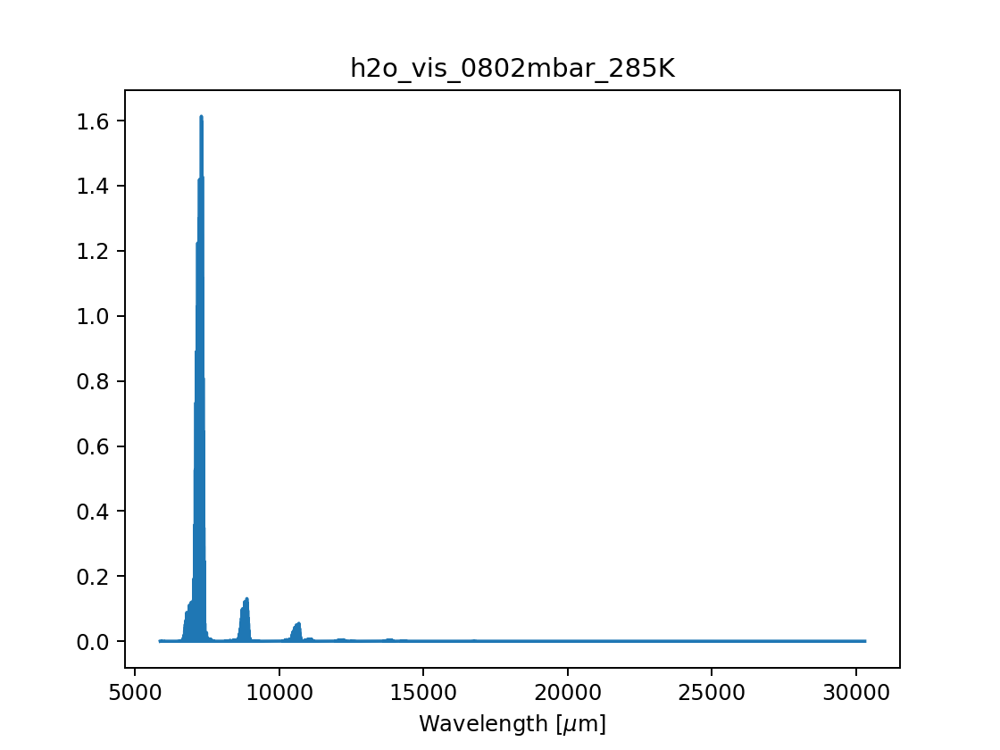

<IPython.core.display.Javascript object>


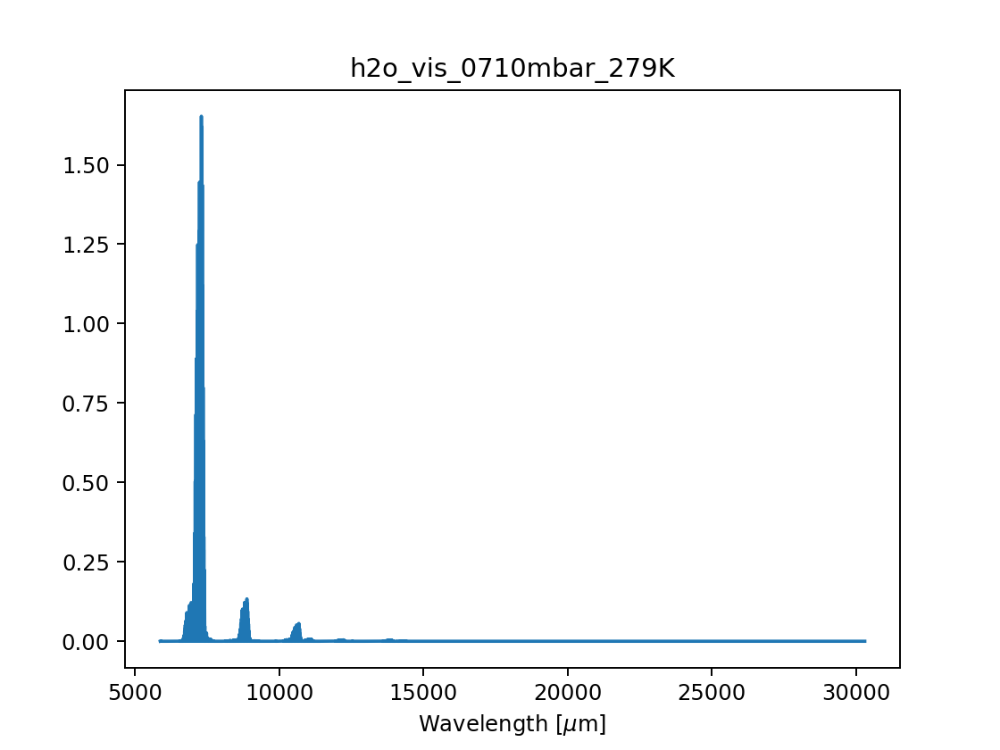

<IPython.core.display.Javascript object>


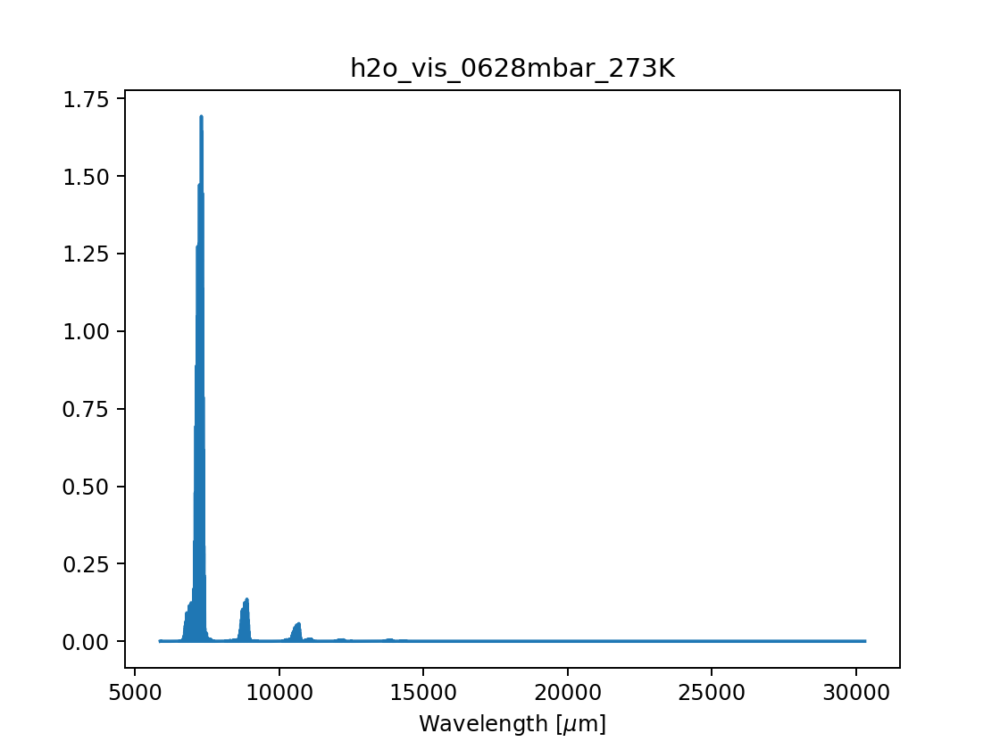

<IPython.core.display.Javascript object>


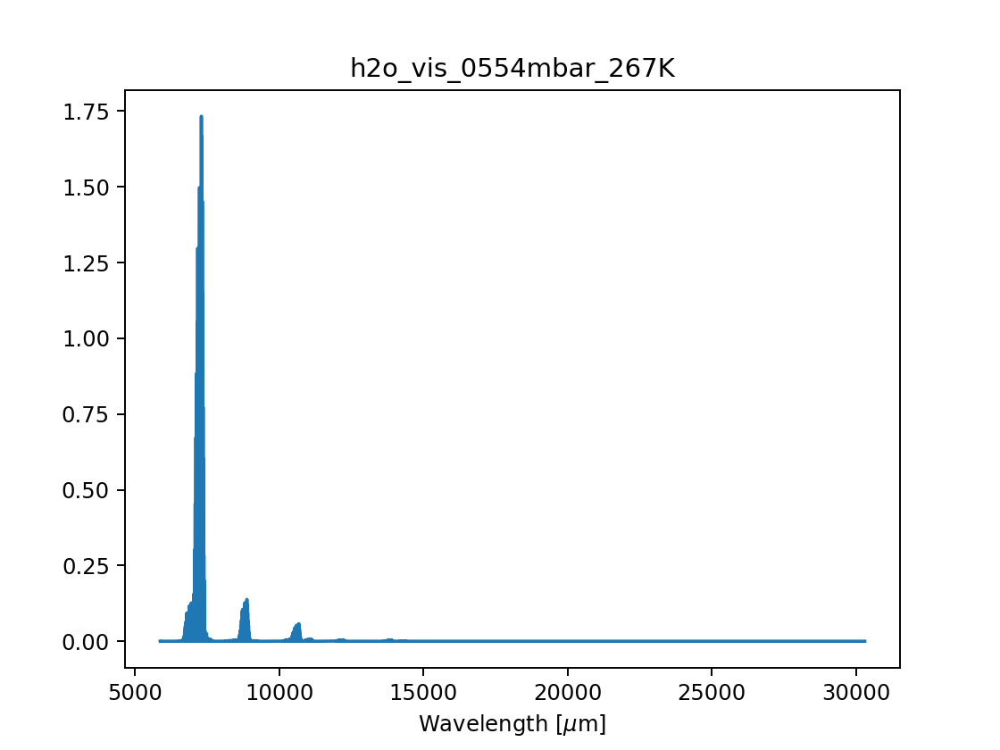

<IPython.core.display.Javascript object>


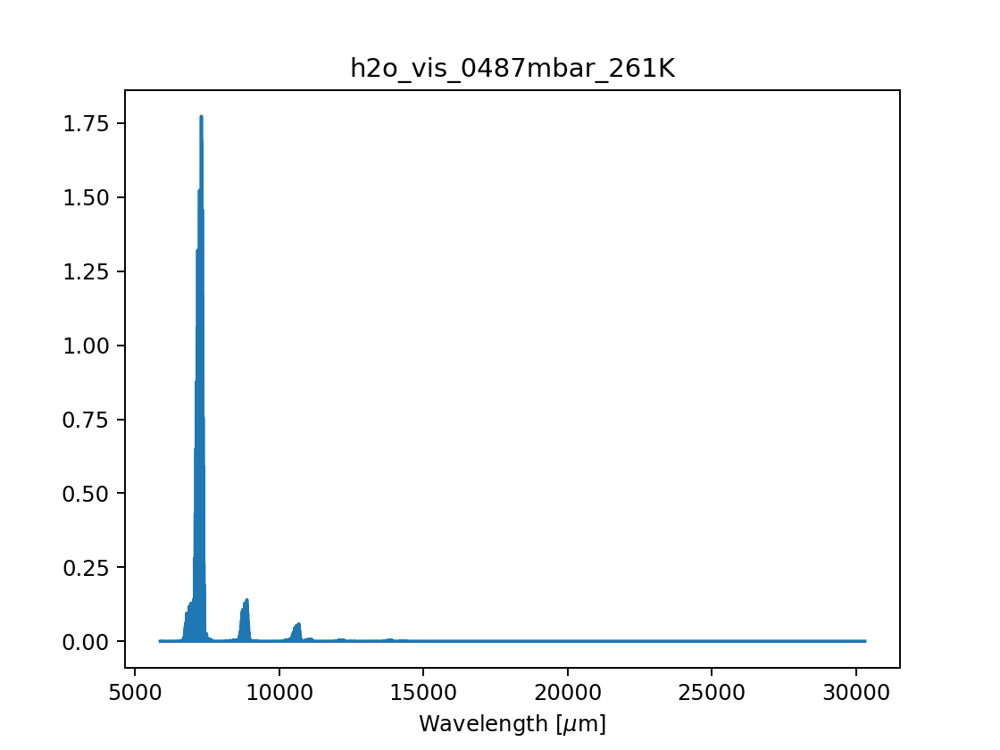

<IPython.core.display.Javascript object>


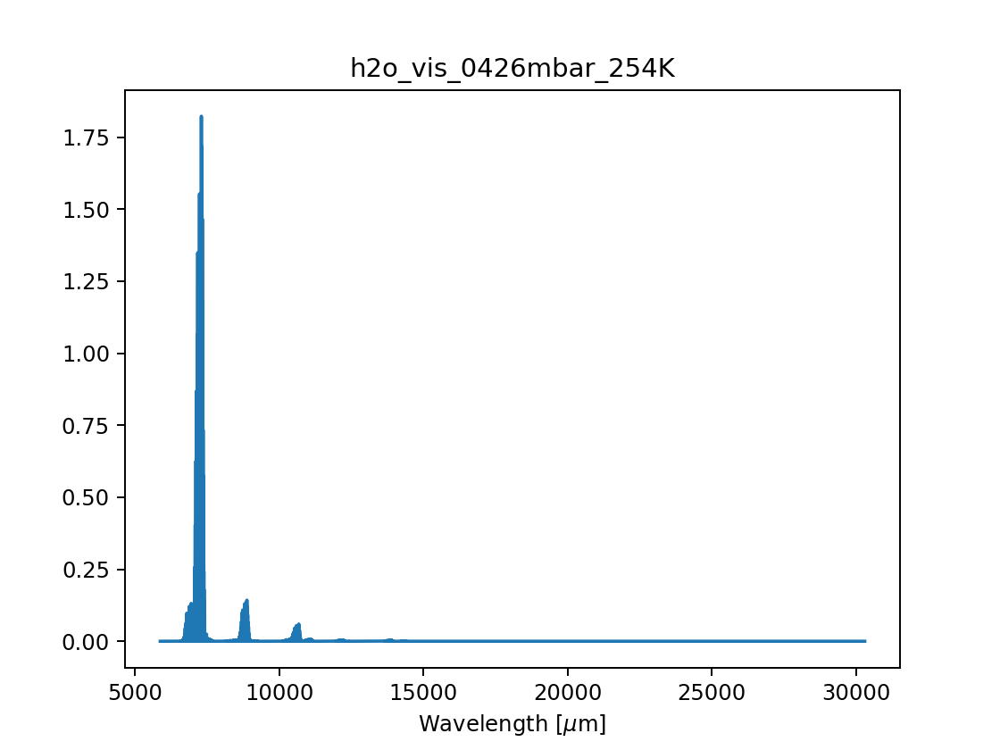

<IPython.core.display.Javascript object>


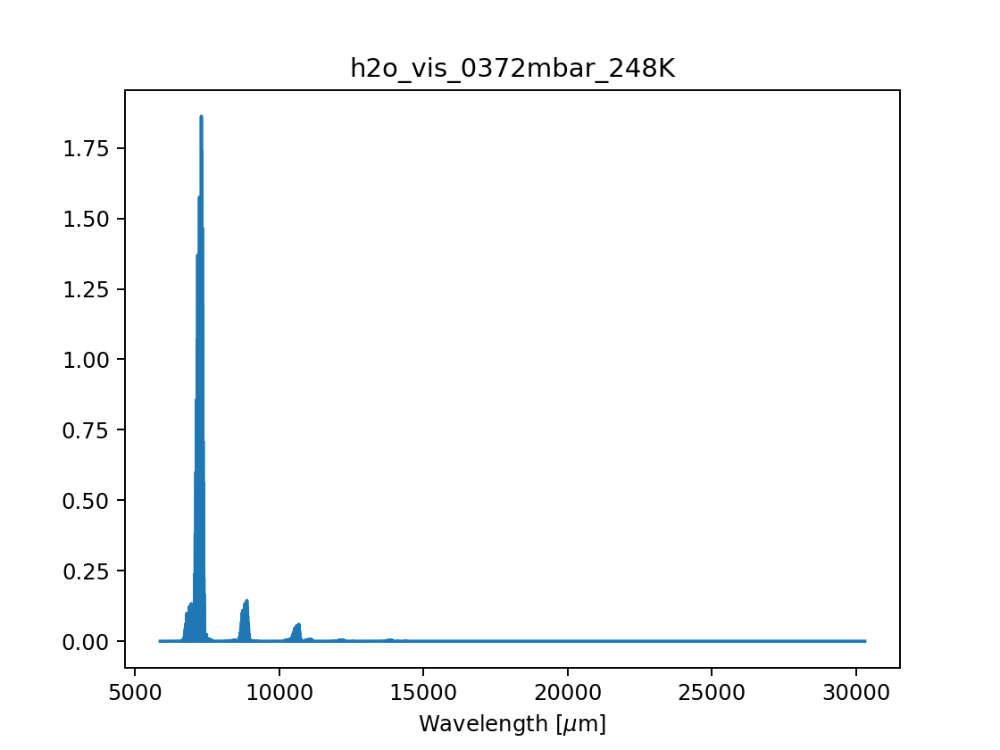

<IPython.core.display.Javascript object>


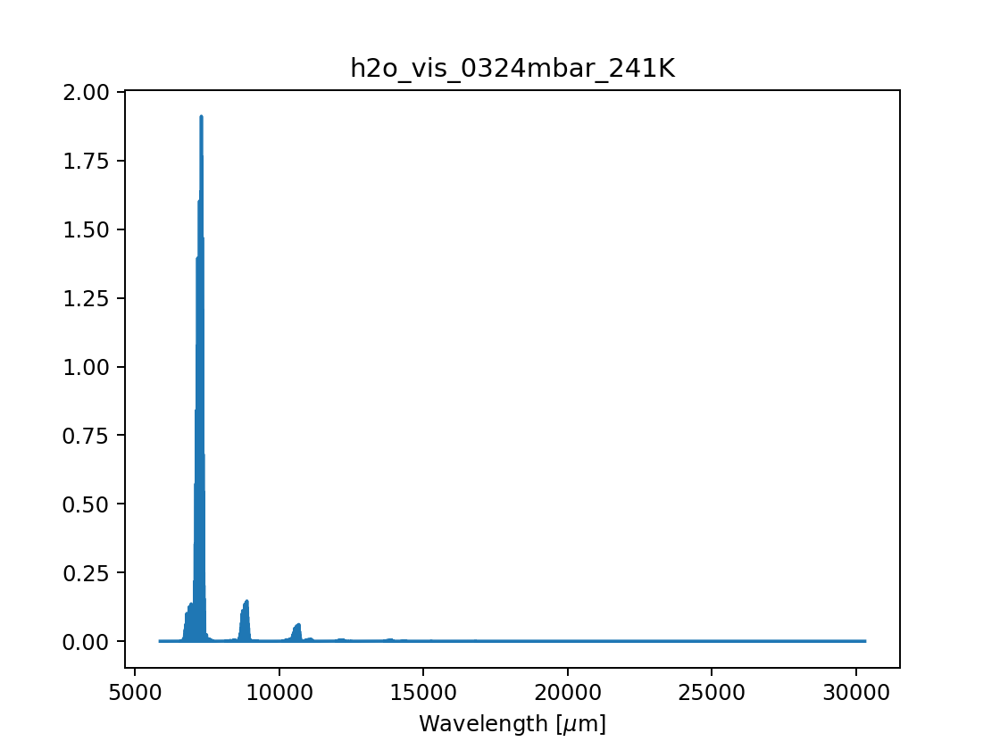

<IPython.core.display.Javascript object>


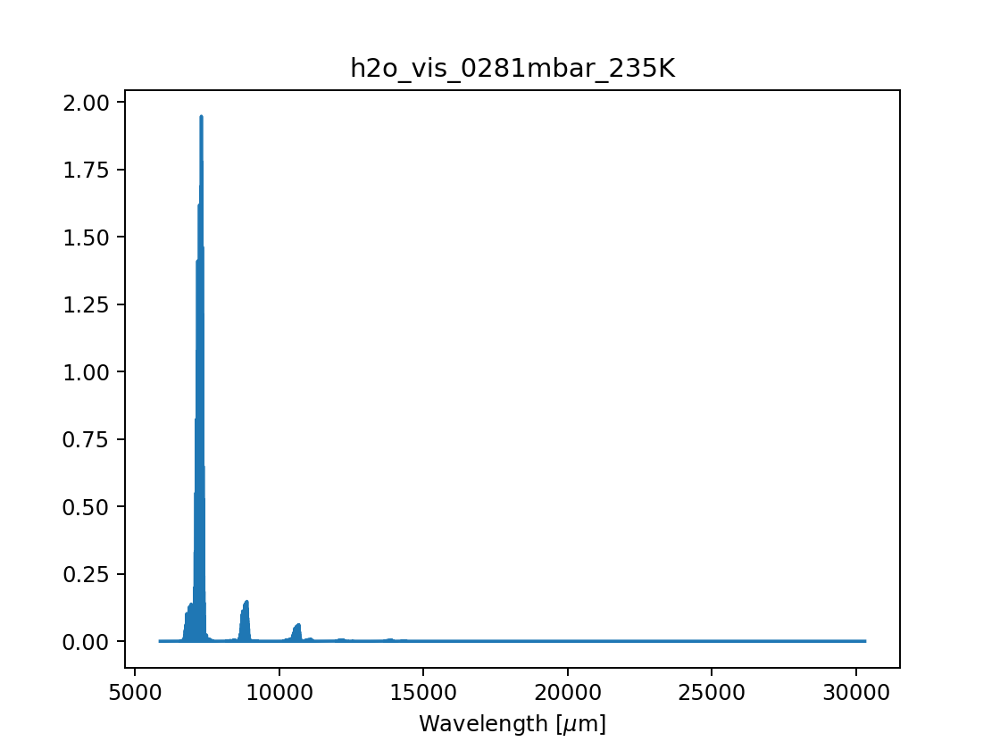

<IPython.core.display.Javascript object>


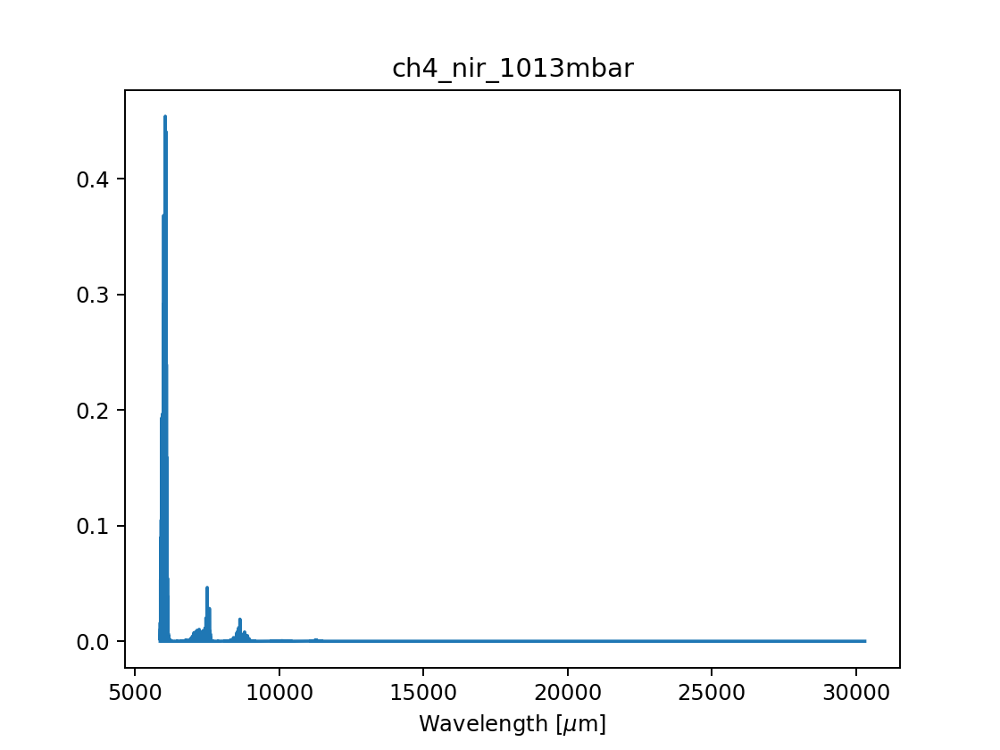

<IPython.core.display.Javascript object>


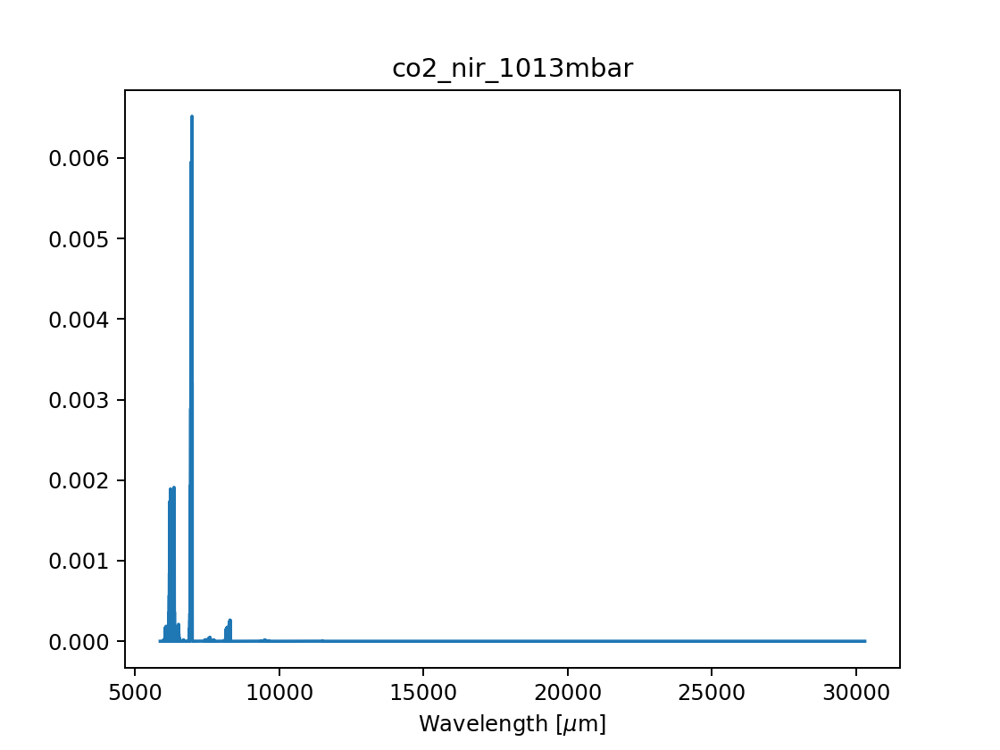

<IPython.core.display.Javascript object>


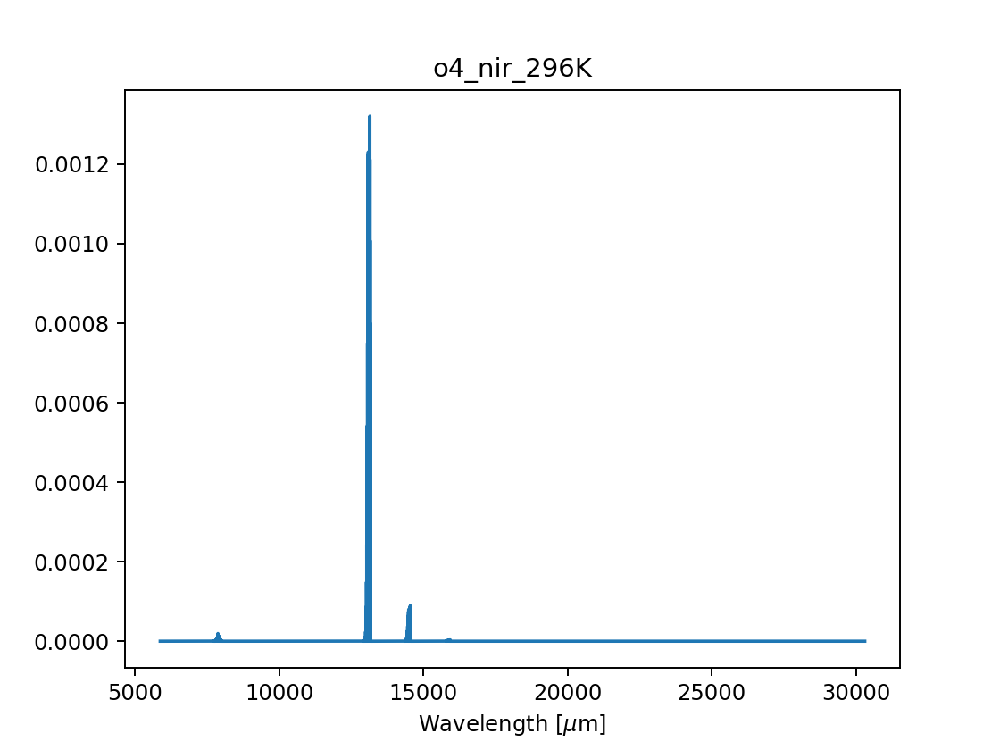

In [285]:
for k in list(gases.keys()):
    plt.figure()
    plt.plot(gases[k]['nu'],gases[k]['coef'])
    plt.title(k)
    plt.xlabel('Wavelength [$\mu$m]')

<IPython.core.display.Javascript object>


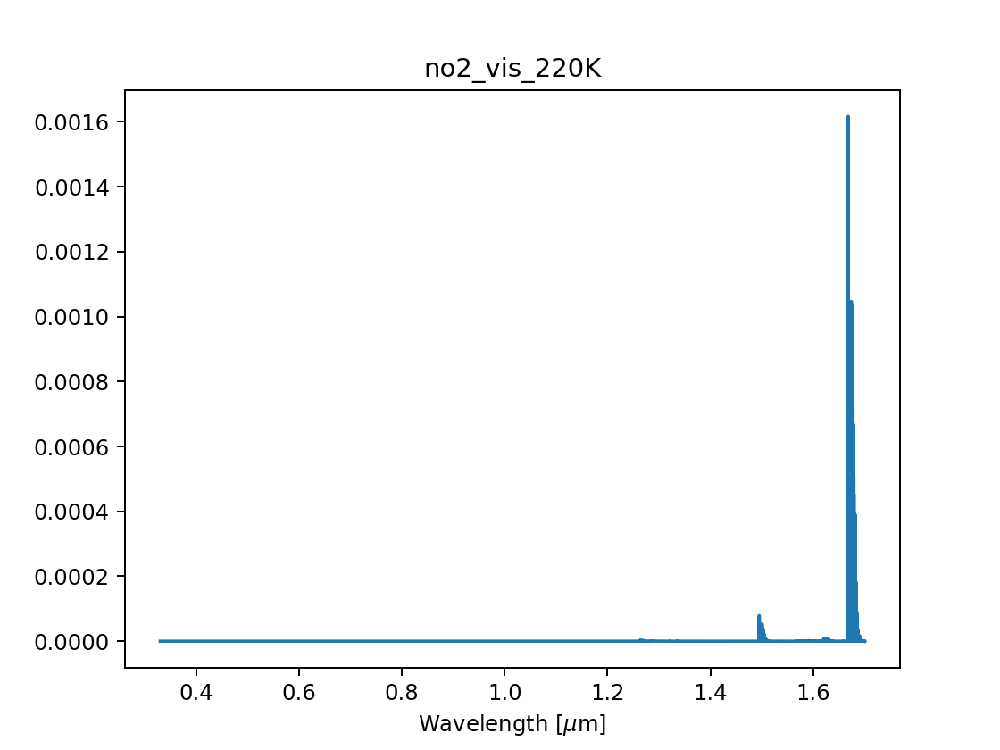

<IPython.core.display.Javascript object>


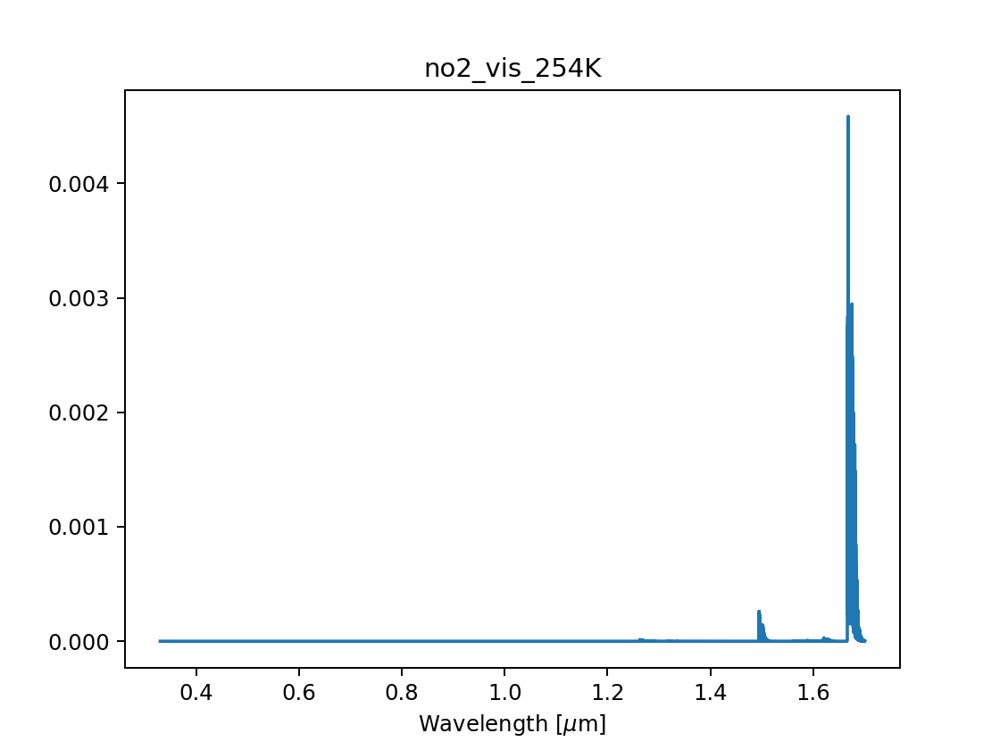

<IPython.core.display.Javascript object>


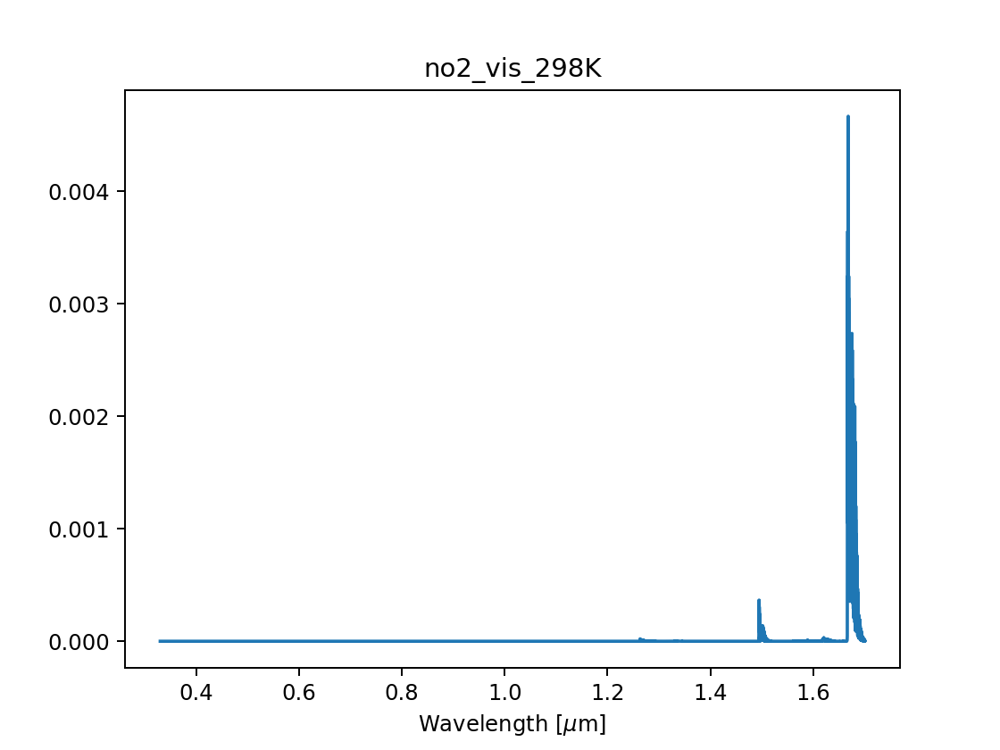

<IPython.core.display.Javascript object>


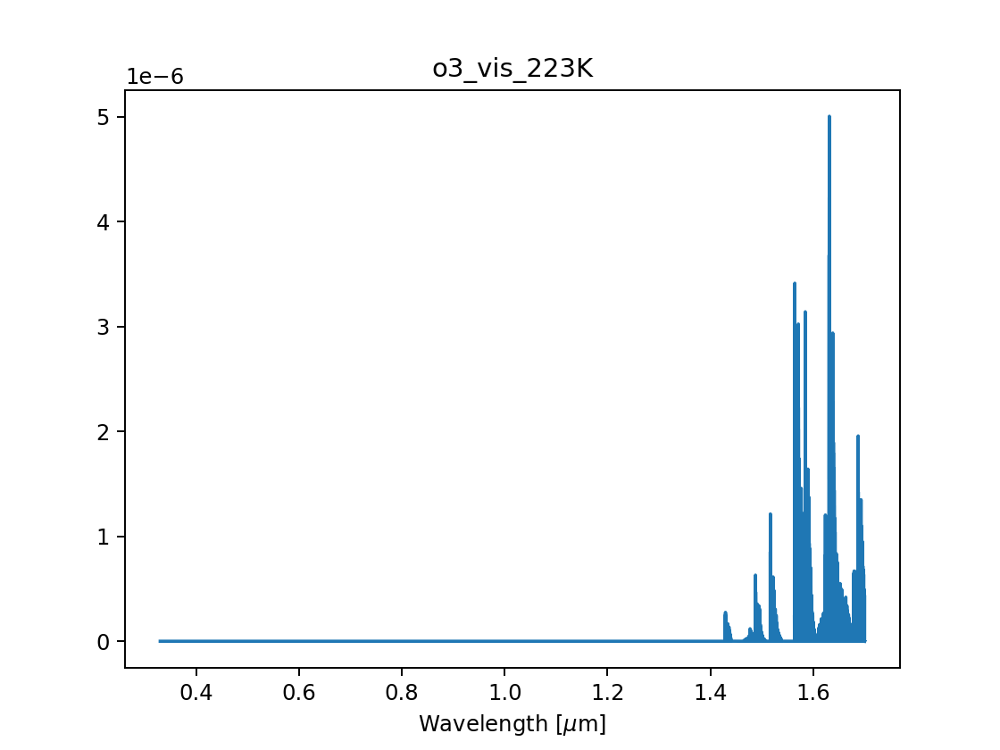

<IPython.core.display.Javascript object>


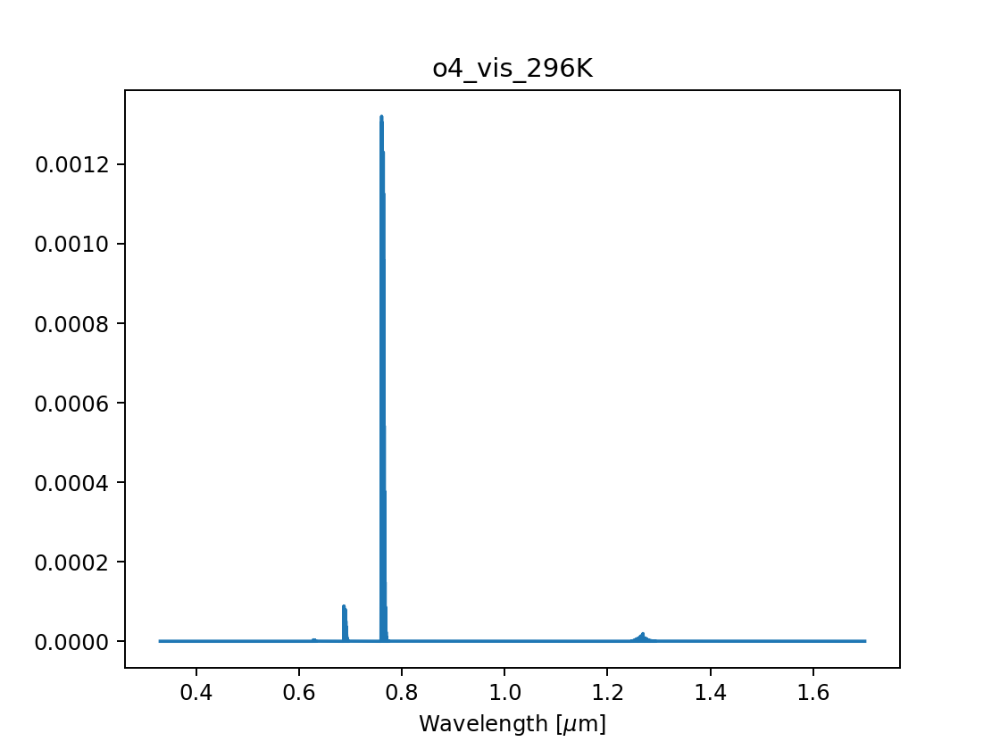

<IPython.core.display.Javascript object>


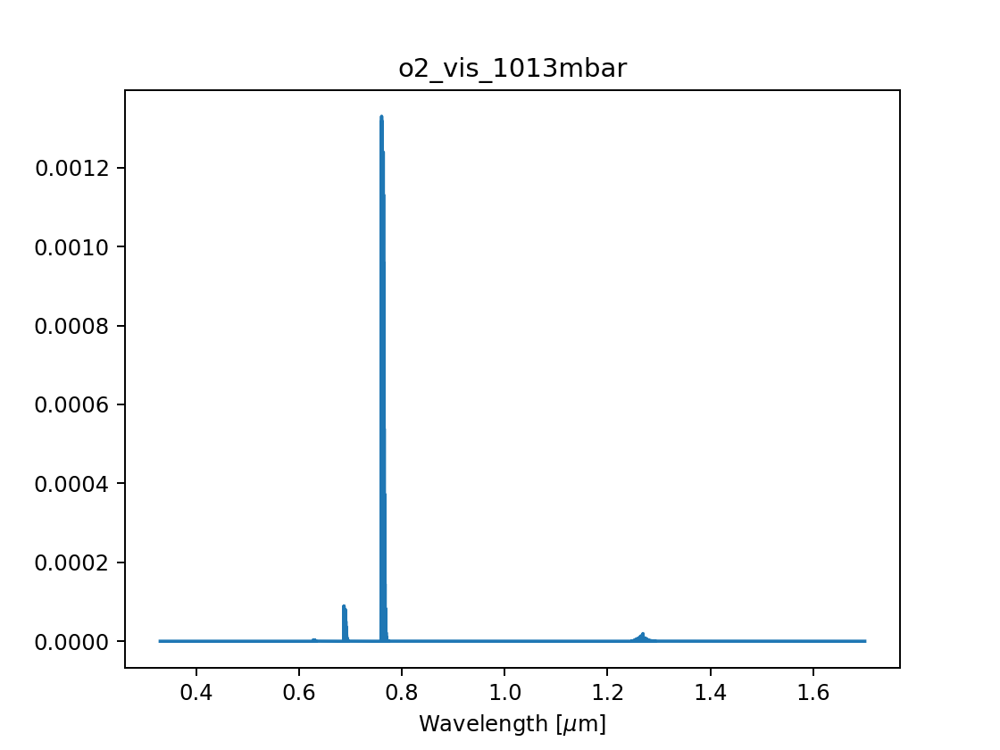

<IPython.core.display.Javascript object>


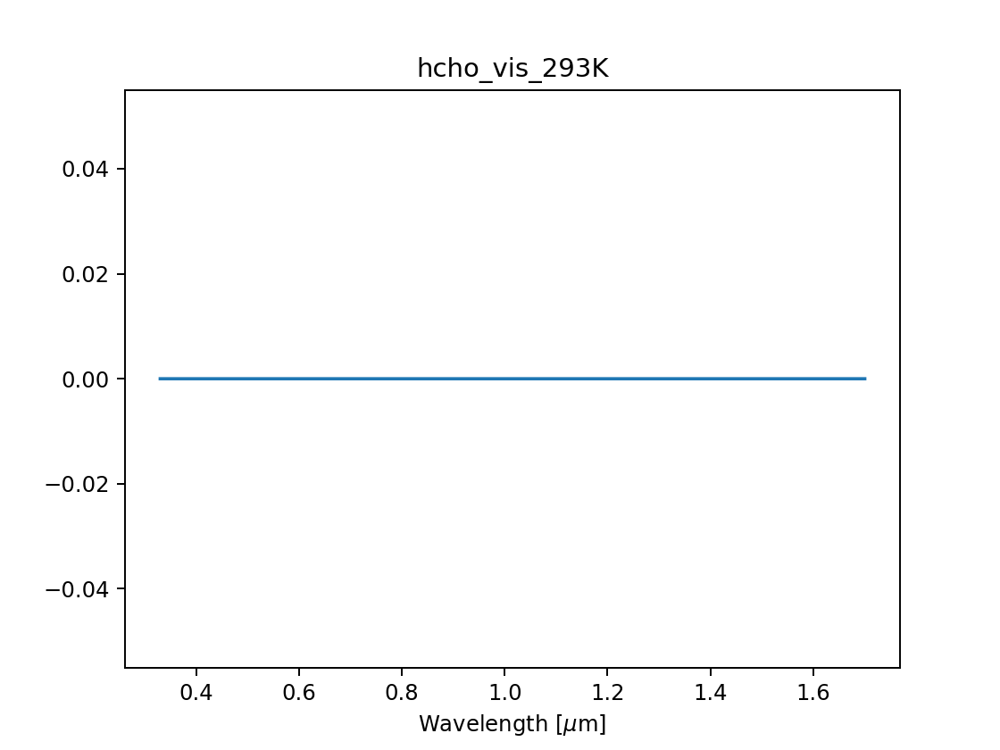

<IPython.core.display.Javascript object>


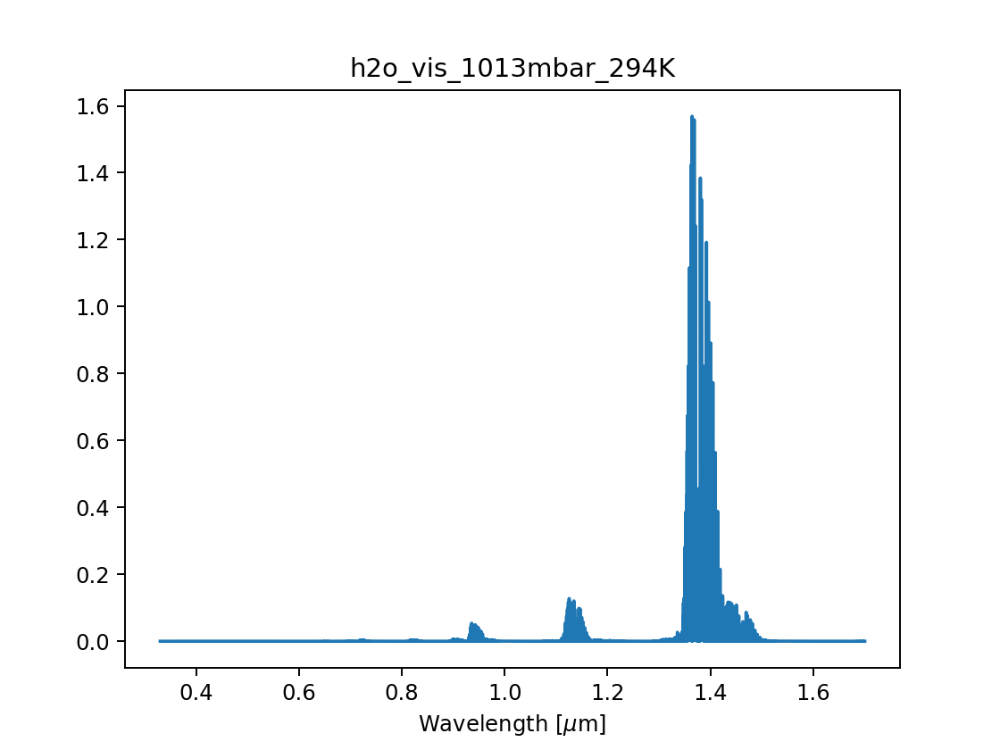

<IPython.core.display.Javascript object>


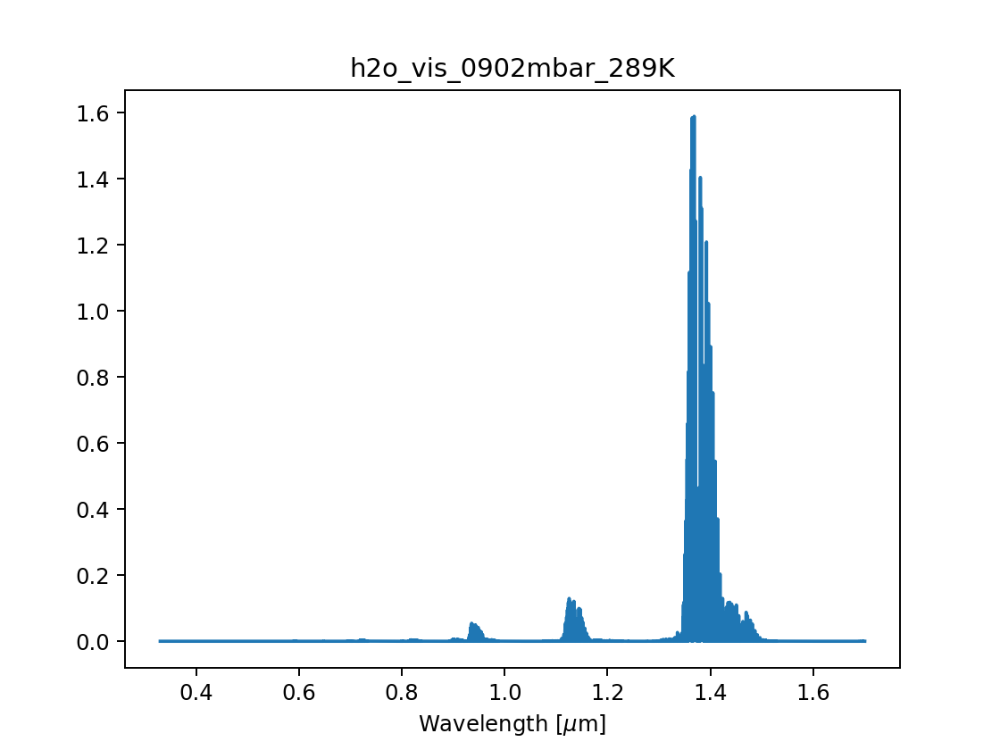

<IPython.core.display.Javascript object>


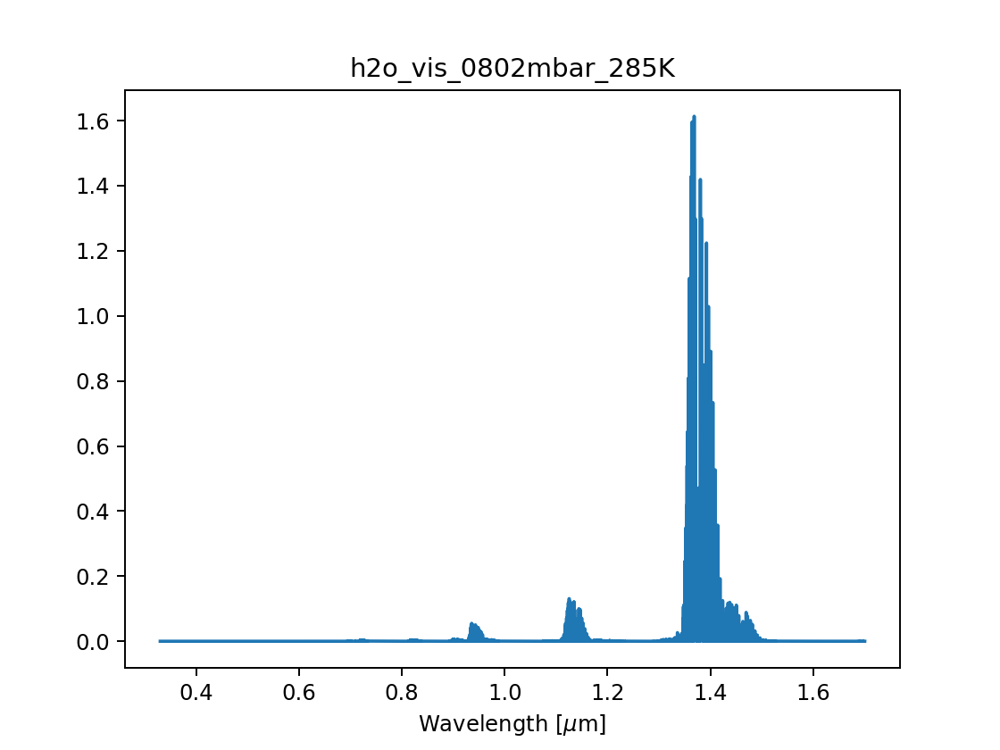

<IPython.core.display.Javascript object>


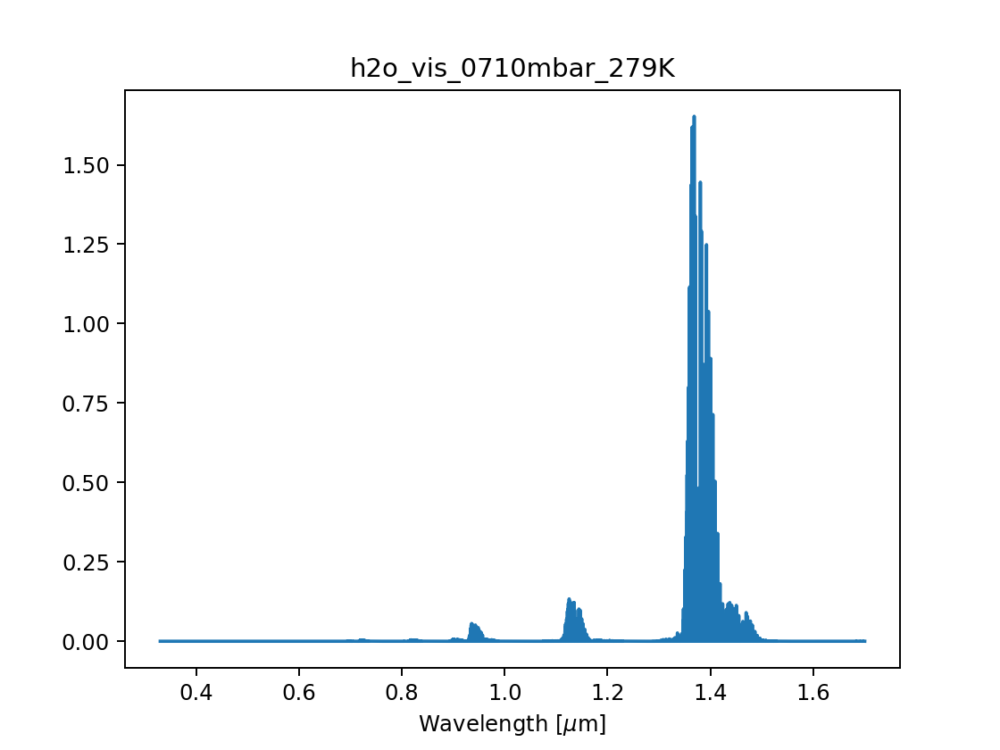

<IPython.core.display.Javascript object>


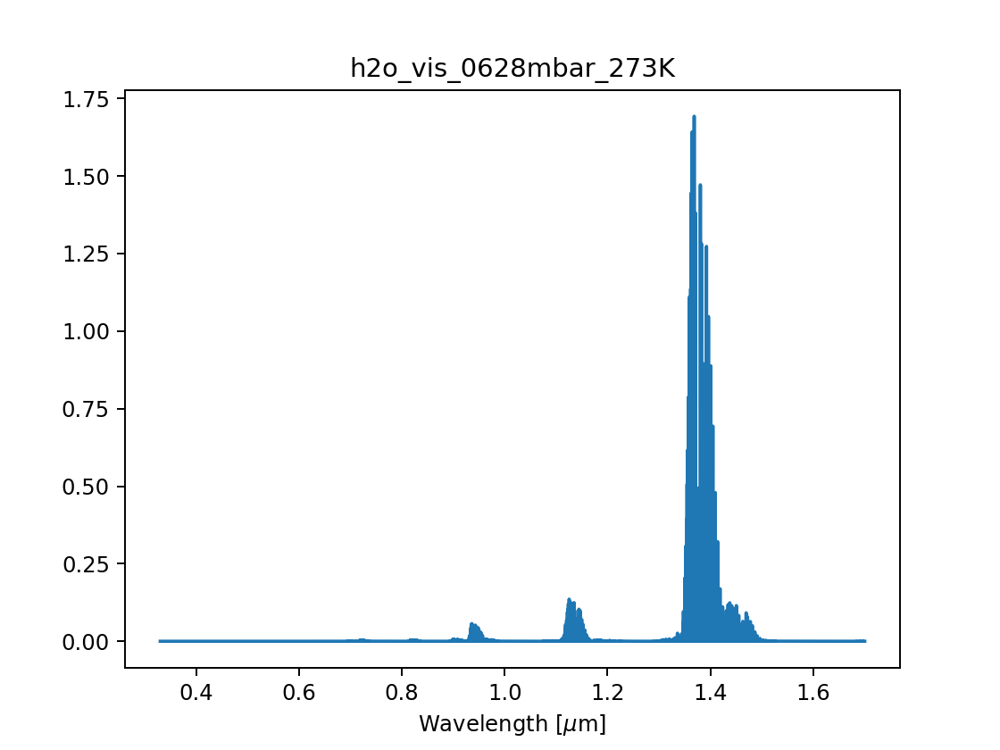

<IPython.core.display.Javascript object>


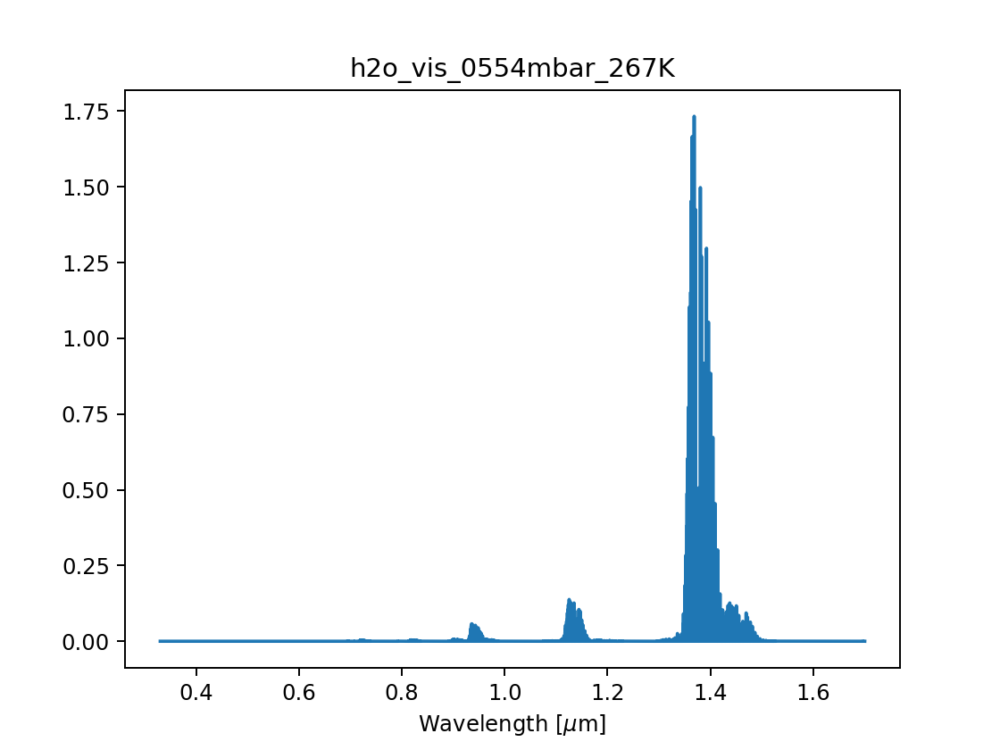

<IPython.core.display.Javascript object>


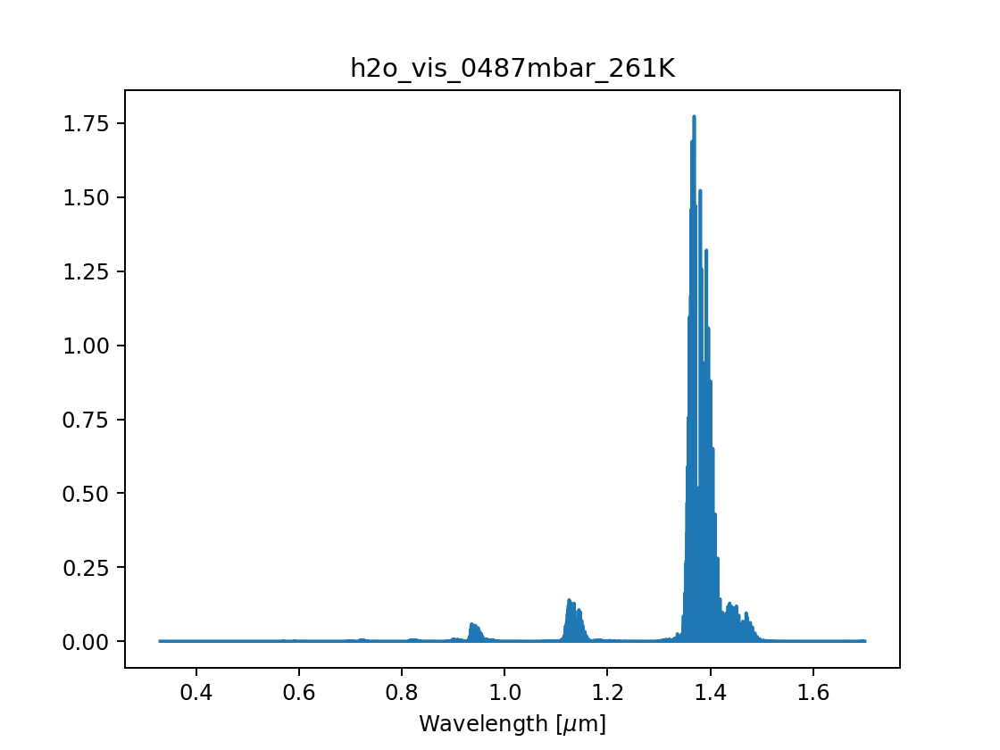

<IPython.core.display.Javascript object>


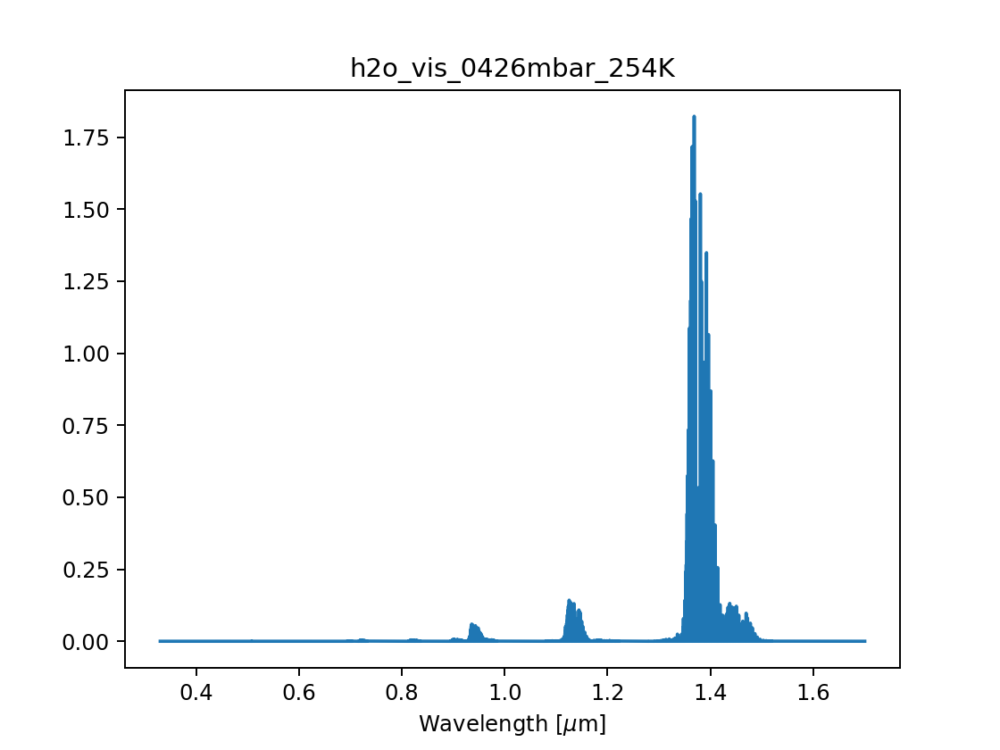

<IPython.core.display.Javascript object>


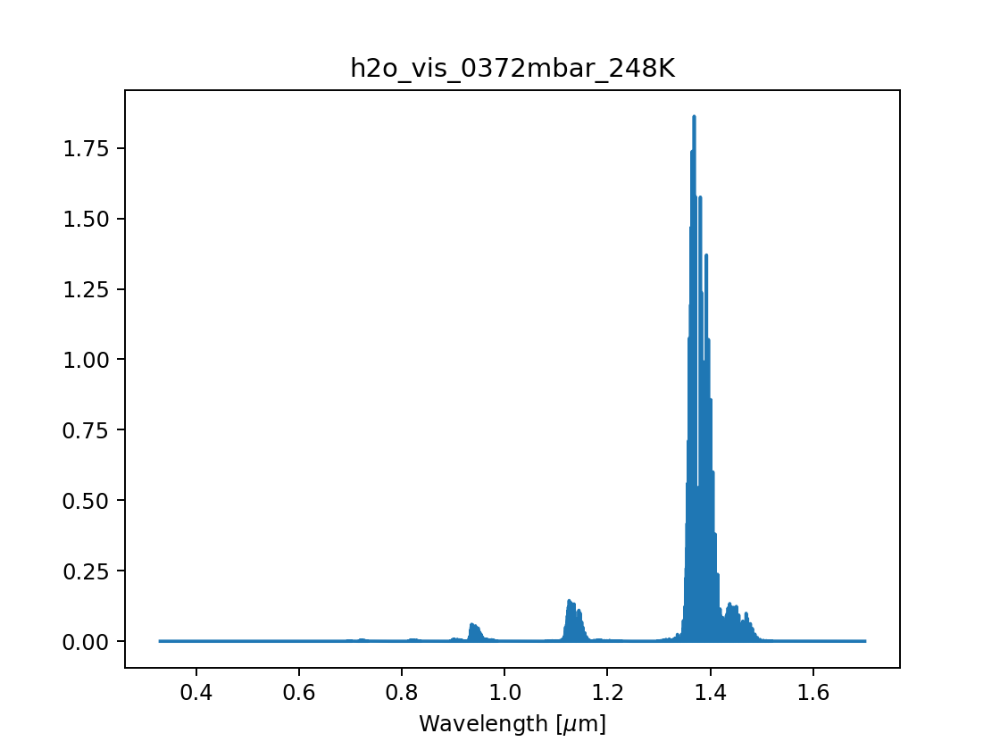

<IPython.core.display.Javascript object>


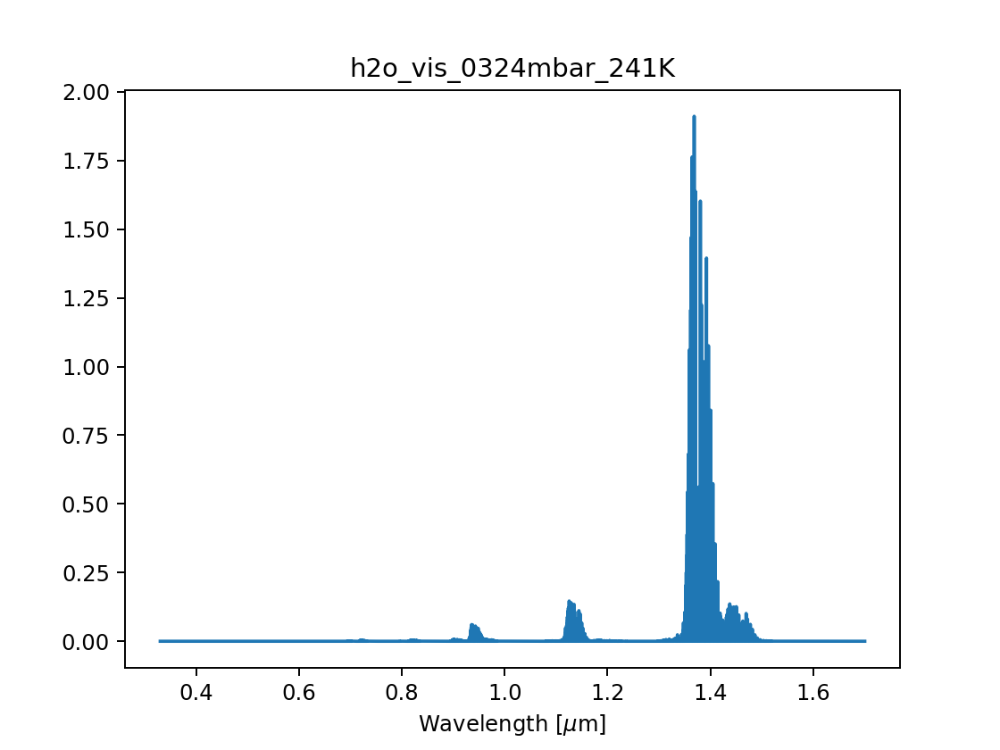

<IPython.core.display.Javascript object>


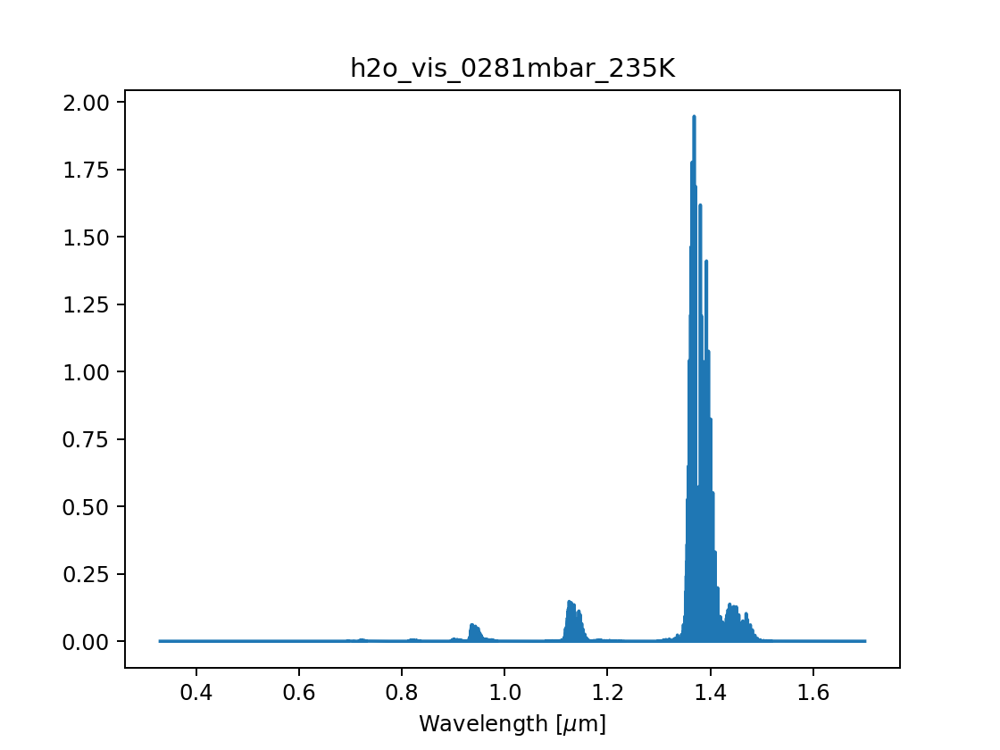

<ipython-input-270-fc530f1bc9c9>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<IPython.core.display.Javascript object>


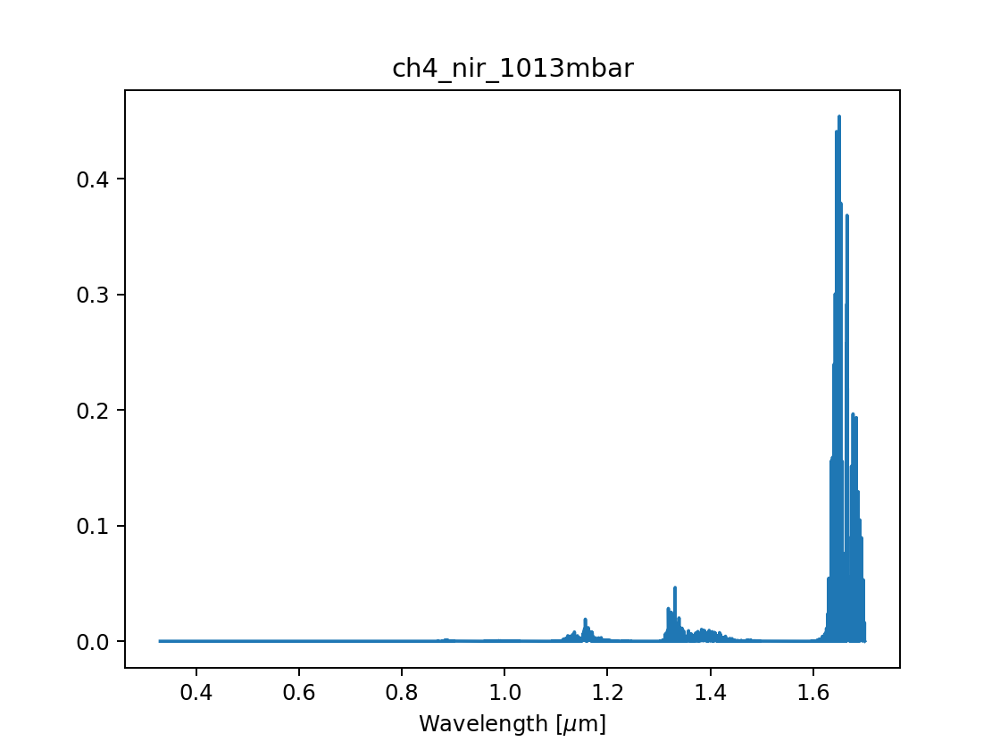

<IPython.core.display.Javascript object>


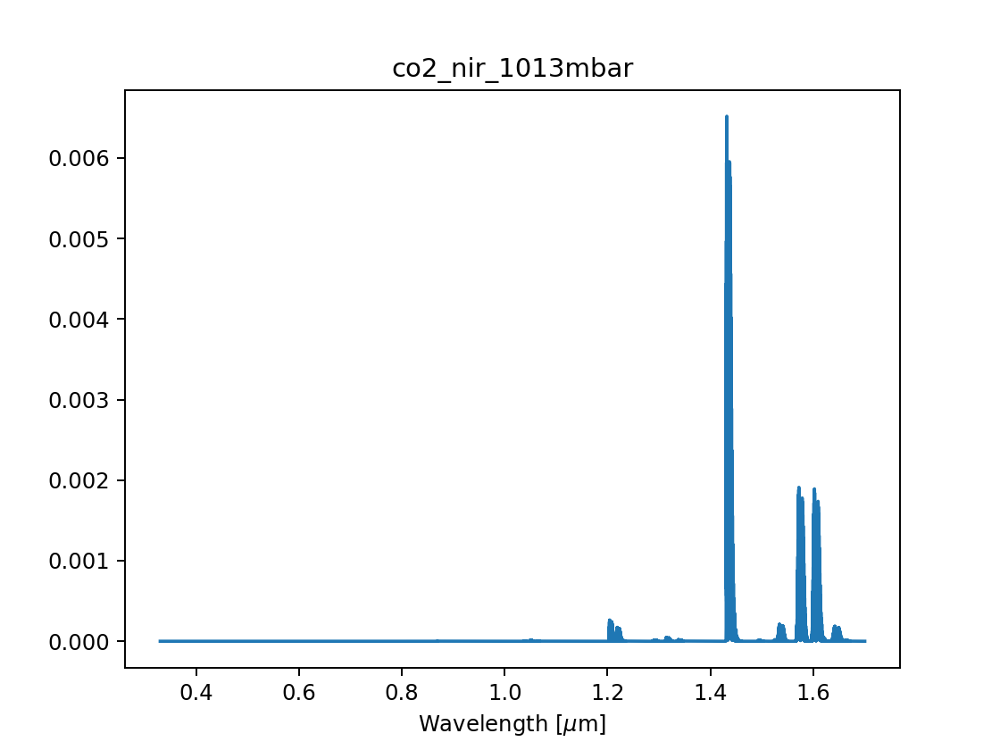

<IPython.core.display.Javascript object>


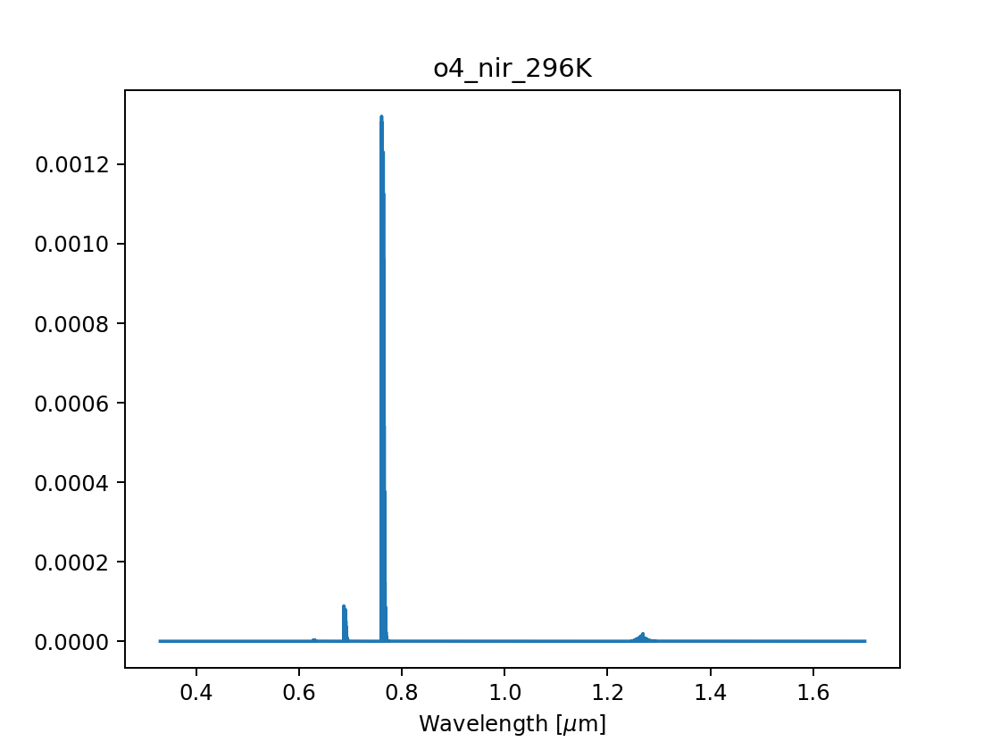

In [270]:
for k in list(gases.keys()):
    plt.figure()
    plt.plot(wvn_2_wvl(gases[k]['nu']),gases[k]['coef'])
    plt.title(k)
    plt.xlabel('Wavelength [$\mu$m]')

## Now convolve to 4STARB spectra

In [271]:
from tqdm.notebook import tqdm

In [273]:
for k in list(gases.keys()):
    gases[k]['xs_vis'] = np.zeros_like(s['vis_nm'][0])*np.nan
    print('On gas: '+k)
    pbar = tqdm(total=len(s['vis_nm'][0]))
    for i,v in enumerate(s['vis_nm'][0]): 
        isub = (wvn_2_wvl(gases[k]['nu'])>=(v-20.0)/1000.0) & (wvn_2_wvl(gases[k]['nu'])<=(v+20.0)/1000.0)
        if not any(isub): continue
        nu_,xsec_,i1,i2,slit = hapi.convolveSpectrum(np.flip(gases[k]['nu'][isub]),np.flip(gases[k]['coef'][isub]),
                                                   Resolution=(wvl_2_wvn((v-s['fwhm_vis'][0,i]/2.0)/1000.0)-wvl_2_wvn((v+s['fwhm_vis'][0,i]/2.0)/1000.0)),
                                                   AF_wing=wvl_2_wvn((v+7.5)/1000.0)-wvl_2_wvn((v-7.5)/1000.0),
                                                   SlitFunction=hapi.SLIT_GAUSSIAN)
        if any(nu_):
            iu = np.argmin(abs(wvn_2_wvl(nu_)-v/1000.0))
            gases[k]['xs_vis'][i] = xsec_[iu]
        pbar.update(1)

On gas: no2_vis_220K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: no2_vis_254K


  0%|          | 0/1044 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



On gas: o3_vis_223K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: o4_vis_296K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: o2_vis_1013mbar


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: hcho_vis_293K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: h2o_vis_1013mbar_294K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: h2o_vis_0802mbar_285K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: h2o_vis_0710mbar_279K


  0%|          | 0/1044 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



On gas: h2o_vis_0628mbar_273K


  0%|          | 0/1044 [00:00<?, ?it/s]

Exception in thread Thread-5:
Traceback (most recent call last):
  File "/usr/lib/python3.8/threading.py", line 932, in _bootstrap_inner
    self.run()
  File "/home/sam/.local/lib/python3.8/site-packages/tqdm/_monitor.py", line 69, in run
    instances = self.get_instances()
  File "/home/sam/.local/lib/python3.8/site-packages/tqdm/_monitor.py", line 49, in get_instances
    return [i for i in self.tqdm_cls._instances.copy()
  File "/usr/lib/python3.8/_weakrefset.py", line 92, in copy
    return self.__class__(self)
  File "/usr/lib/python3.8/_weakrefset.py", line 50, in __init__
    self.update(data)
  File "/usr/lib/python3.8/_weakrefset.py", line 119, in update
    for element in other:
  File "/usr/lib/python3.8/_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration


On gas: h2o_vis_0554mbar_267K


  0%|          | 0/1044 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



On gas: h2o_vis_0426mbar_254K


  0%|          | 0/1044 [00:00<?, ?it/s]

On gas: h2o_vis_0372mbar_248K


  0%|          | 0/1044 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



On gas: co2_nir_1013mbar


  0%|          | 0/1044 [00:00<?, ?it/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
sio.savemat(fph+'hitran_atm_trace_gases_20220513.mat',gases)

In [275]:
gases['co2_nir_1013mbar']['xs_vis'].shape

(1044,)

<IPython.core.display.Javascript object>


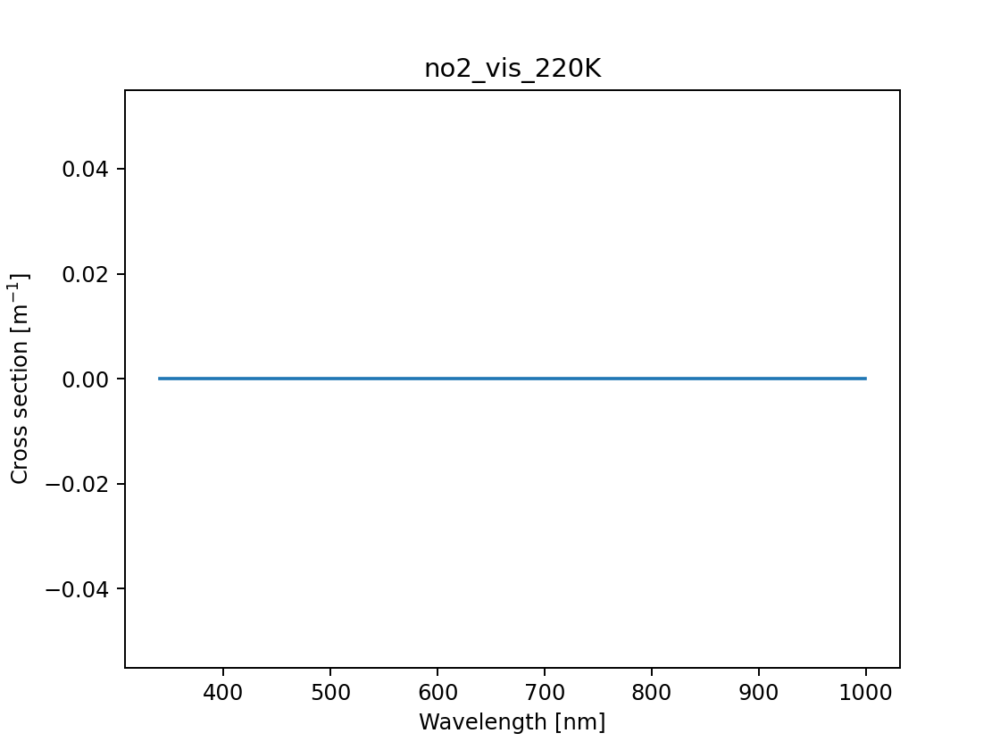

<IPython.core.display.Javascript object>


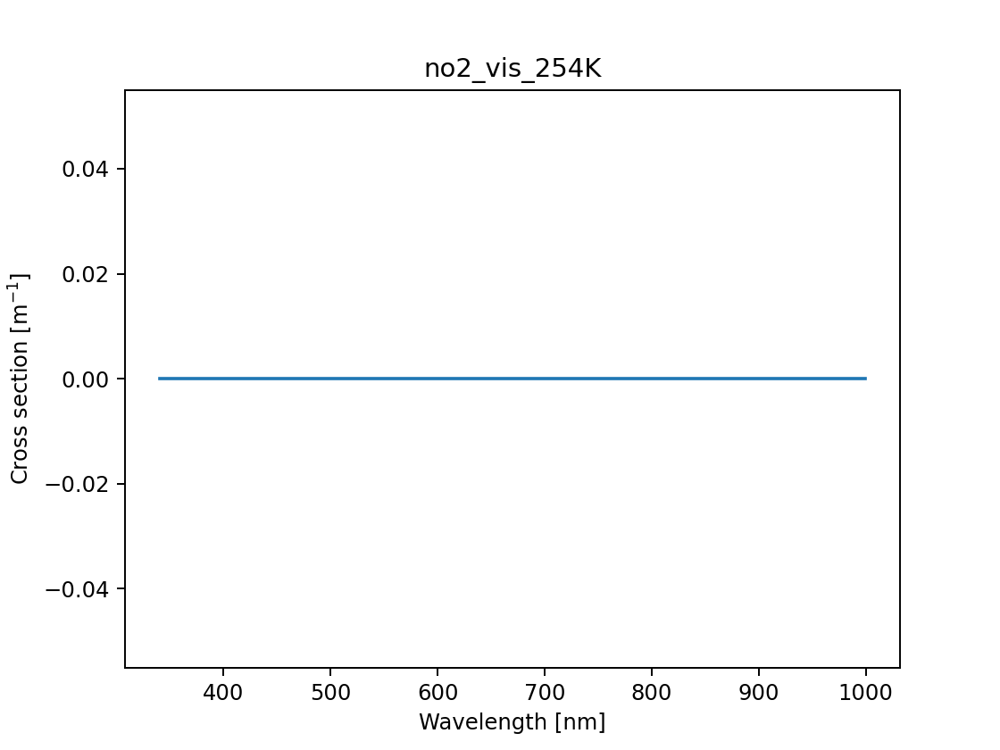

<IPython.core.display.Javascript object>


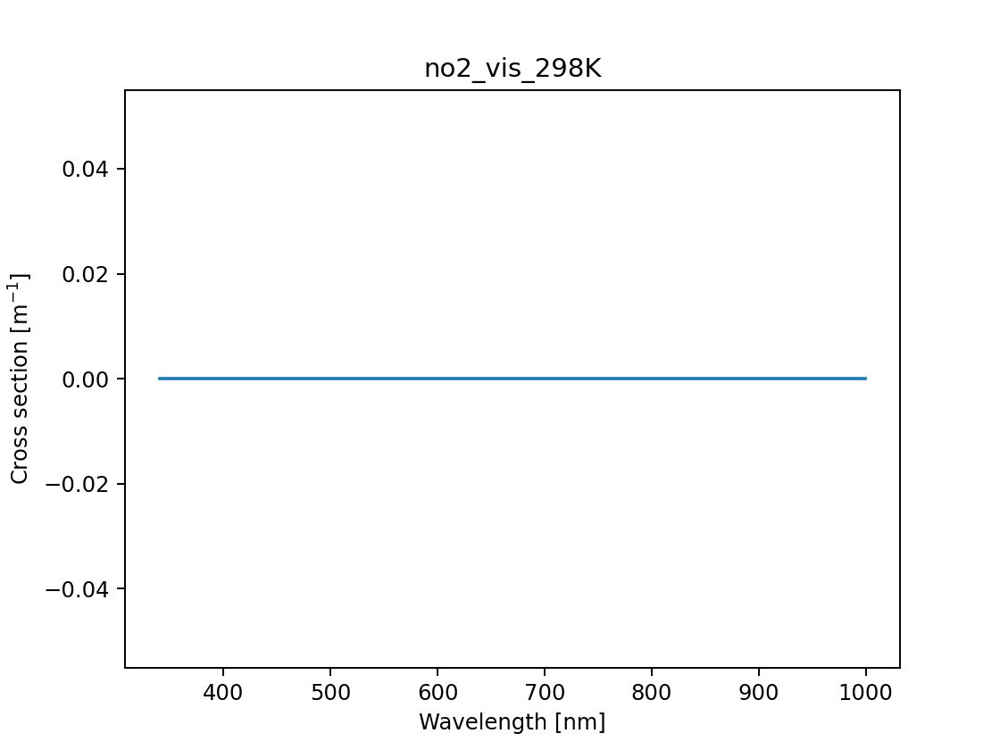

<IPython.core.display.Javascript object>


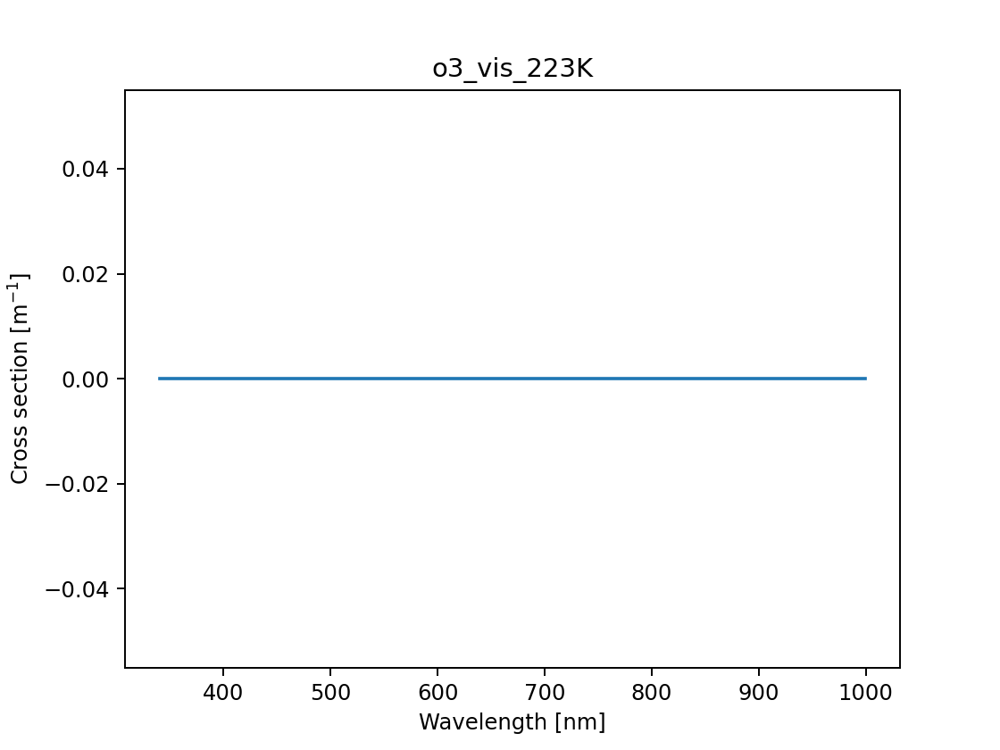

<IPython.core.display.Javascript object>


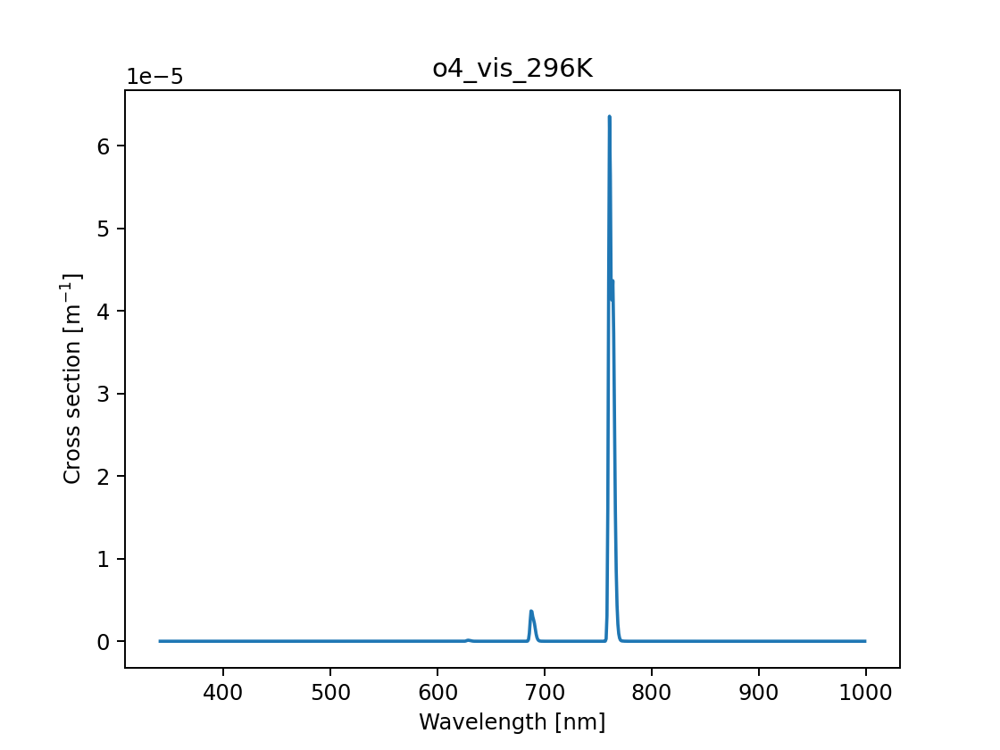

<IPython.core.display.Javascript object>


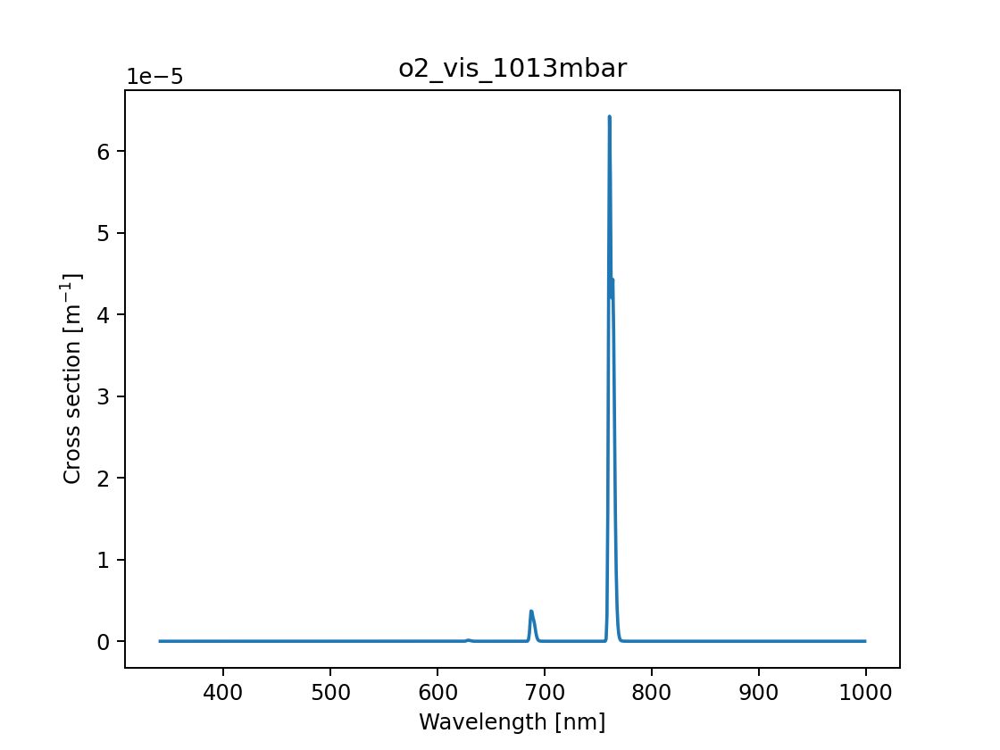

<IPython.core.display.Javascript object>


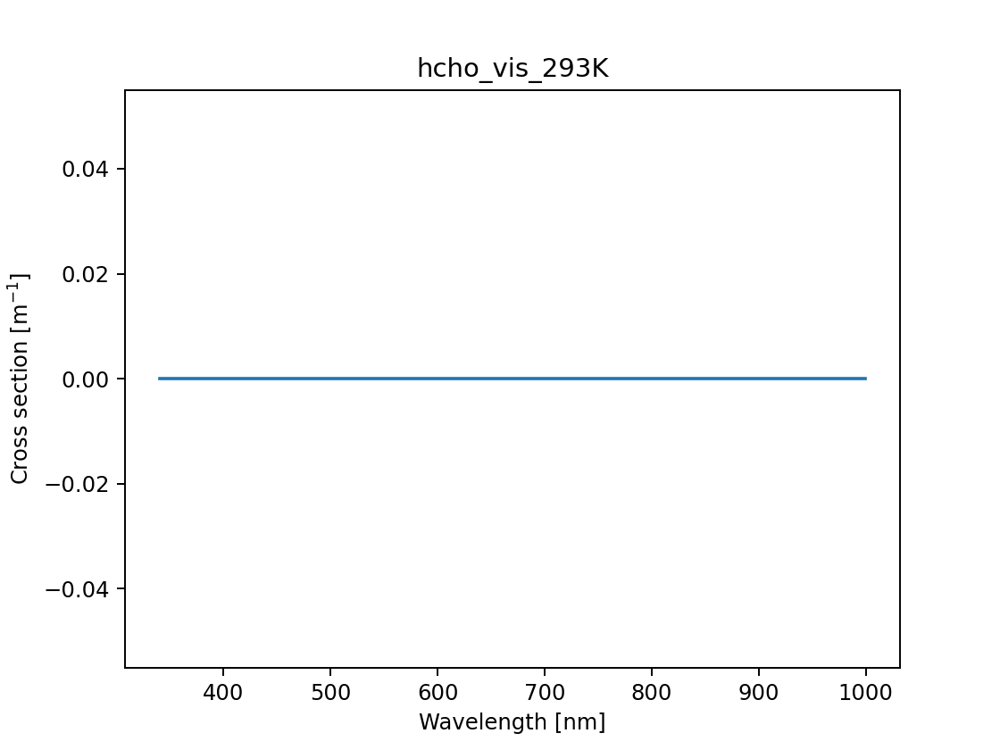

<IPython.core.display.Javascript object>


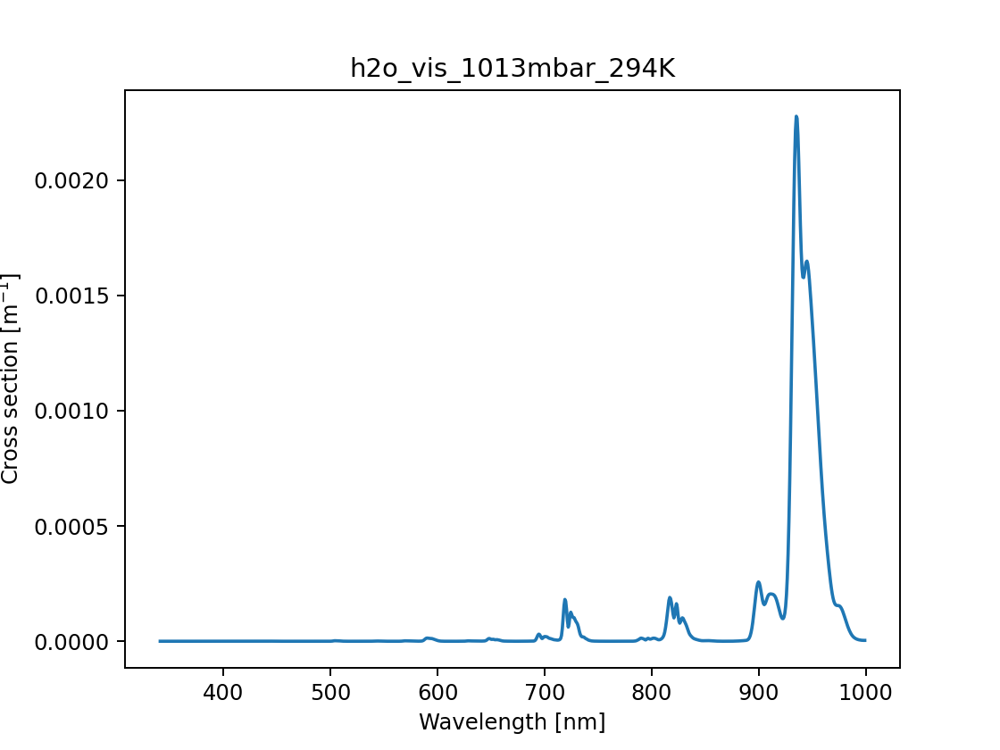

<IPython.core.display.Javascript object>


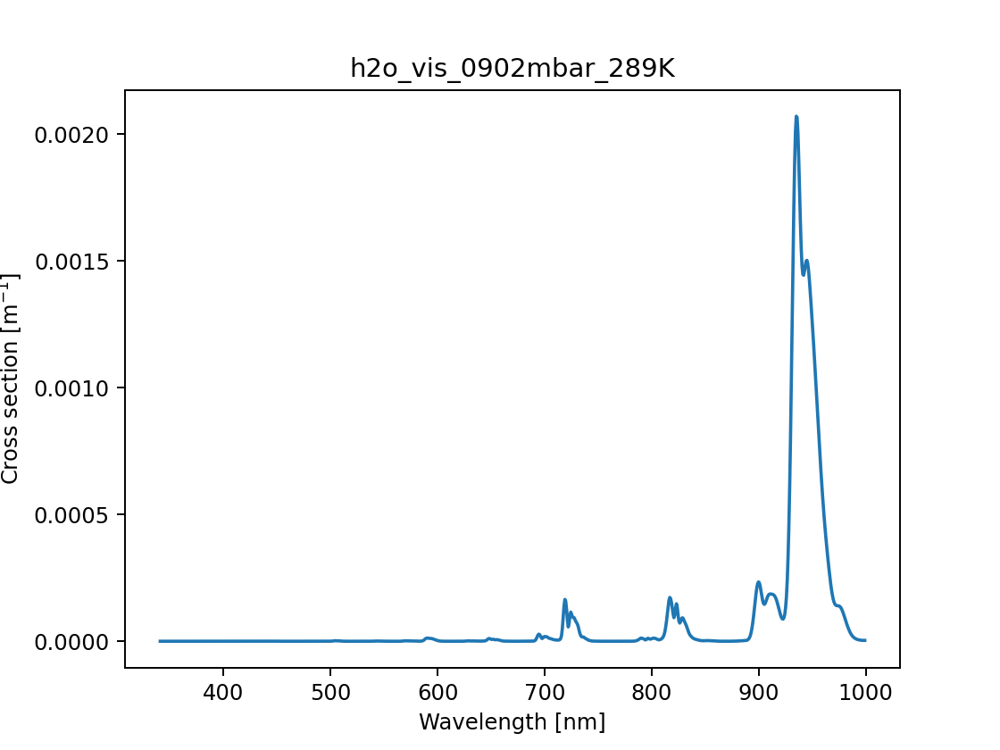

<IPython.core.display.Javascript object>


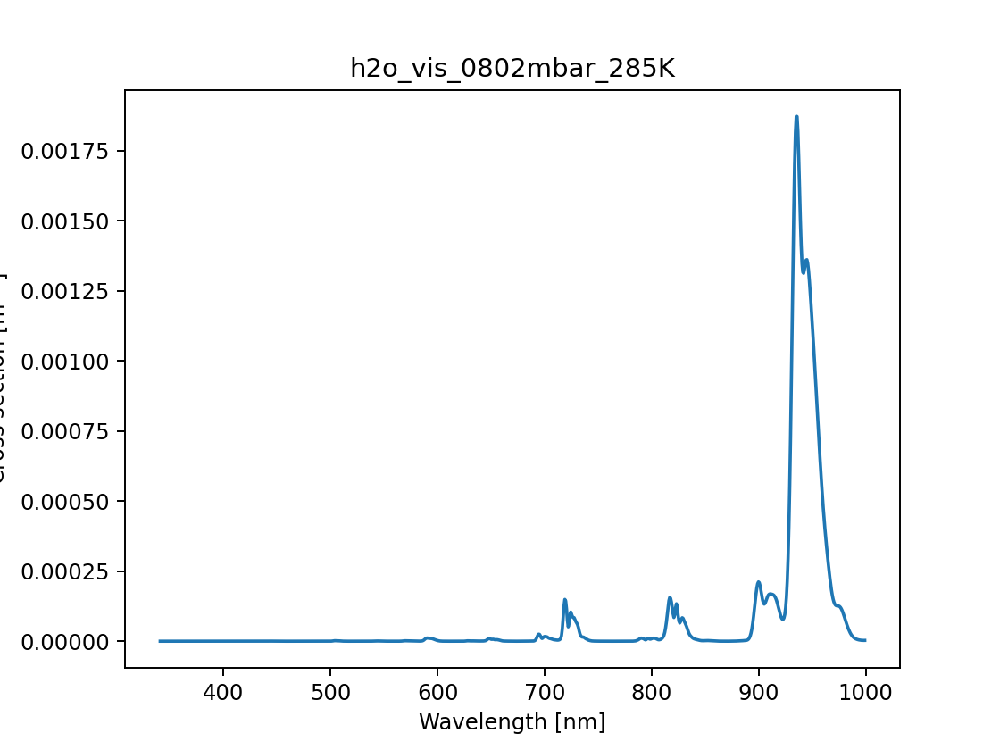

<IPython.core.display.Javascript object>


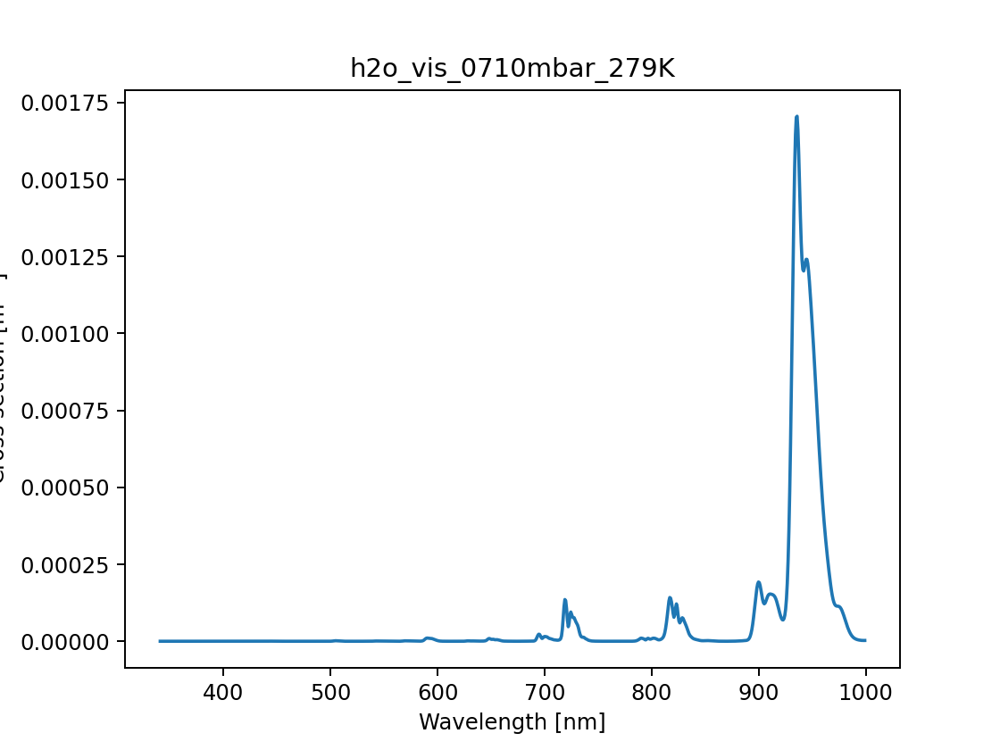

<IPython.core.display.Javascript object>


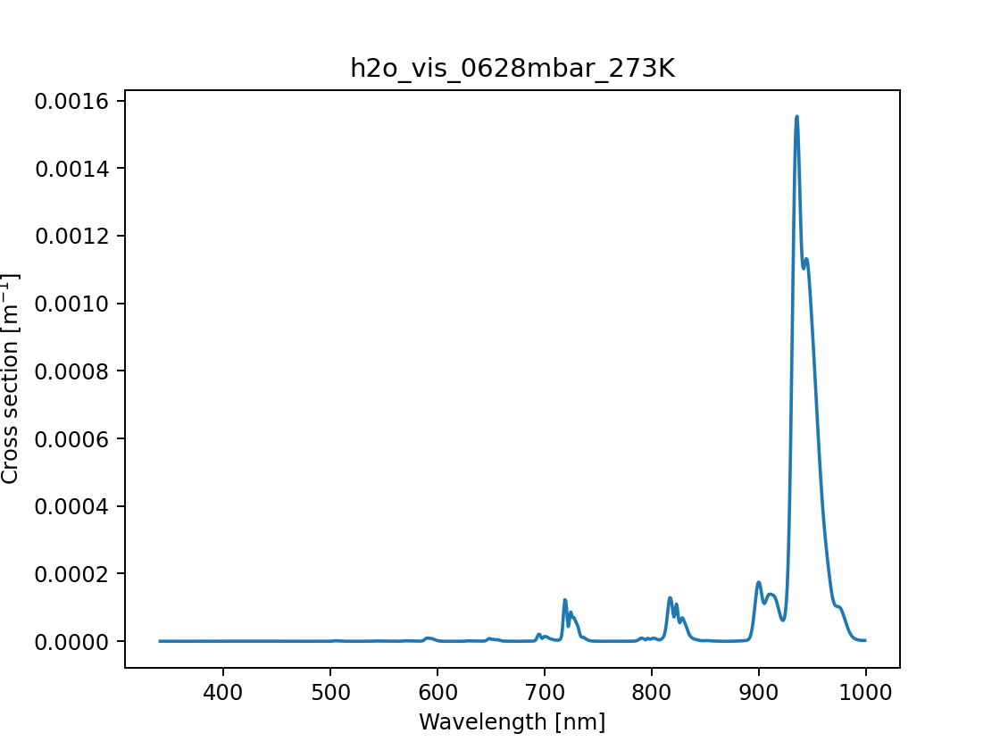

<IPython.core.display.Javascript object>


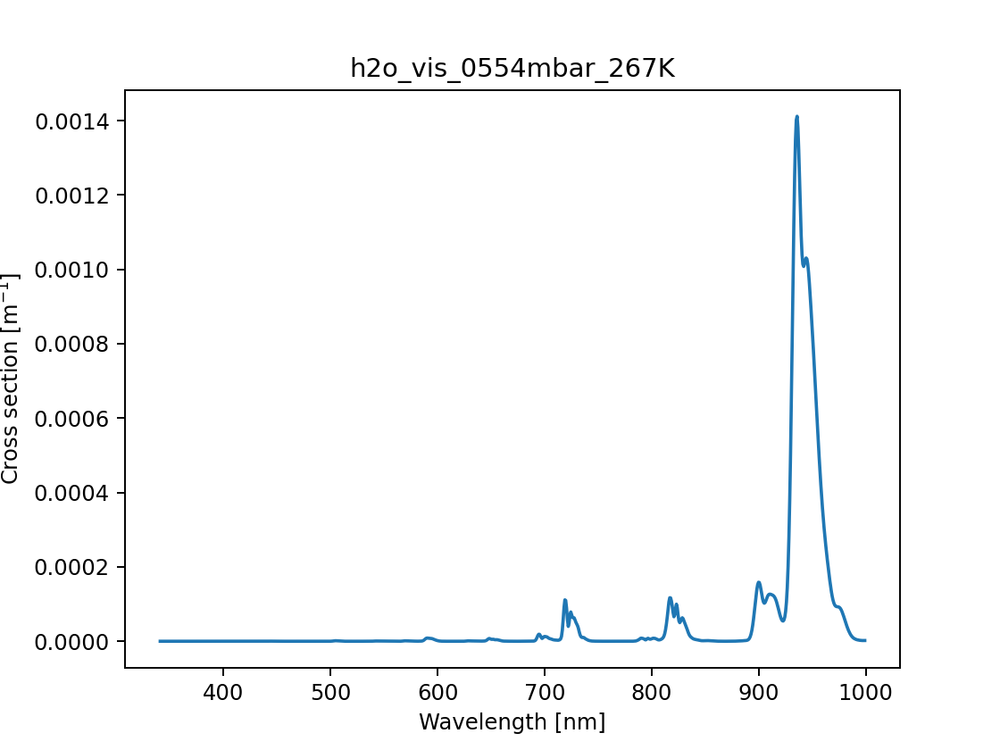

<IPython.core.display.Javascript object>


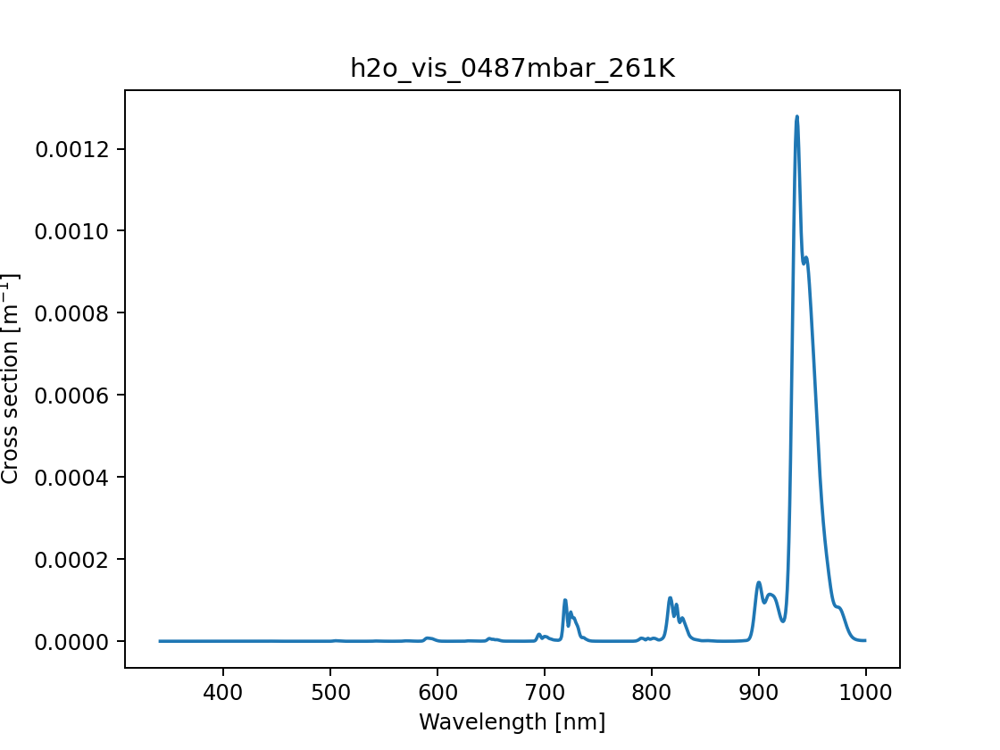

<IPython.core.display.Javascript object>


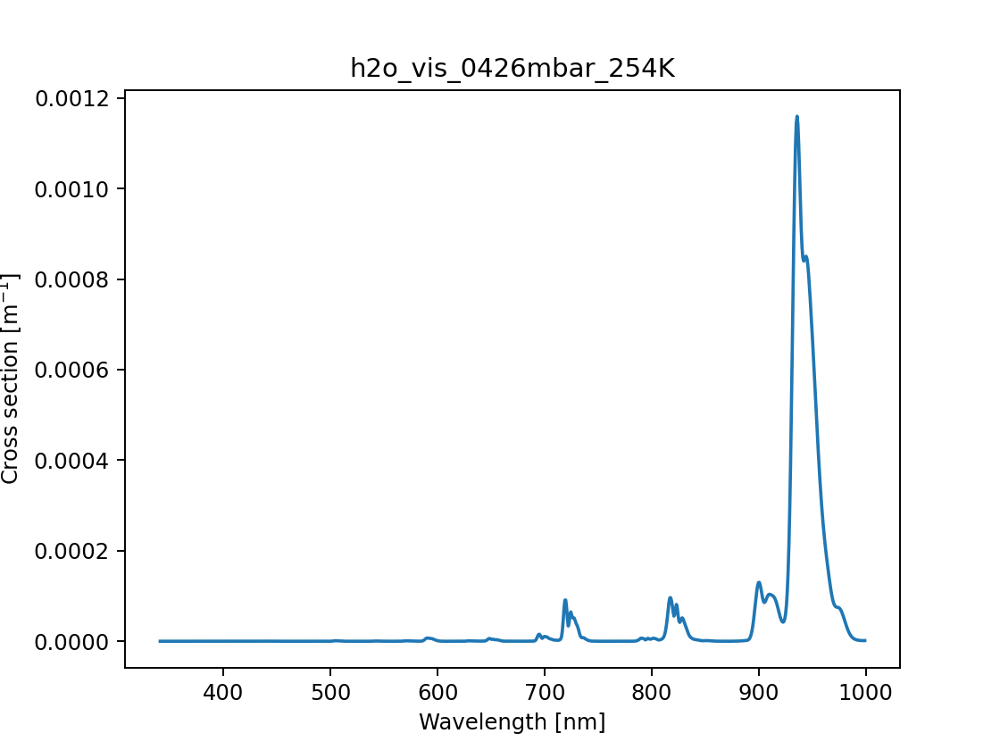

<IPython.core.display.Javascript object>


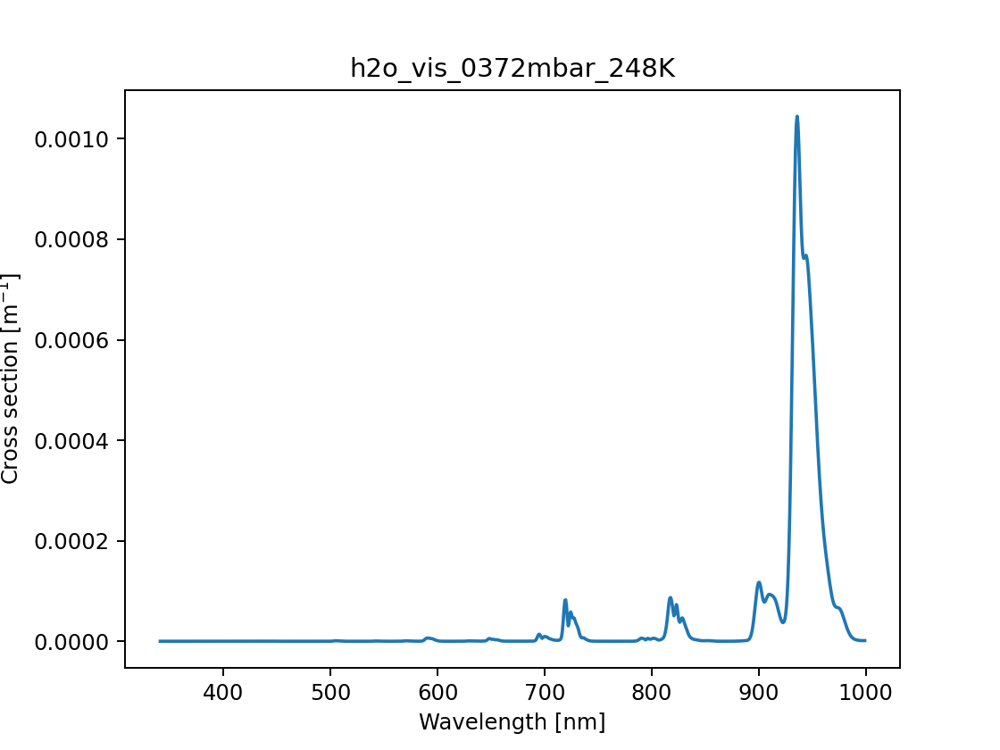

<IPython.core.display.Javascript object>


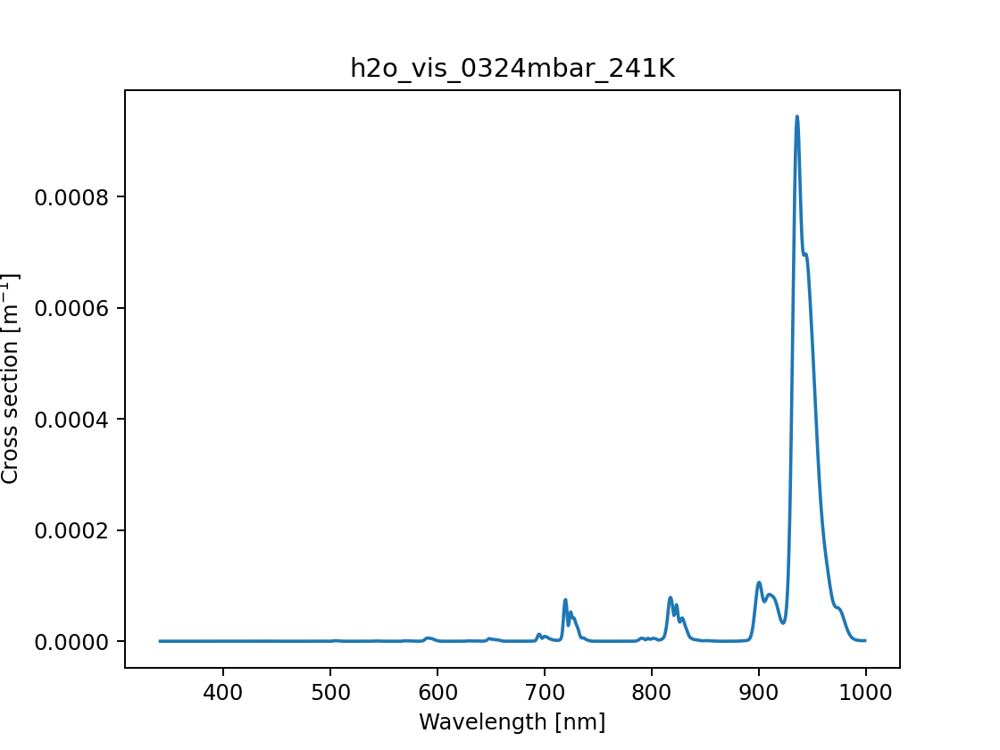

<IPython.core.display.Javascript object>


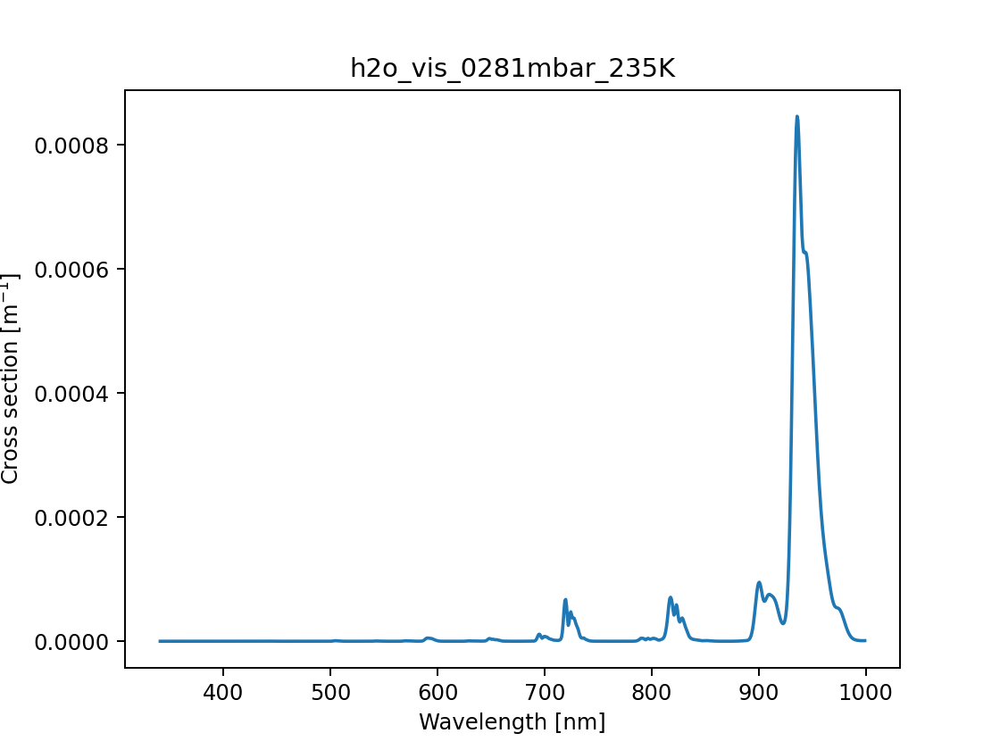

<IPython.core.display.Javascript object>


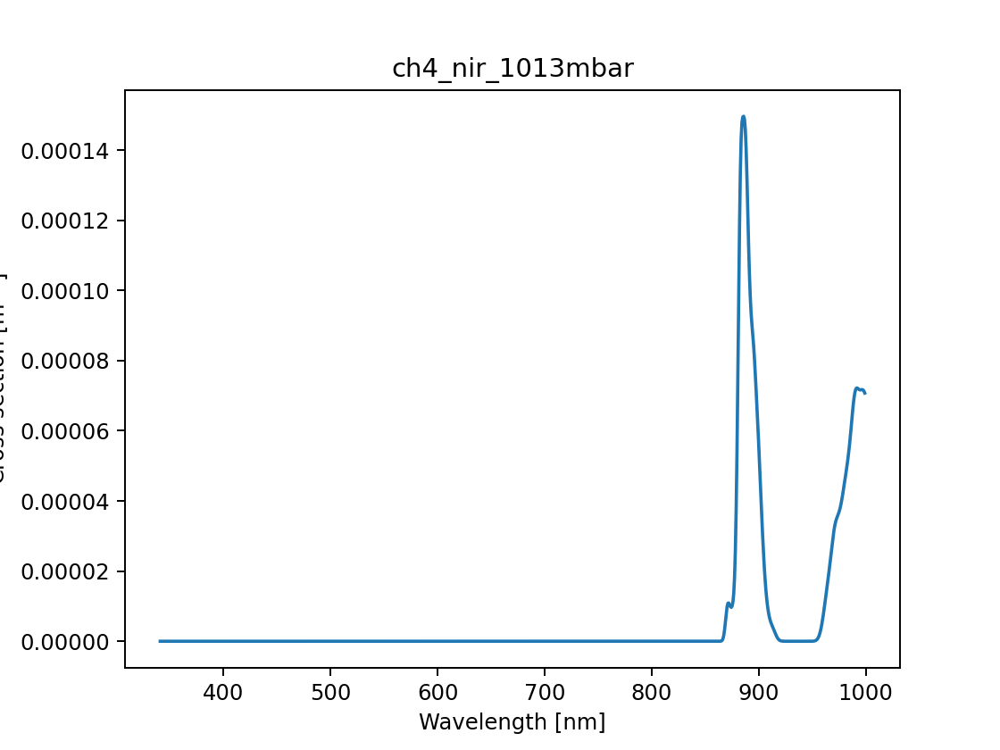

<IPython.core.display.Javascript object>


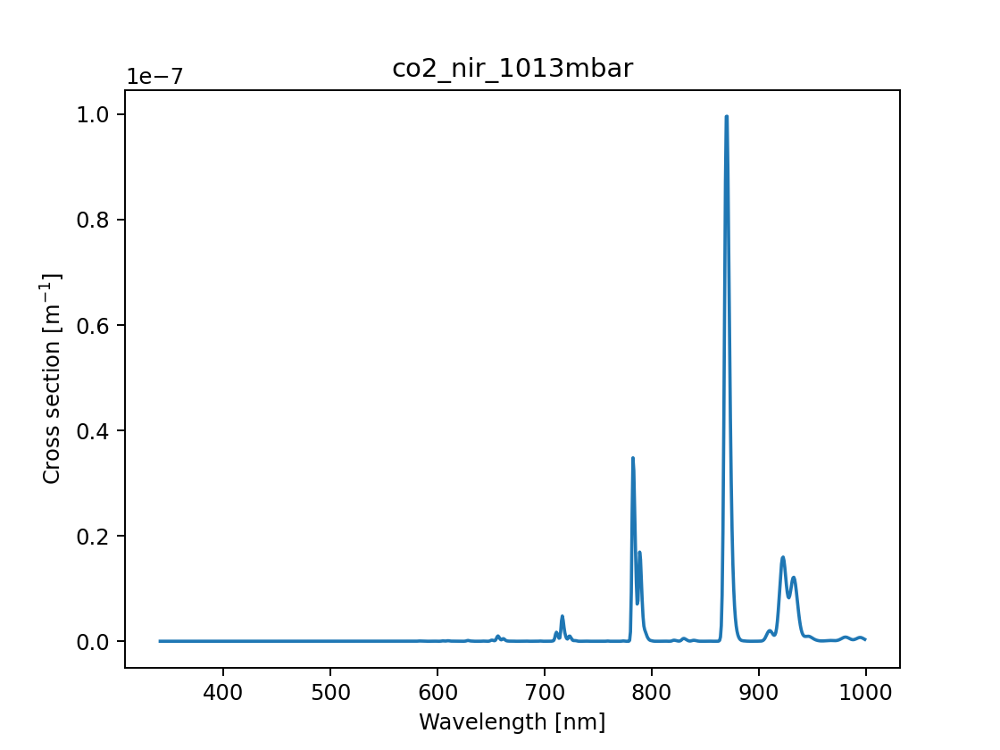

<IPython.core.display.Javascript object>


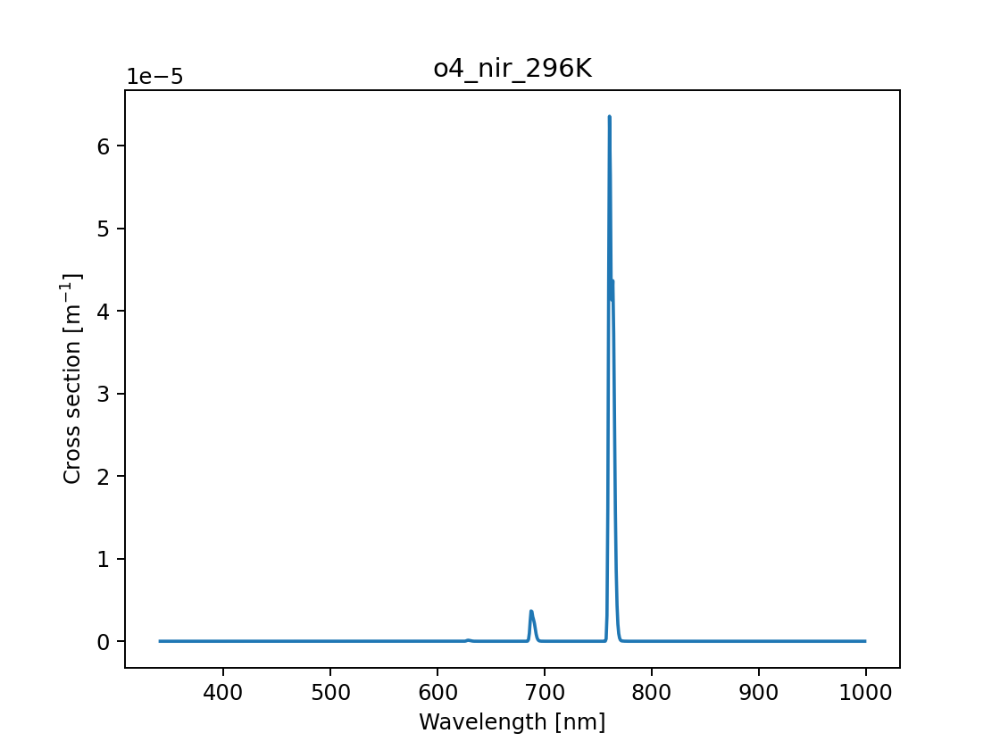

In [277]:
for k in list(gases.keys()):
    plt.figure()
    plt.plot(s['vis_nm'][0],gases[k]['xs_vis'])
    plt.xlabel('Wavelength [nm]')
    plt.ylabel('Cross section [m$^{{-1}}$]')
    plt.title(k)

## Compare to current 4STARB cross sections

In [278]:
xs_4starb = sio.loadmat(fp+'cross_sections_4starb.mat')

<IPython.core.display.Javascript object>


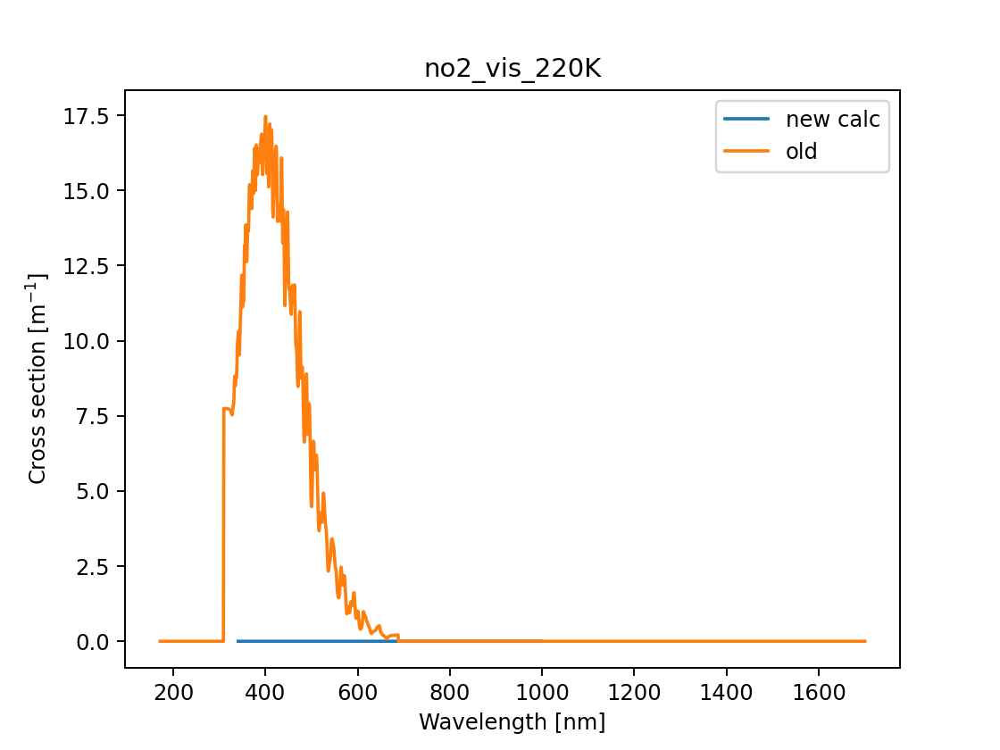

<IPython.core.display.Javascript object>


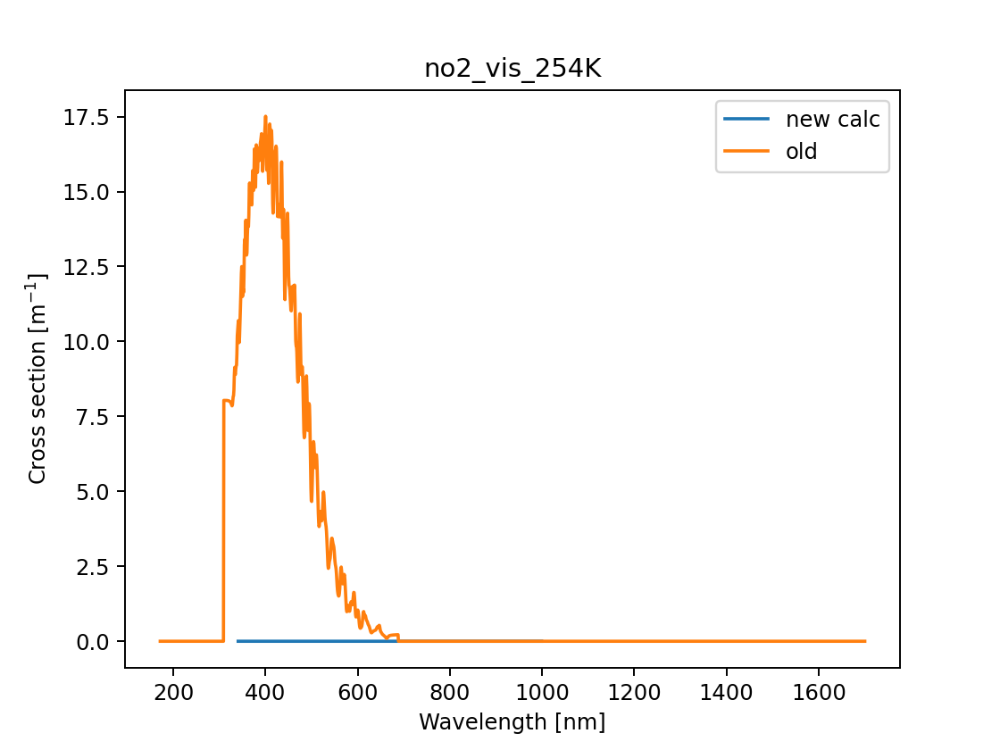

<IPython.core.display.Javascript object>


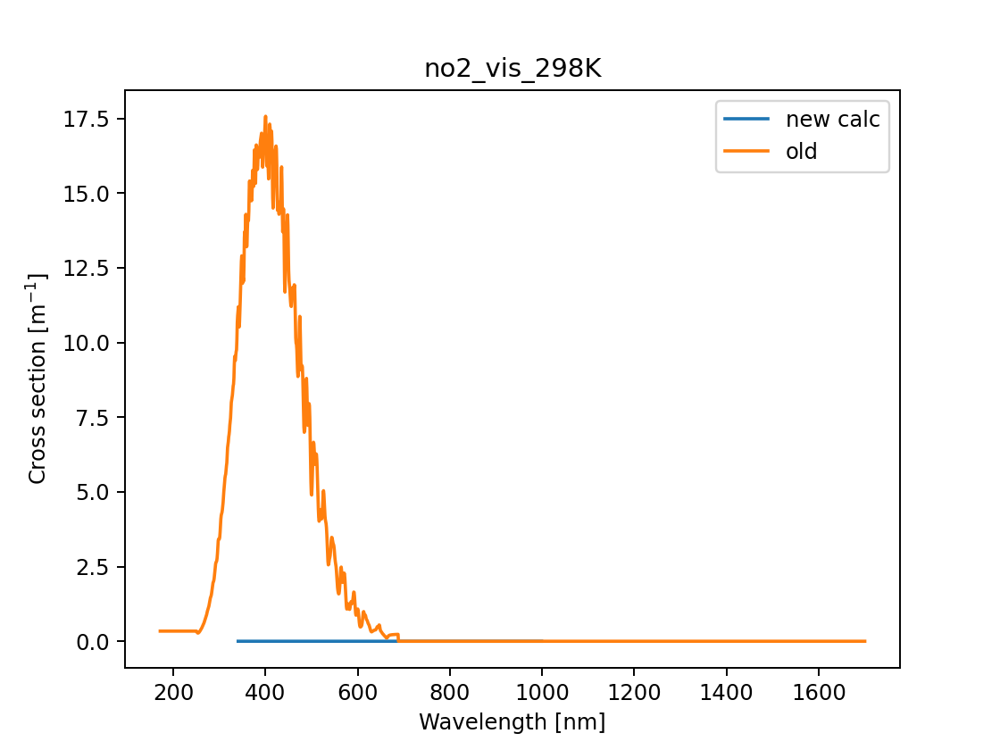

<IPython.core.display.Javascript object>


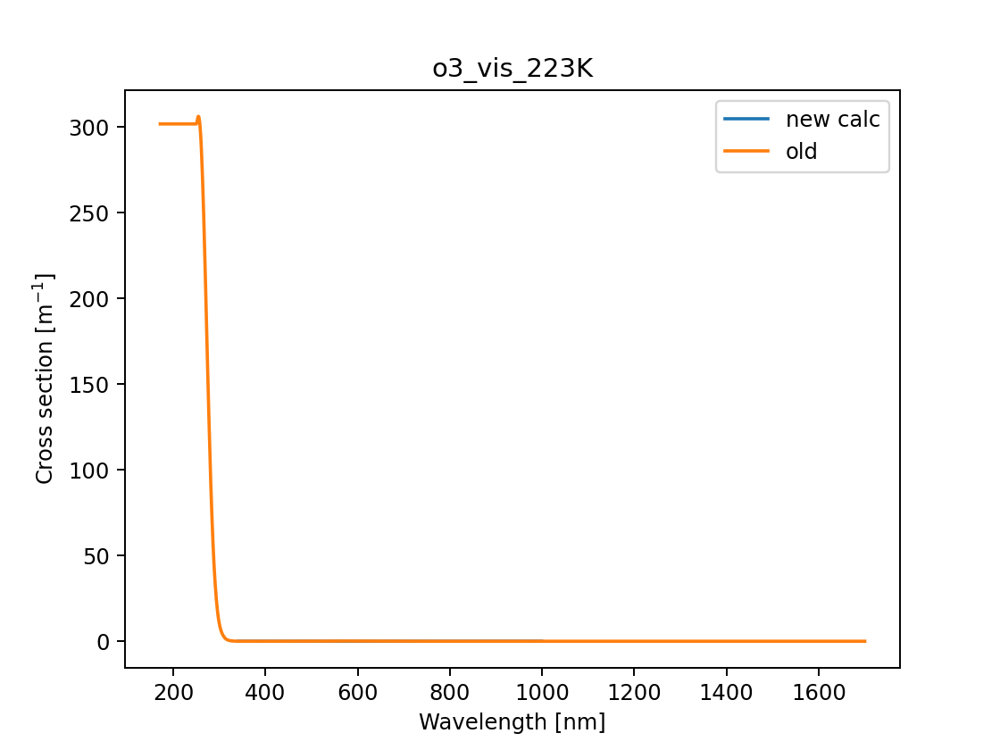

<IPython.core.display.Javascript object>


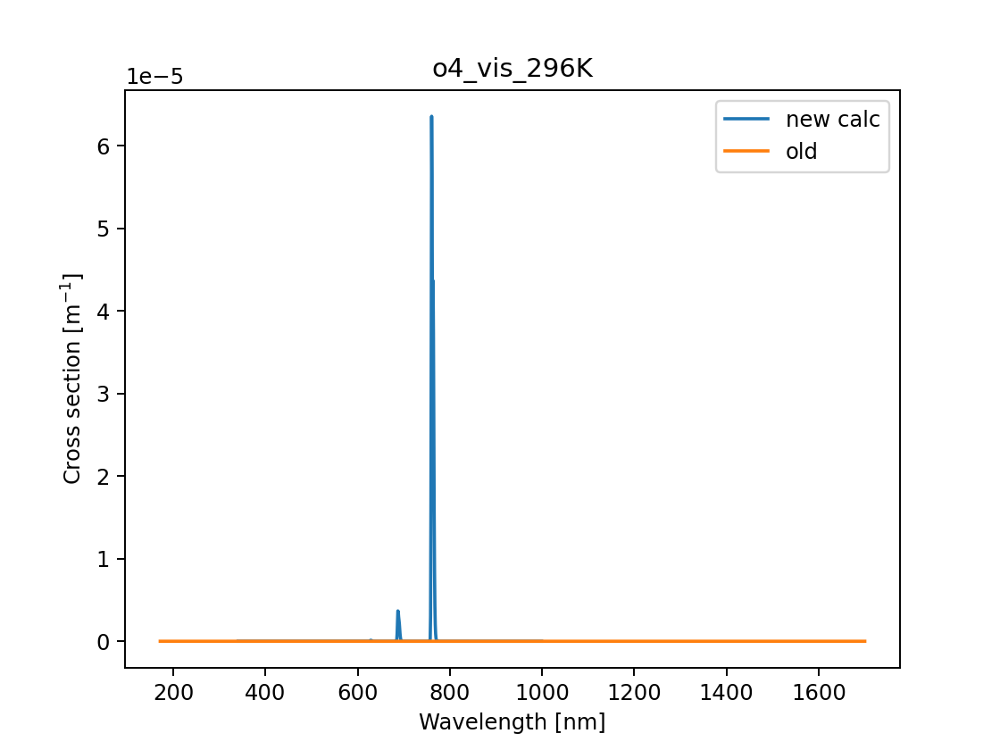

<IPython.core.display.Javascript object>


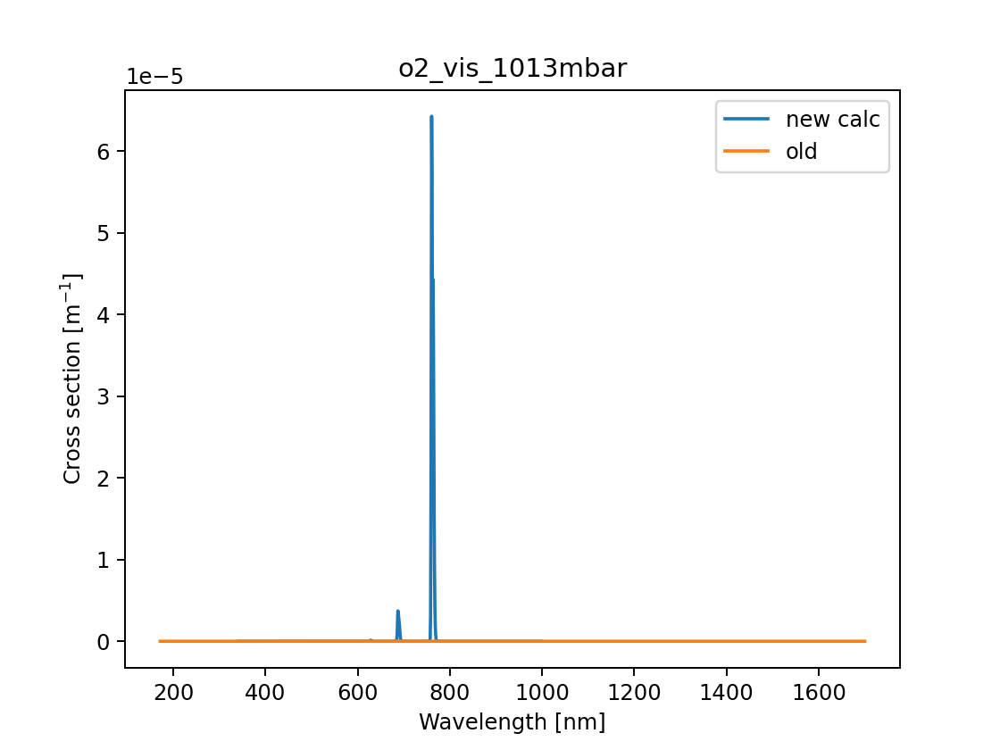

<IPython.core.display.Javascript object>


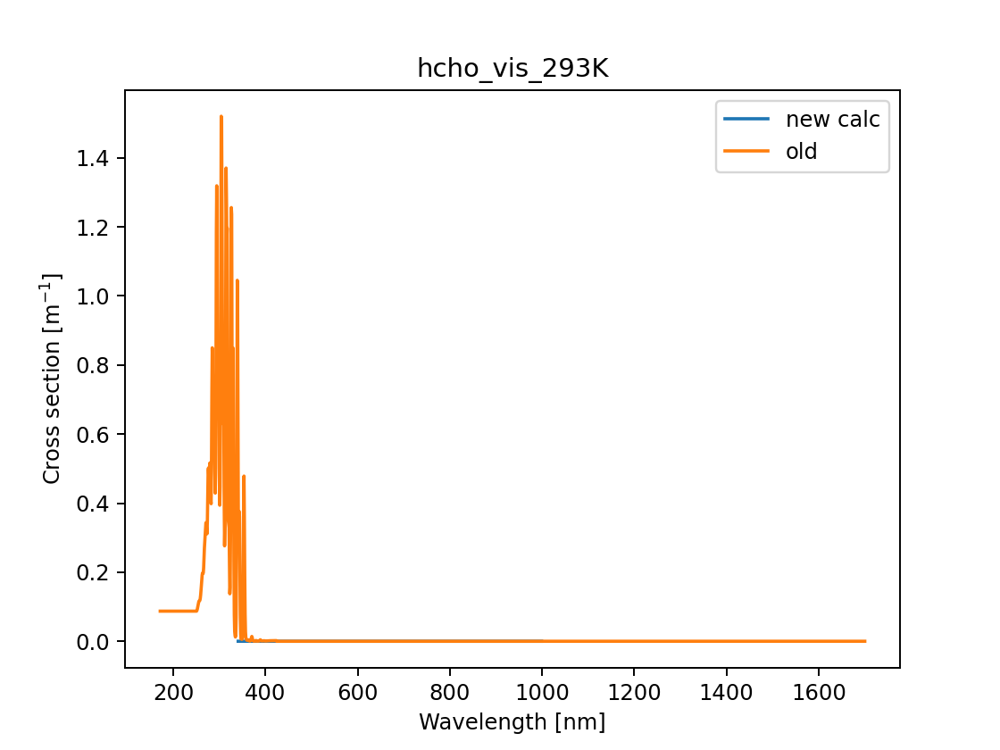

<IPython.core.display.Javascript object>


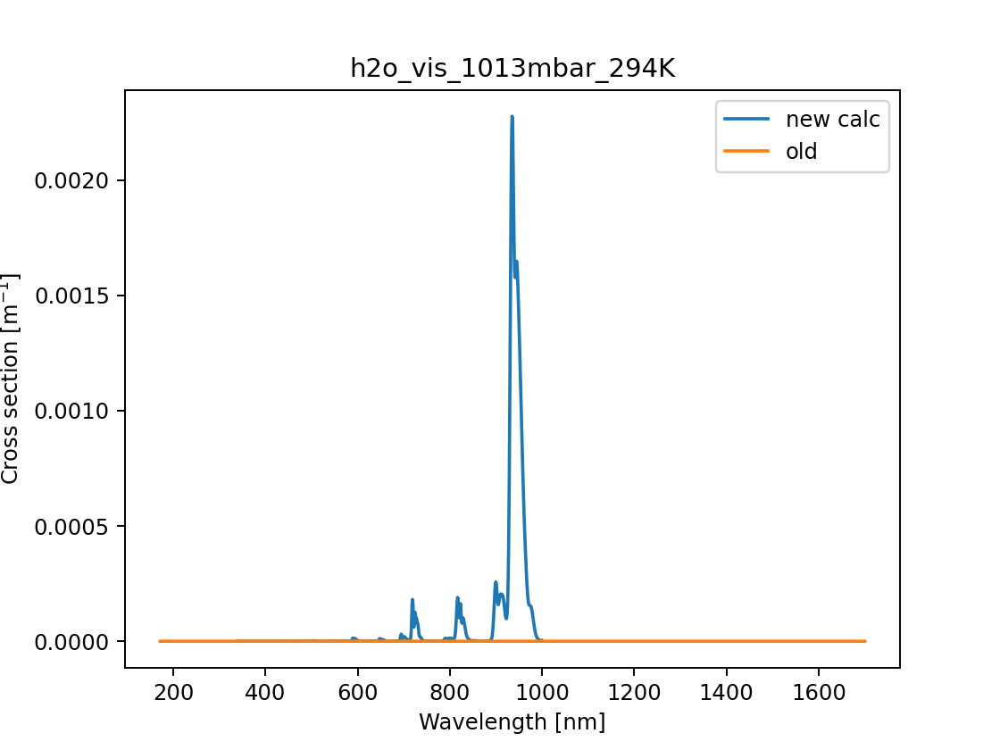

<IPython.core.display.Javascript object>


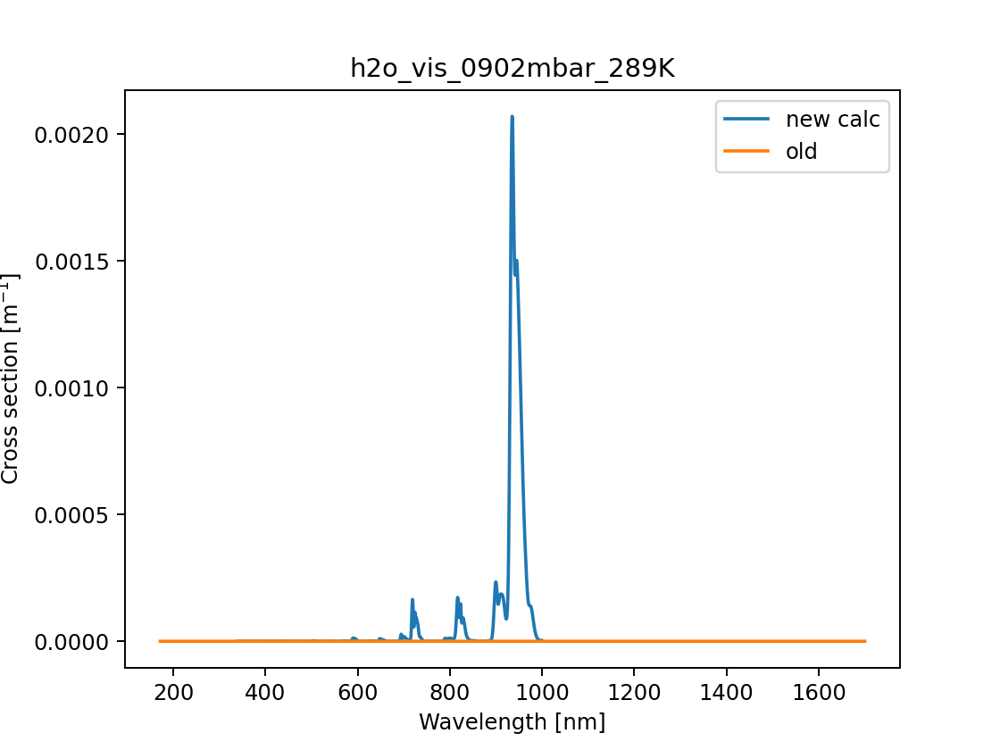

<IPython.core.display.Javascript object>


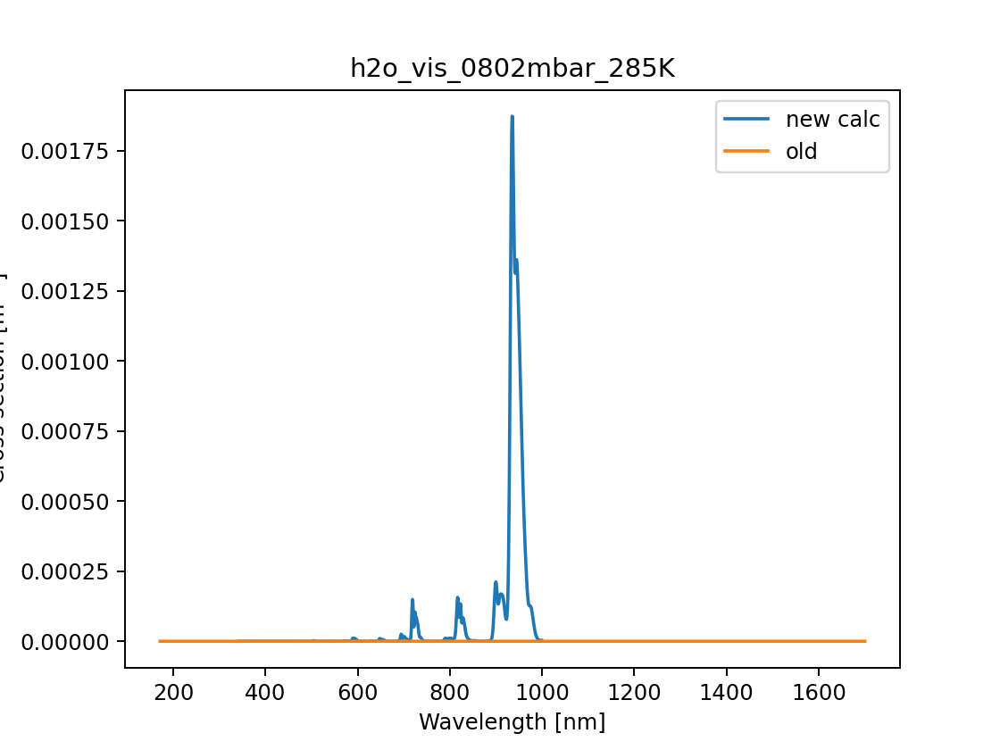

<IPython.core.display.Javascript object>


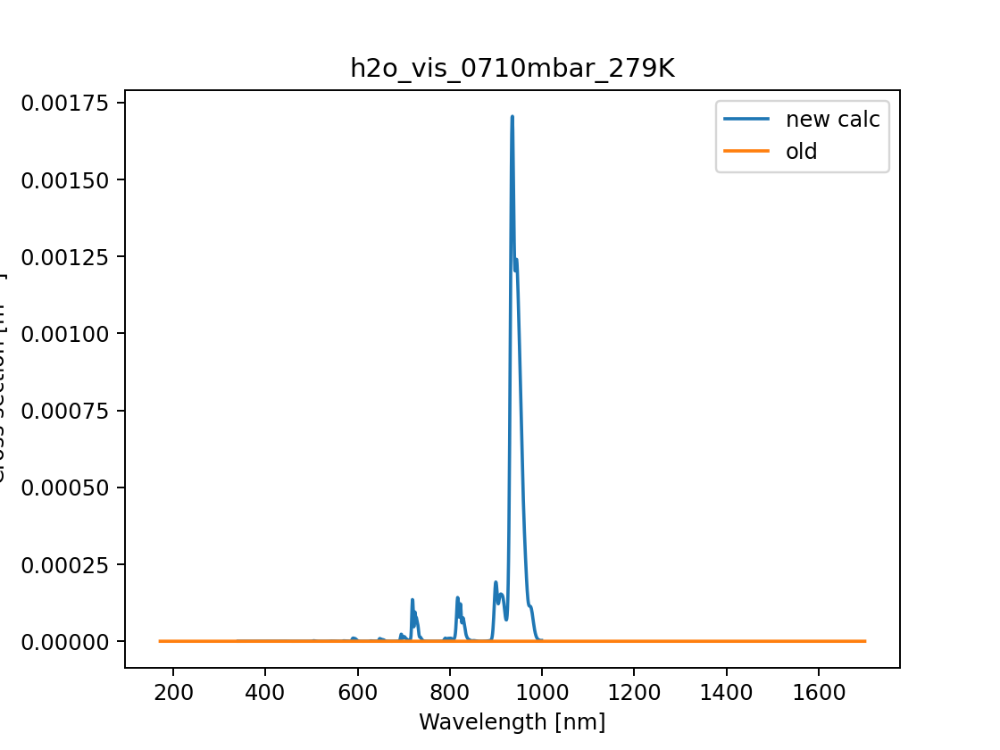

<IPython.core.display.Javascript object>


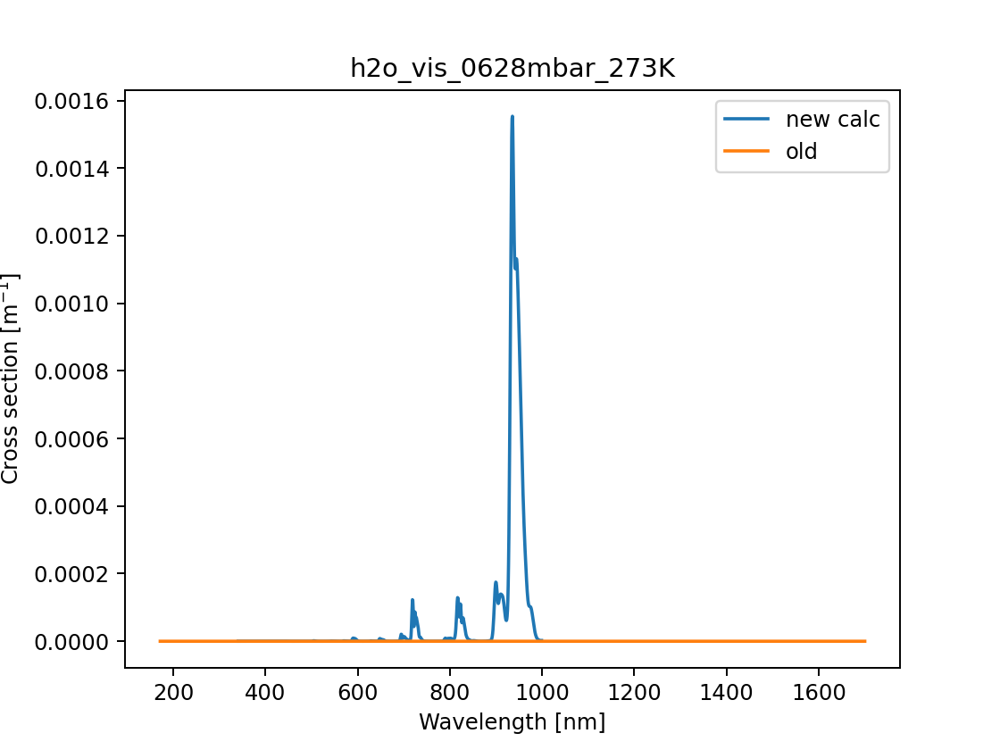

<IPython.core.display.Javascript object>


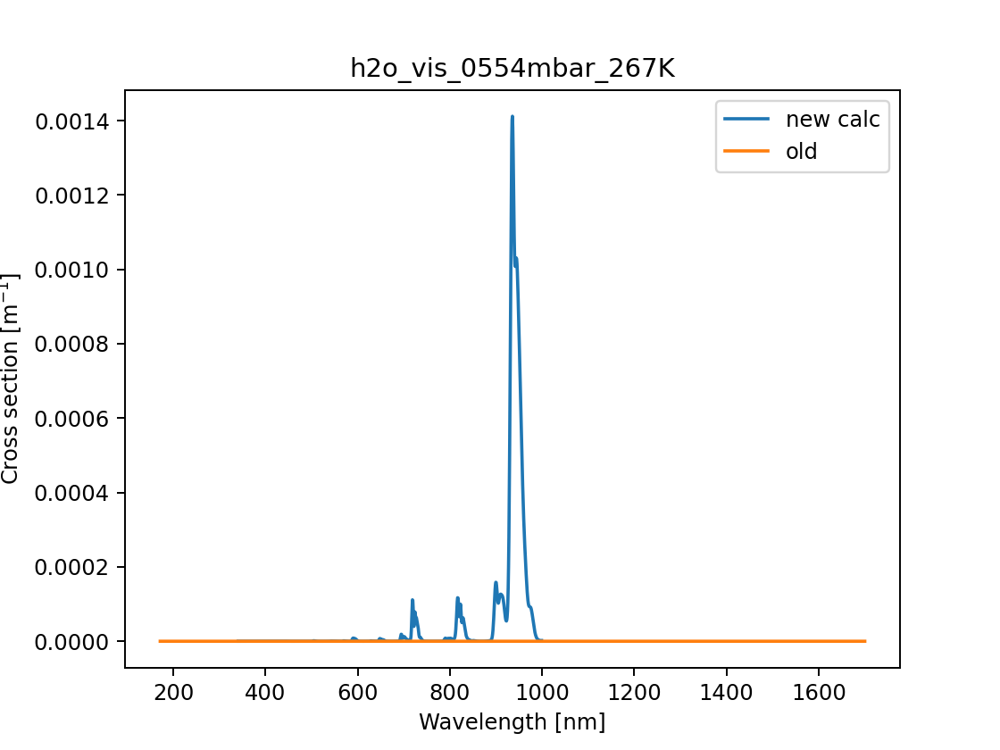

<IPython.core.display.Javascript object>


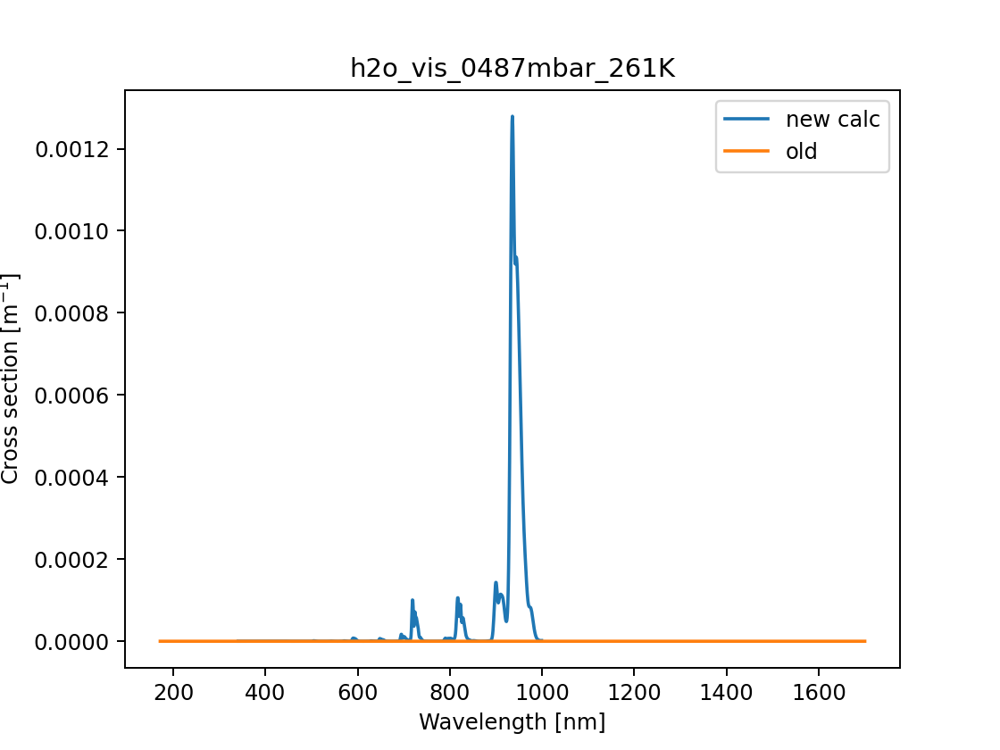

<IPython.core.display.Javascript object>


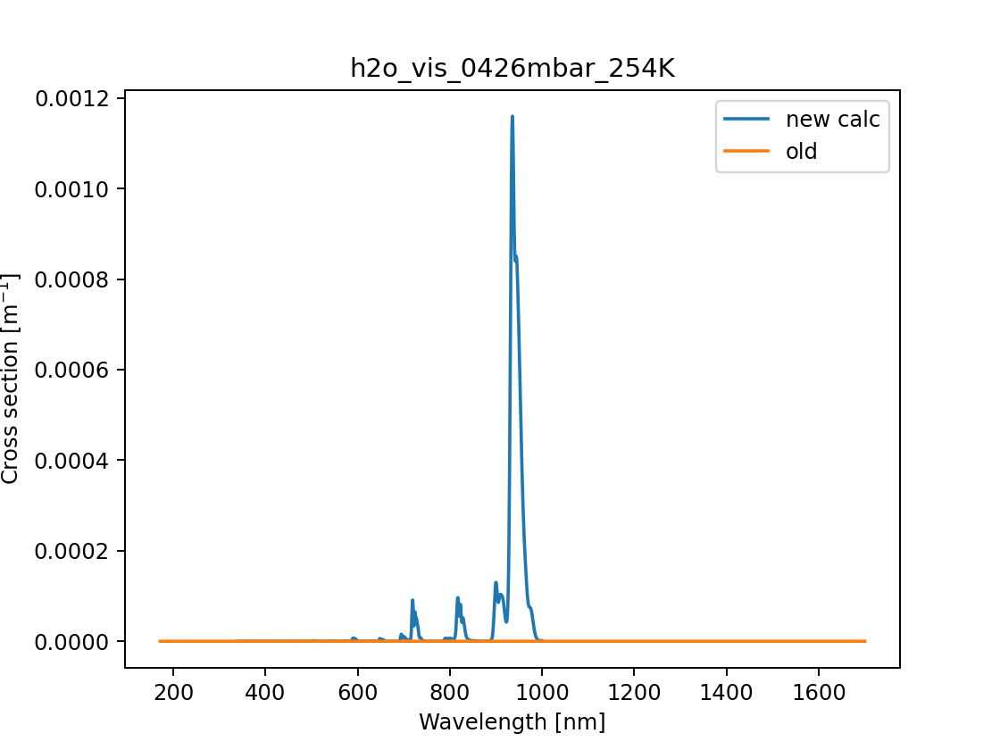

<IPython.core.display.Javascript object>


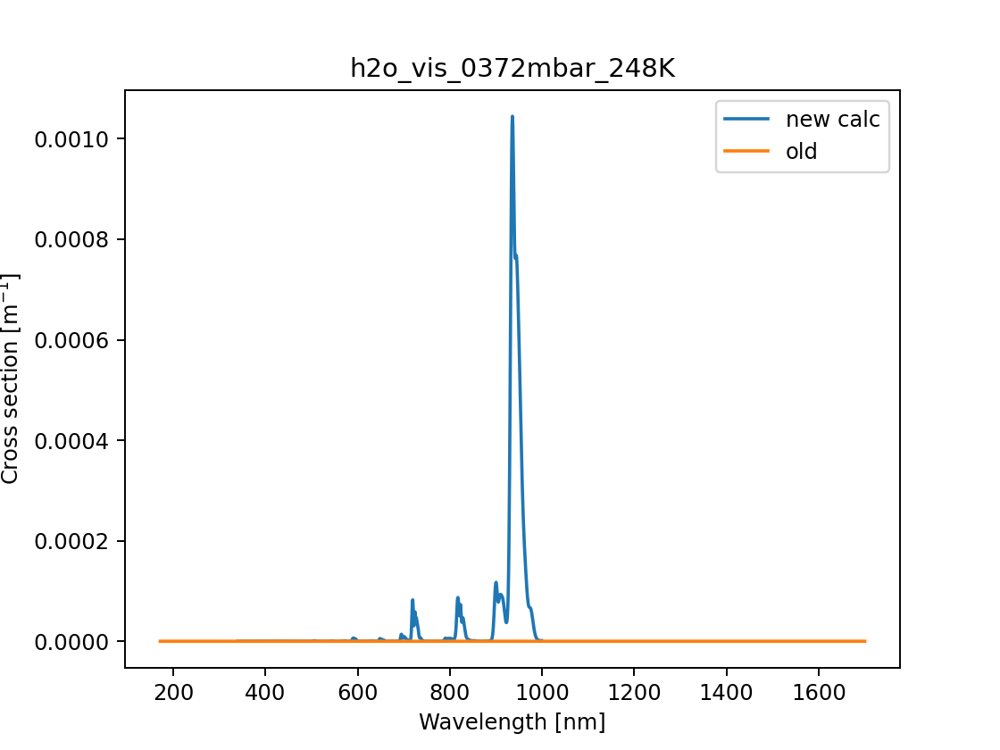

<IPython.core.display.Javascript object>


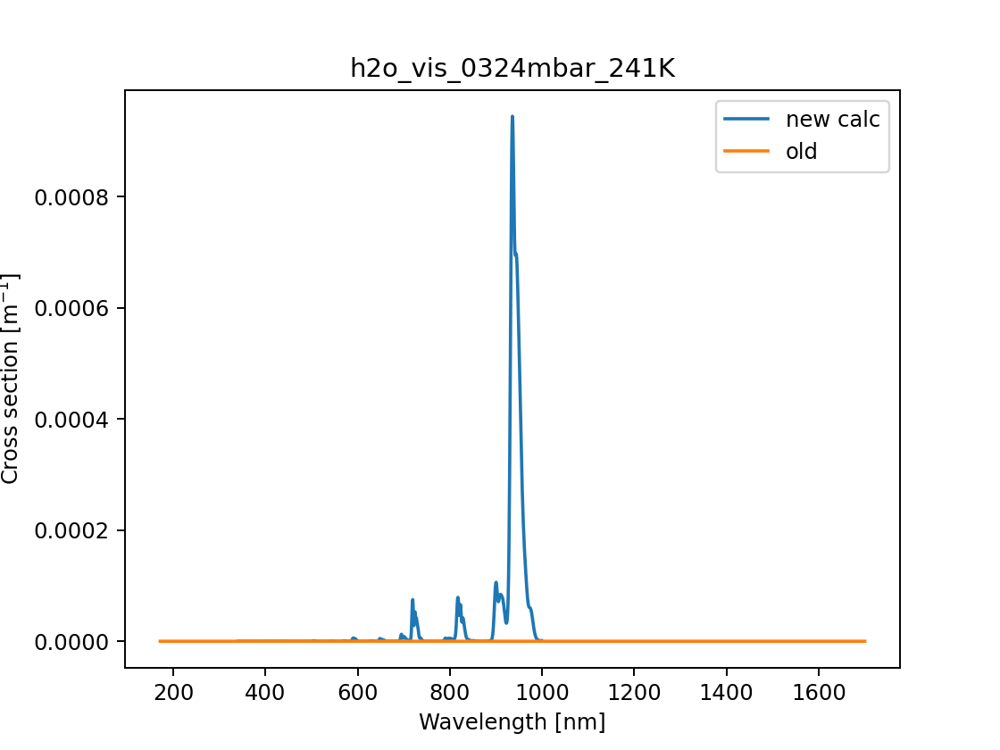

<IPython.core.display.Javascript object>


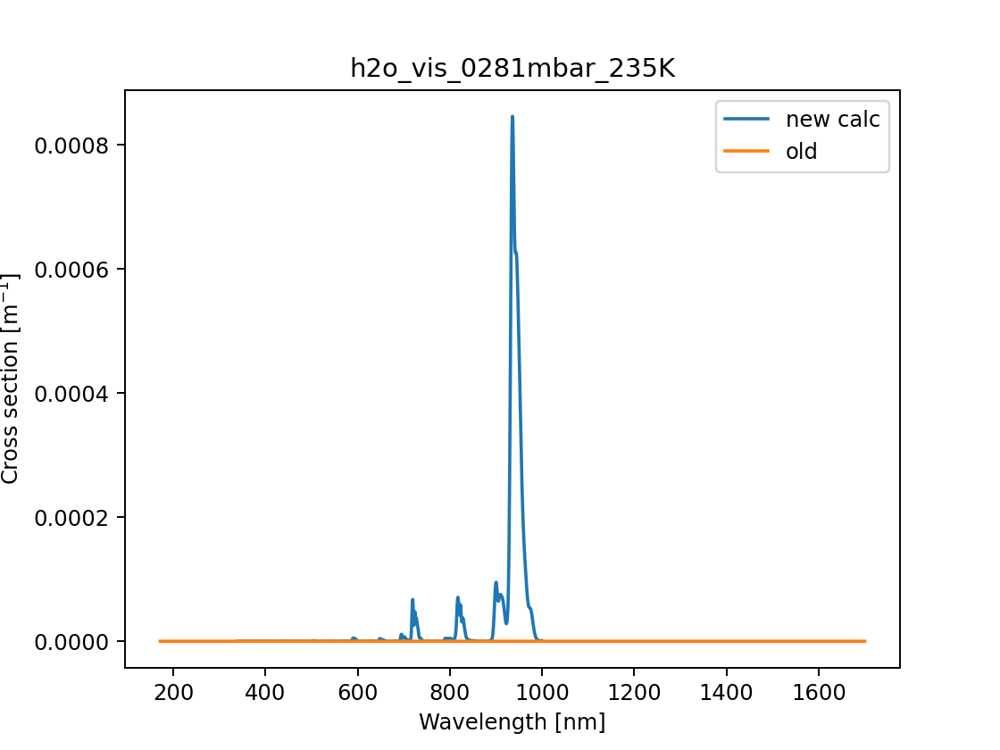

<IPython.core.display.Javascript object>


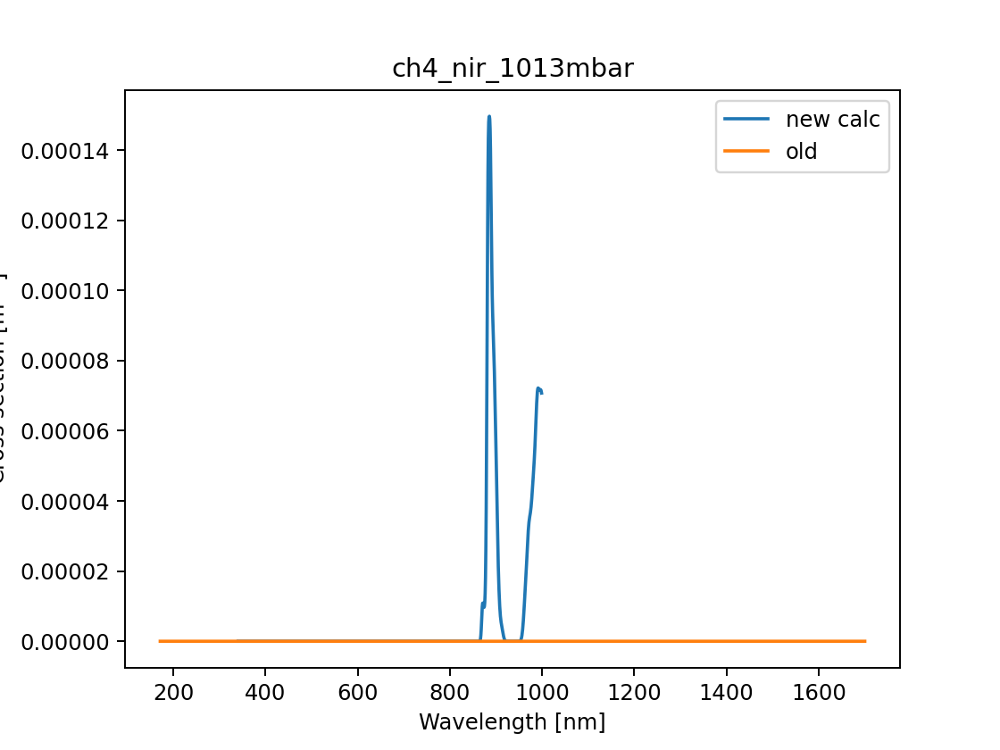

<IPython.core.display.Javascript object>


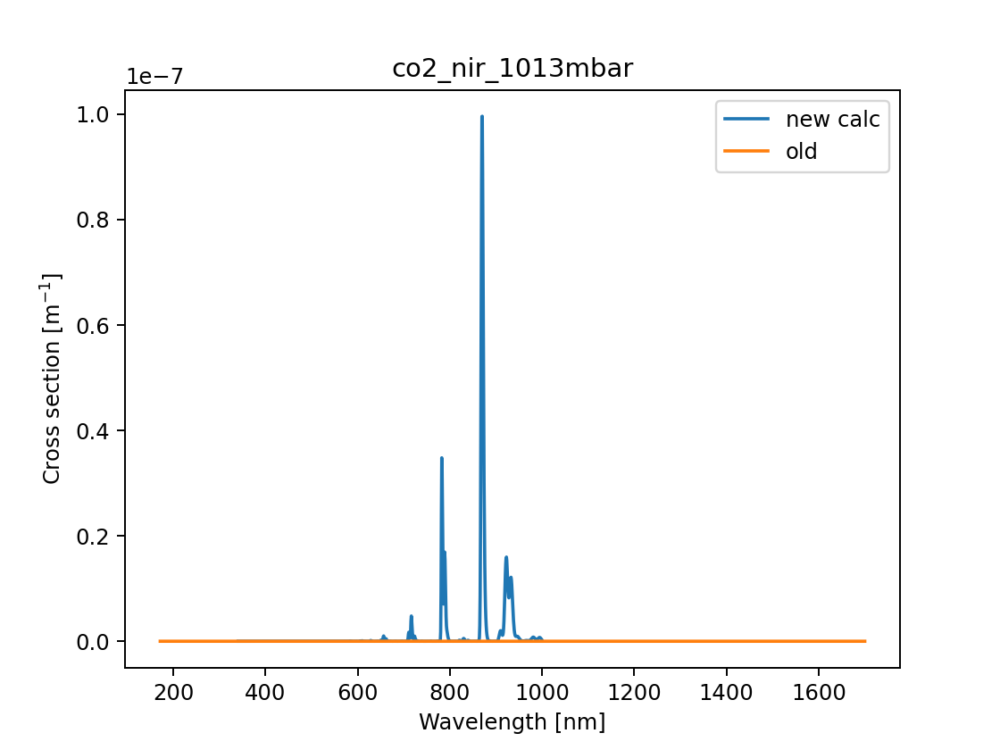

<IPython.core.display.Javascript object>


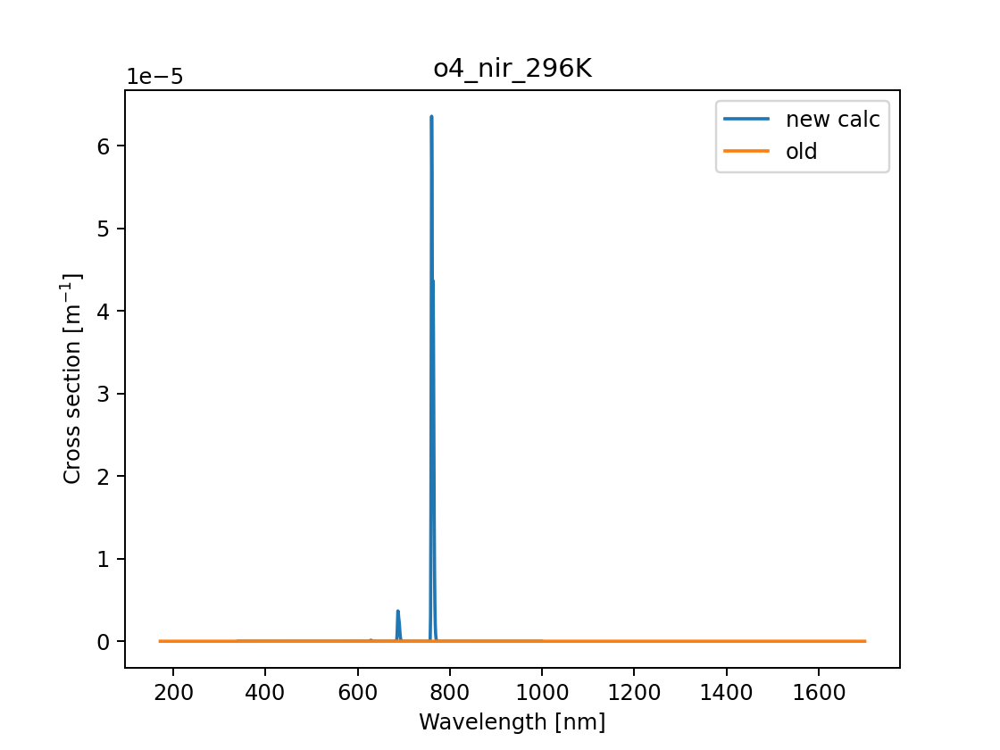

In [284]:
for k in list(gases.keys()):
    plt.figure()
    plt.plot(s['vis_nm'][0],gases[k]['xs_vis'],label='new calc')
    plt.plot(xs_4starb['wln_4starb'],xs_4starb[k+'_interp'],label='old')
    plt.xlabel('Wavelength [nm]')
    plt.ylabel('Cross section [m$^{{-1}}$]')
    plt.title(k)
    plt.legend()